## https://www.kaggle.com/competitions/ieee-fraud-detection

Este notebook engloba os seguinte passos:

* Análise Exploratória de Dados
* Feature Engineering
    * Tratando Colunas com Valores Faltantes (deletar colunas com 75% de valores faltantes) 
    * Tratando Linhas com Valores Faltantes (deletar linhas com 75% de valores faltantes)
    * Substituindo NaNs remanescentes por 0
    * Codificação de variáveis categóricas
* Redução de dimensionalidade
    * Seleção de atributos com teste do Qui-Quadrado (top 20 e top 50)
    * Seleçaõ de atributos com teste ANOVA (top 20 e top 50)
    * Seleção de atributos com análise de correlação (top 20 e top 50)
* Balanceamento de classes
    * Undersample com Resample e RUS
    * Oversample com Resample e ROS
* Separação entre base de treino e de teste, a partir da base de treino
* Treinamento dos algoritmos e análise de desempenho, com validação cruzada (10 folds)
    * Algoritmos utilizados
        * Extra Trees
        * Random Forest
        * Decision Tree
        * CatBoost
        * XGBoost (tentativa)
        * LGBM (tentativa)
        * Gradient Boost Classifier
        * AdaBoost
        * Logistic Regression
        * KNN
        * SVM (tentativa)
        * Naive Bayes
    * Métricas de desempenho
        * Acurácia
        * F1-score
        * Recall
        * Precision
        * Wall time

# Sobre os Dados

## Tabela Transação

* `TransactionDT`: timedelta from a given reference datetime (not an actual timestamp)

* `TransactionAMT`: transaction payment amount in USD

* `ProductCD`: product code, the product for each transaction

* `card1 - card6`: payment card information, such as card type, card category, issue bank, country, etc.

* `addr`: address

* `dist`: distance

* `P_ and (R__) emaildomain`: purchaser and recipient email domain

* `C1-C14`: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.

* `D1-D15`: timedelta, such as days between previous transaction, etc.

* `M1-M9`: match, such as names on card and address, etc.

* `Vxxx`: Vesta engineered rich features, including ranking, counting, and other entity relations.

### Categorical Features

* `ProductCD`

* `card1 - card6`

* `addr1, addr2`

* `P_emaildomain`

* `R_emaildomain`

* `M1 - M9`

## Tabela Identidade

Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.

They're collected by Vesta’s fraud protection system and digital security partners.
(The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)

### Categorical Features

* `DeviceType`

* `DeviceInfo`

* `id_12 - id_38`

# Importando Bibliotecas

In [1]:
!pip install lightgbm
!pip install xgboost
!pip install catboost

In [2]:
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm_notebook
from sklearn.preprocessing import StandardScaler
from sklearn.svm import NuSVR, SVR
from sklearn.metrics import mean_absolute_error, log_loss, roc_auc_score, accuracy_score
from scipy import stats
pd.options.display.precision = 15

import lightgbm as lgb
import xgboost as xgb
import time
import datetime
from catboost import CatBoostRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, \
KFold, RepeatedKFold, GroupKFold, GridSearchCV, train_test_split, TimeSeriesSplit
from sklearn import metrics
from sklearn import linear_model
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import VarianceThreshold
import gc
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
plt.style.use("ggplot")
color_pal = [x['color'] for x in plt.rcParams['axes.prop_cycle']]

In [3]:
start_time = time.time()

In [4]:
%%time

#limpando cache do CUDA
from numba import cuda
cuda.select_device(0)
cuda.close()
cuda.select_device(0)

SystemError: initialization of _internal failed without raising an exception

In [5]:
# checar utilização de memória
!pip install GPUtil

from GPUtil import showUtilization as gpu_usage
gpu_usage() 

| ID | GPU | MEM |
------------------


In [6]:
#limpando cache do CUDA
!pip install torch
import torch
torch.cuda.empty_cache()

# Importando Dados

In [7]:
t0 = time.time()

In [8]:
folder_path = ''
train_identity = pd.read_csv(f'{folder_path}train_identity.csv')
train_transaction = pd.read_csv(f'{folder_path}train_transaction.csv')
test_identity = pd.read_csv(f'{folder_path}test_identity.csv')
test_transaction = pd.read_csv(f'{folder_path}test_transaction.csv')
sub = pd.read_csv(f'{folder_path}sample_submission.csv')

# combinando dados de transações e de identidade
train = pd.merge(train_transaction, train_identity, on = 'TransactionID', how = 'left')
test = pd.merge(test_transaction, test_identity, on = 'TransactionID', how = 'left')

In [9]:
print(f'Train dataset has {train.shape[0]} rows and {train.shape[1]} columns.')
print(f'Test dataset has {test.shape[0]} rows and {test.shape[1]} columns.')

Train dataset has 590540 rows and 434 columns.
Test dataset has 506691 rows and 433 columns.


# Análise Exploratória de Dados

## Estatística Básica

Olhando as estatísticas básicas através da função `resumetable`

In [10]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values

    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = \
        round(stats.entropy(df[name].value_counts(normalize=True), base=2),2) 

    return summary

In [11]:
resumetable(train)[:25]

Dataset Shape: (590540, 434)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,TransactionID,int64,0,590540,2987000,2987001,2987002,19.170000000000002
1,isFraud,int64,0,2,0,0,0,0.220000000000000
2,TransactionDT,int64,0,573349,86400,86401,86469,19.109999999999999
3,TransactionAmt,float64,0,20902,68.5,29.0,59.0,8.350000000000000
4,ProductCD,object,0,5,W,W,W,1.280000000000000
5,card1,int64,0,13553,13926,2755,4663,9.970000000000001
6,card2,float64,8933,500,NaN,404.0,490.0,6.320000000000000
7,card3,float64,1565,114,150.0,150.0,150.0,0.680000000000000
8,card4,object,1577,4,discover,mastercard,visa,1.090000000000000
9,card5,float64,4259,119,142.0,102.0,166.0,2.660000000000000


In [12]:
resumetable(test)[:25]

Dataset Shape: (506691, 433)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,TransactionID,int64,0,506691,3663549,3663550,3663551,18.949999999999999
1,TransactionDT,int64,0,494686,18403224,18403263,18403310,18.899999999999999
2,TransactionAmt,float64,0,14119,31.949999999999999,49.0,171.0,8.080000000000000
3,ProductCD,object,0,5,W,W,W,1.370000000000000
4,card1,int64,0,13244,10409,4272,4476,9.949999999999999
5,card2,float64,8654,497,111.0,111.0,574.0,6.280000000000000
6,card3,float64,3002,115,150.0,150.0,150.0,0.810000000000000
7,card4,object,3086,4,visa,visa,visa,1.050000000000000
8,card5,float64,4547,102,226.0,226.0,226.0,2.630000000000000
9,card6,object,3007,3,debit,debit,debit,0.790000000000000


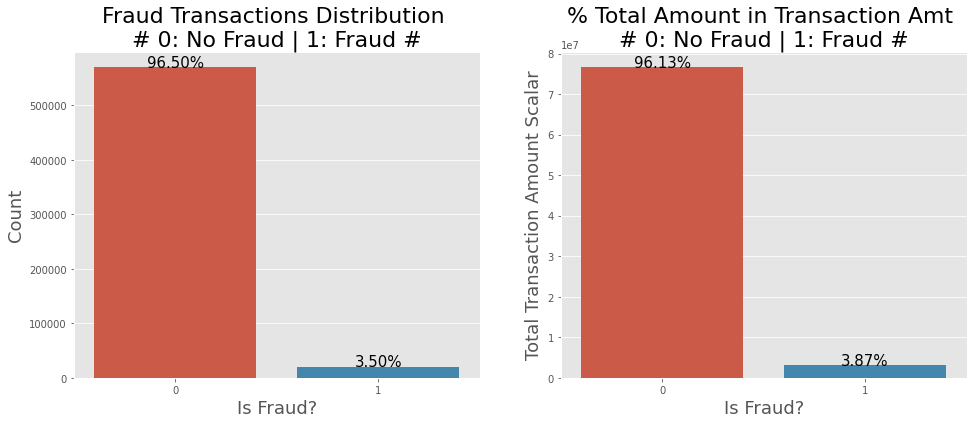

In [13]:
# checando o desbalanceamento dos dados através da contagem de linhas e TransactionAmt
train['TransactionAmt'] = train['TransactionAmt'].astype(float)
total = len(train)
total_amt = train.groupby(['isFraud'])['TransactionAmt'].sum().sum()
plt.figure(figsize = (16, 6))

plt.subplot(121)
g = sns.countplot(x = 'isFraud', data = train, )
g.set_title("Fraud Transactions Distribution \n# 0: No Fraud | 1: Fraud #", fontsize = 22)
g.set_xlabel("Is Fraud?", fontsize = 18)
g.set_ylabel('Count', fontsize = 18)

for p in g.patches:
    height = p.get_height()
    g.text(p.get_x() + p.get_width()/2.,
          height + 3,
          '{:1.2f}%'.format(height/total * 100),
          ha = "center", fontsize = 15)

perc_amt = (train.groupby(['isFraud'])['TransactionAmt'].sum())
perc_amt = perc_amt.reset_index()
plt.subplot(122)
g1 = sns.barplot(x = 'isFraud', y = 'TransactionAmt', dodge = True, data = perc_amt)
g1.set_title("% Total Amount in Transaction Amt \n# 0: No Fraud | 1: Fraud #", fontsize = 22)
g1.set_xlabel("Is Fraud?", fontsize = 18)
g1.set_ylabel('Total Transaction Amount Scalar', fontsize = 18)
for p in g1.patches:
    height = p.get_height()
    g1.text(p.get_x() + p.get_width()/2.,
           height + 3,
           '{:1.2f}%'.format(height/total_amt * 100),
           ha = "center", fontsize = 15)
    
plt.show()

In [14]:
# checando se existem colunas apenas com um valor
one_value_cols_train = [col for col in train.columns if train[col].nunique() <= 1]
one_value_cols_test = [col for col in test.columns if test[col].nunique() <= 1]

print(f'There are {len(one_value_cols_train)} columns in train dataset with one unique value.')
print(f'There are {len(one_value_cols_test)} columns in test dataset with one unique value.')

There are 0 columns in train dataset with one unique value.
There are 1 columns in test dataset with one unique value.


In [15]:
# função para checar valores NaN
def NaN_percent(df, column_name):
    #me dá a posição 0 do resultado de df.shape
    row_count = df[column_name].shape[0]
    #df.count() conta os valores não vazios
    empty_values = row_count - df[column_name].count()
    return (100.0 * empty_values)/row_count

In [16]:
for i in list(train):
    #str() converte número em string
    print(i + ': ' + str(NaN_percent(train,i))+'%')

TransactionID: 0.0%
isFraud: 0.0%
TransactionDT: 0.0%
TransactionAmt: 0.0%
ProductCD: 0.0%
card1: 0.0%
card2: 1.5126833068039423%
card3: 0.26501168422122123%
card4: 0.267043722694483%
card5: 0.7212043214684865%
card6: 0.26602770345785215%
addr1: 11.12642666034477%
addr2: 11.12642666034477%
dist1: 59.6523520845328%
dist2: 93.62837403054831%
P_emaildomain: 15.99485216920107%
R_emaildomain: 76.75161716395164%
C1: 0.0%
C2: 0.0%
C3: 0.0%
C4: 0.0%
C5: 0.0%
C6: 0.0%
C7: 0.0%
C8: 0.0%
C9: 0.0%
C10: 0.0%
C11: 0.0%
C12: 0.0%
C13: 0.0%
C14: 0.0%
D1: 0.21488806854743117%
D2: 47.54919226470688%
D3: 44.514850814508755%
D4: 28.604666915026925%
D5: 52.46740271615809%
D6: 87.60676668811597%
D7: 93.40992989467267%
D8: 87.31229044603245%
D9: 87.31229044603245%
D10: 12.873302401192129%
D11: 47.29349409015477%
D12: 89.04104717715988%
D13: 89.50926270870728%
D14: 89.46946862193924%
D15: 15.090087038981272%
M1: 45.90713584177194%
M2: 45.90713584177194%
M3: 45.90713584177194%
M4: 47.658753005723575%
M5: 59.34

V324: 86.05496664070174%
V325: 86.05496664070174%
V326: 86.05496664070174%
V327: 86.05496664070174%
V328: 86.05496664070174%
V329: 86.05496664070174%
V330: 86.05496664070174%
V331: 86.05496664070174%
V332: 86.05496664070174%
V333: 86.05496664070174%
V334: 86.05496664070174%
V335: 86.05496664070174%
V336: 86.05496664070174%
V337: 86.05496664070174%
V338: 86.05496664070174%
V339: 86.05496664070174%
id_01: 75.5760829071697%
id_02: 76.14522301622245%
id_03: 88.76892335828225%
id_04: 88.76892335828225%
id_05: 76.82375452975243%
id_06: 76.82375452975243%
id_07: 99.12707013919463%
id_08: 99.12707013919463%
id_09: 87.31229044603245%
id_10: 87.31229044603245%
id_11: 76.12727334304196%
id_12: 75.5760829071697%
id_13: 78.44007179869273%
id_14: 86.4456260371863%
id_15: 76.12608798726589%
id_16: 78.09801198902699%
id_17: 76.39973583499848%
id_18: 92.36072069631184%
id_19: 76.40837199850984%
id_20: 76.41802418125783%
id_21: 99.12639279303689%
id_22: 99.1246994276425%
id_23: 99.1246994276425%
id_24: 

In [17]:
for i in list(train):
    #str() converte número em string
    print("'" + i + "'" + ", ")

'TransactionID', 
'isFraud', 
'TransactionDT', 
'TransactionAmt', 
'ProductCD', 
'card1', 
'card2', 
'card3', 
'card4', 
'card5', 
'card6', 
'addr1', 
'addr2', 
'dist1', 
'dist2', 
'P_emaildomain', 
'R_emaildomain', 
'C1', 
'C2', 
'C3', 
'C4', 
'C5', 
'C6', 
'C7', 
'C8', 
'C9', 
'C10', 
'C11', 
'C12', 
'C13', 
'C14', 
'D1', 
'D2', 
'D3', 
'D4', 
'D5', 
'D6', 
'D7', 
'D8', 
'D9', 
'D10', 
'D11', 
'D12', 
'D13', 
'D14', 
'D15', 
'M1', 
'M2', 
'M3', 
'M4', 
'M5', 
'M6', 
'M7', 
'M8', 
'M9', 
'V1', 
'V2', 
'V3', 
'V4', 
'V5', 
'V6', 
'V7', 
'V8', 
'V9', 
'V10', 
'V11', 
'V12', 
'V13', 
'V14', 
'V15', 
'V16', 
'V17', 
'V18', 
'V19', 
'V20', 
'V21', 
'V22', 
'V23', 
'V24', 
'V25', 
'V26', 
'V27', 
'V28', 
'V29', 
'V30', 
'V31', 
'V32', 
'V33', 
'V34', 
'V35', 
'V36', 
'V37', 
'V38', 
'V39', 
'V40', 
'V41', 
'V42', 
'V43', 
'V44', 
'V45', 
'V46', 
'V47', 
'V48', 
'V49', 
'V50', 
'V51', 
'V52', 
'V53', 
'V54', 
'V55', 
'V56', 
'V57', 
'V58', 
'V59', 
'V60', 
'V61', 
'V62', 
'V63', 
'V64', 
'V6

## Gráficos

### Tabela Identidade

Utilizando a visão de gráficos para apoiar a parte de Feature Engineering

In [18]:
def cat_feat_ploting(df, col):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(14,10))
    plt.suptitle(f'{col} Distributions', fontsize=22)

    plt.subplot(221)
    g = sns.countplot(x=col, data=df, order=tmp[col].values)
    # plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

    g.set_title(f"{col} Distribution", fontsize=19)
    g.set_xlabel(f"{col} Name", fontsize=17)
    g.set_ylabel("Count", fontsize=17)
    # g.set_ylim(0,500000)
    for p in g.patches:
        height = p.get_height()
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center", fontsize=14) 

    plt.subplot(222)
    g1 = sns.countplot(x=col, hue='isFraud', data=df, order=tmp[col].values)
    plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
    gt = g1.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, color='black', order=tmp[col].values)#, legend=False)
    gt.set_ylabel("% of Fraud Transactions", fontsize=16)

    g1.set_title(f"{col} by Target(isFraud)", fontsize=19)
    g1.set_xlabel(f"{col} Name", fontsize=17)
    g1.set_ylabel("Count", fontsize=17)

    plt.subplot(212)
    g3 = sns.boxenplot(x=col, y='TransactionAmt', hue='isFraud', 
                       data=df[df['TransactionAmt'] <= 2000], order=tmp[col].values )
    g3.set_title("Transaction Amount Distribuition by ProductCD and Target", fontsize=20)
    g3.set_xlabel("ProductCD Name", fontsize=17)
    g3.set_ylabel("Transaction Values", fontsize=17)

    plt.subplots_adjust(hspace = 0.4, top = 0.85)

    plt.show()

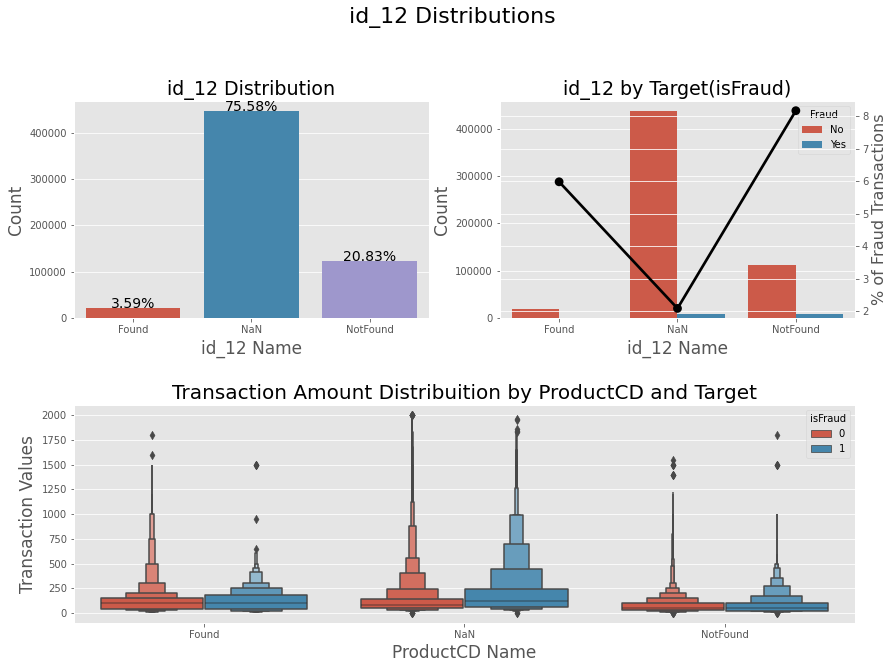

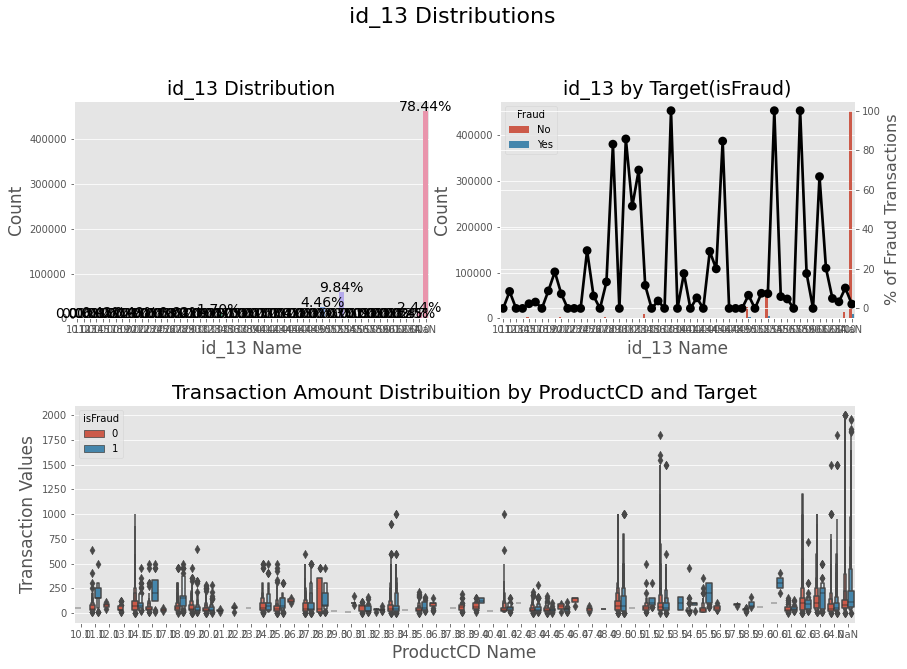

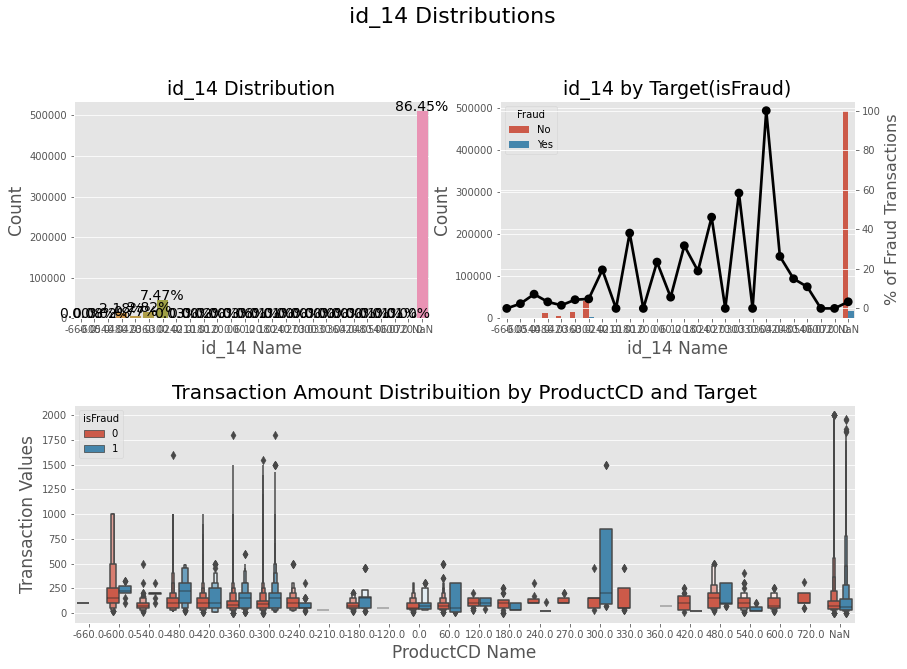

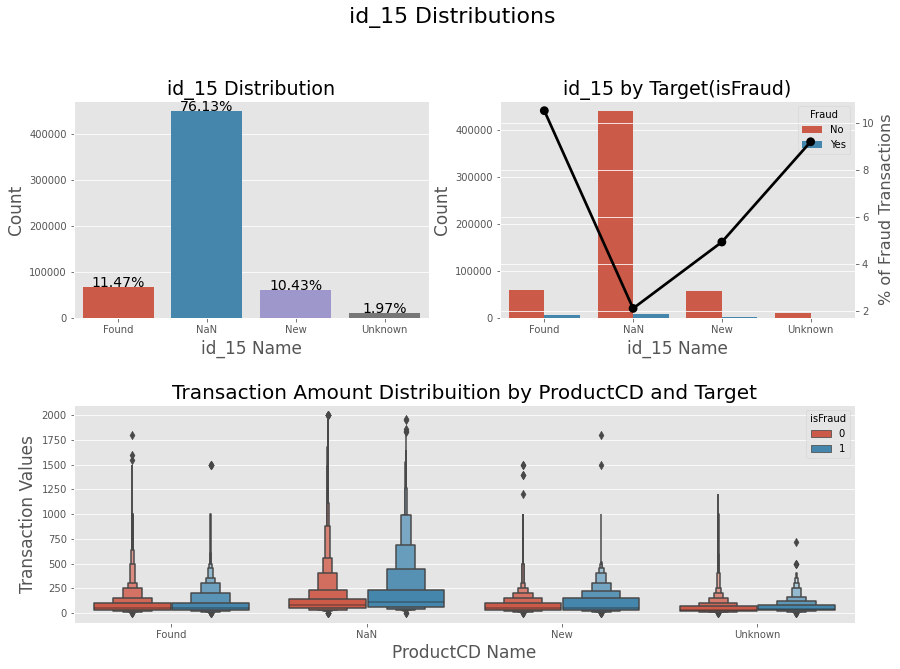

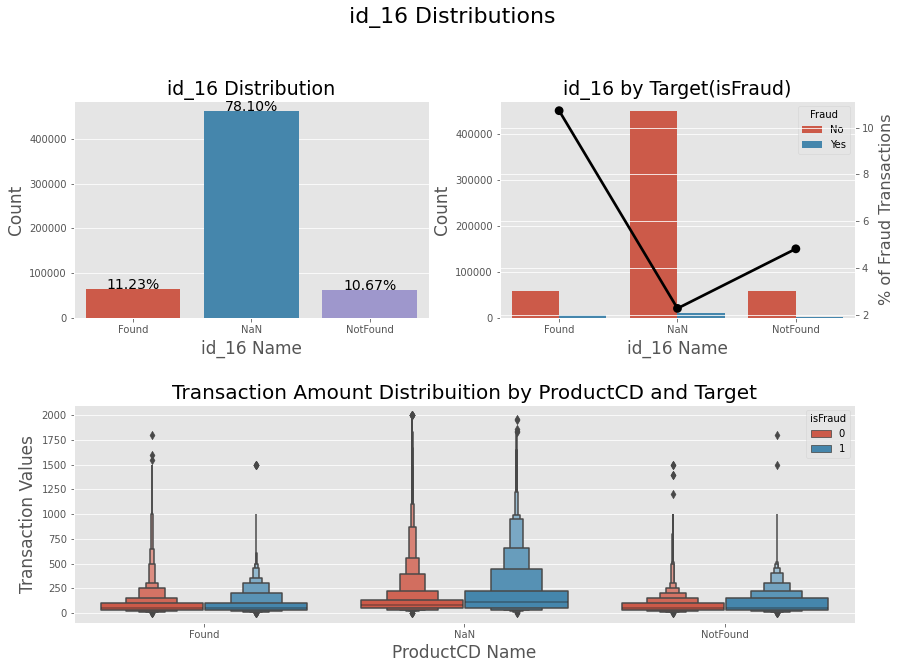

...

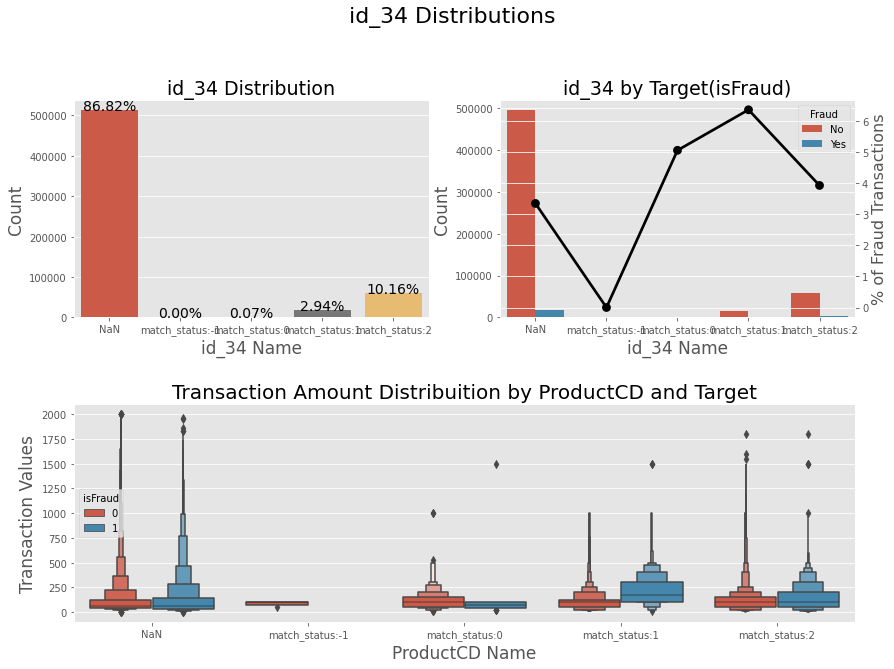

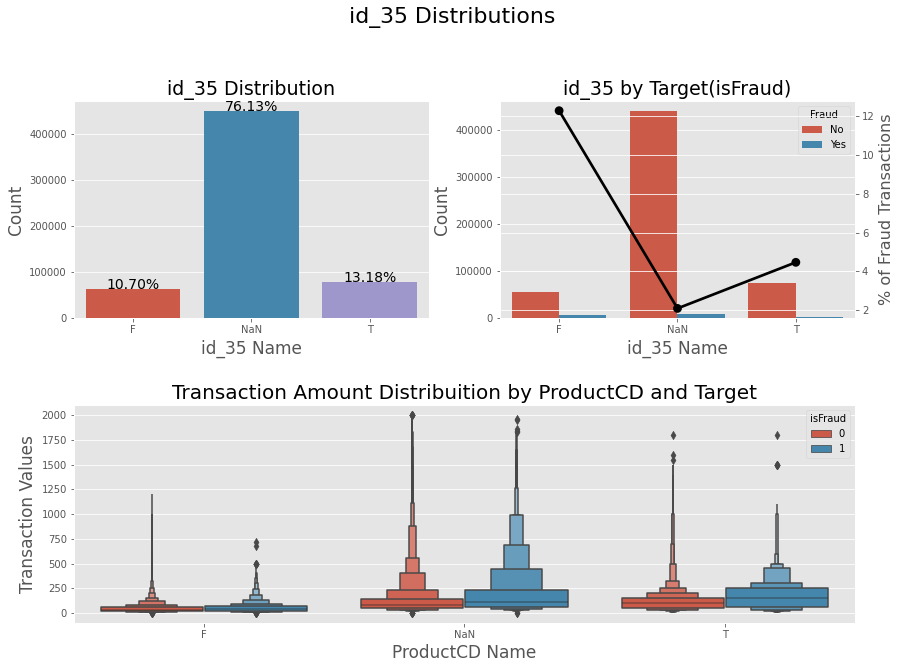

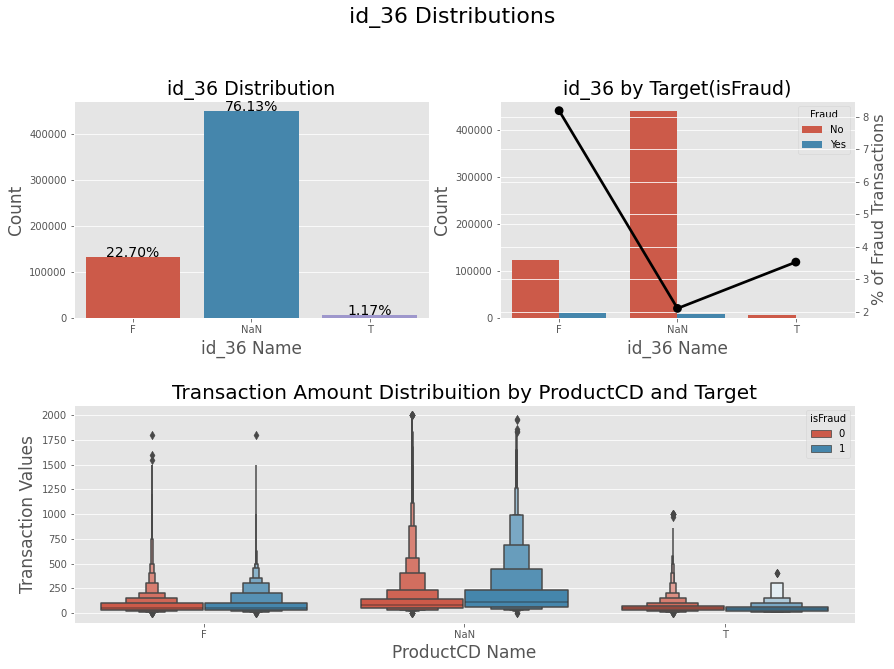

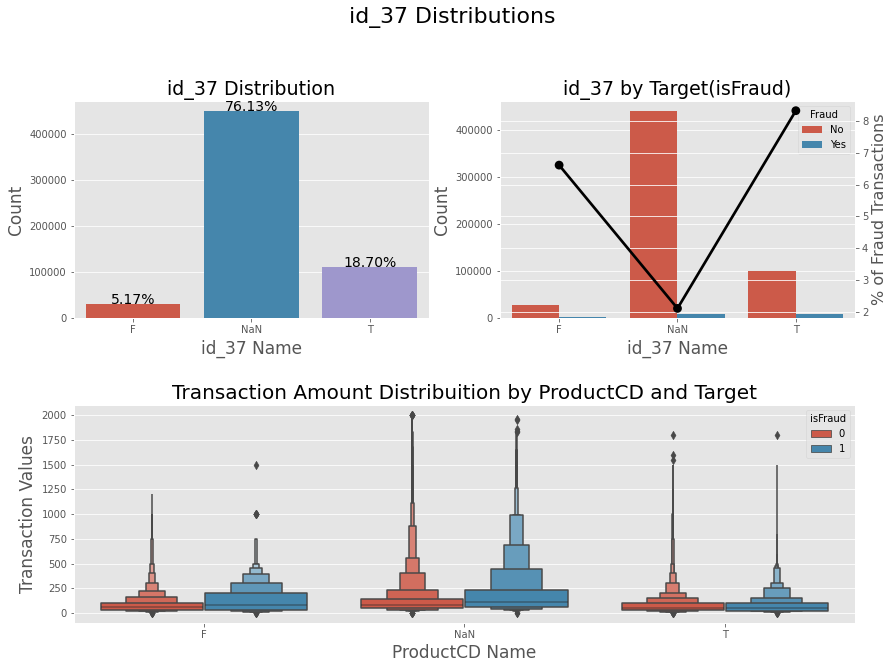

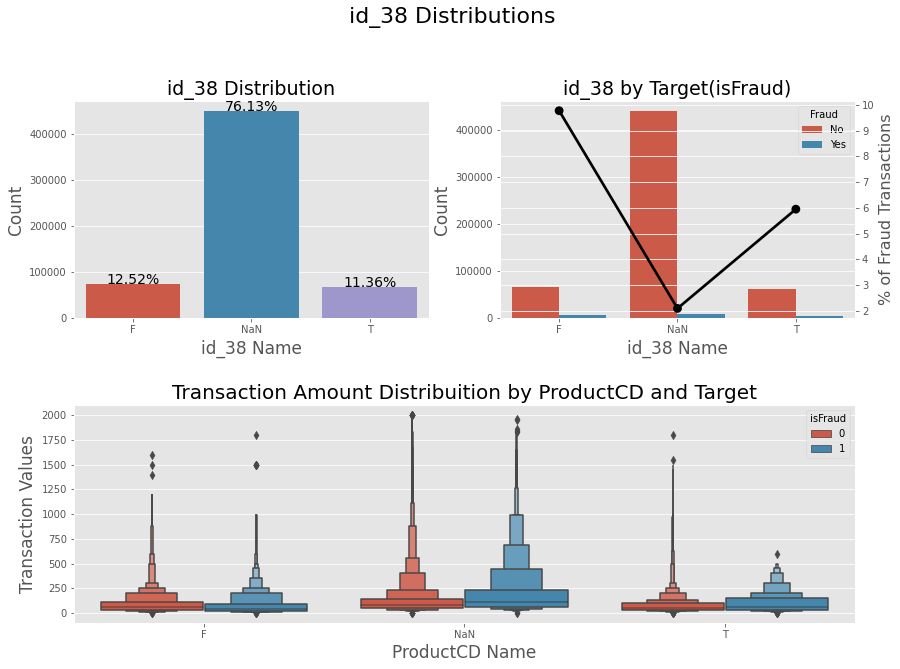

In [19]:
for col in ['id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 
            'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']:
    train[col] = train[col].fillna('NaN')
    cat_feat_ploting(train, col)

Features com alguns padrões:

* `id_12`, `id_15`, `id_16`, `id_23`, `id_27`, `id_28`, `id_29`, `id_32`, `id_34`, `id_35`, `id_36`, `id_37`, `id_38`: `NaN` corresponde a mais de 75% dos valores

* `id_13`, `id_14`, `id_17`, `id_18`, `id_19`, `id_20`, `id_21`, `id_22`, `id_24`, `id_25`, `id_26`, `id_30`, `id_31`, `id_33`, `id_37`: pequena concentração dos valores em grupos

#### Operating System

Apesar das pequenas concentrações, é possível concentrar os valores de algumas colunas

In [20]:
train.loc[train['id_30'].str.contains('Windows', na = False), 'id_30'] = 'Windows'
train.loc[train['id_30'].str.contains('iOS', na = False), 'id_30'] = 'iOS'
train.loc[train['id_30'].str.contains('Mac OS', na = False), 'id_30'] = 'Mac'
train.loc[train['id_30'].str.contains('Android', na = False), 'id_30'] = 'Android'
train['id_30'].fillna("NAN", inplace = True)

In [21]:
def ploting_cnt_amt(df, col, lim=2000):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
    
    plt.figure(figsize=(16,14))    
    plt.suptitle(f'{col} Distributions ', fontsize=24)
    
    plt.subplot(211)
    g = sns.countplot( x=col,  data=df, order=list(tmp[col].values))
    gt = g.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, order=list(tmp[col].values),
                       color='black')#, legend=False)
    gt.set_ylim(0,tmp['Fraud'].max()*1.1)
    gt.set_ylabel("%Fraud Transactions", fontsize=16)
    g.set_title(f"Most Frequent {col} values and % Fraud Transactions", fontsize=20)
    g.set_xlabel(f"{col} Category Names", fontsize=16)
    g.set_ylabel("Count", fontsize=17)
    g.set_xticklabels(g.get_xticklabels(),rotation=45)
    sizes = []
    for p in g.patches:
        height = p.get_height()
        sizes.append(height)
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center",fontsize=12) 
        
    g.set_ylim(0,max(sizes)*1.15)
    
    #########################################################################
    perc_amt = (df.groupby(['isFraud',col])['TransactionAmt'].sum() \
                / df.groupby([col])['TransactionAmt'].sum() * 100).unstack('isFraud')
    perc_amt = perc_amt.reset_index()
    perc_amt.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
    amt = df.groupby([col])['TransactionAmt'].sum().reset_index()
    perc_amt = perc_amt.fillna(0)
    plt.subplot(212)
    g1 = sns.barplot(x=col, y='TransactionAmt', 
                       data=amt, 
                       order=list(tmp[col].values))
    g1t = g1.twinx()
    g1t = sns.pointplot(x=col, y='Fraud', data=perc_amt, 
                        order=list(tmp[col].values),
                       color='black')#, legend=False)
    g1t.set_ylim(0,perc_amt['Fraud'].max()*1.1)
    g1t.set_ylabel("%Fraud Total Amount", fontsize=16)
    g.set_xticklabels(g.get_xticklabels(),rotation=45)
    g1.set_title(f"{col} by Transactions Total + %of total and %Fraud Transactions", fontsize=20)
    g1.set_xlabel(f"{col} Category Names", fontsize=16)
    g1.set_ylabel("Transaction Total Amount(U$)", fontsize=16)
    g1.set_xticklabels(g.get_xticklabels(),rotation=45)    
    
    for p in g1.patches:
        height = p.get_height()
        g1.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total_amt*100),
                ha="center",fontsize=12) 
        
    plt.subplots_adjust(hspace=.4, top = 0.9)
    plt.show()

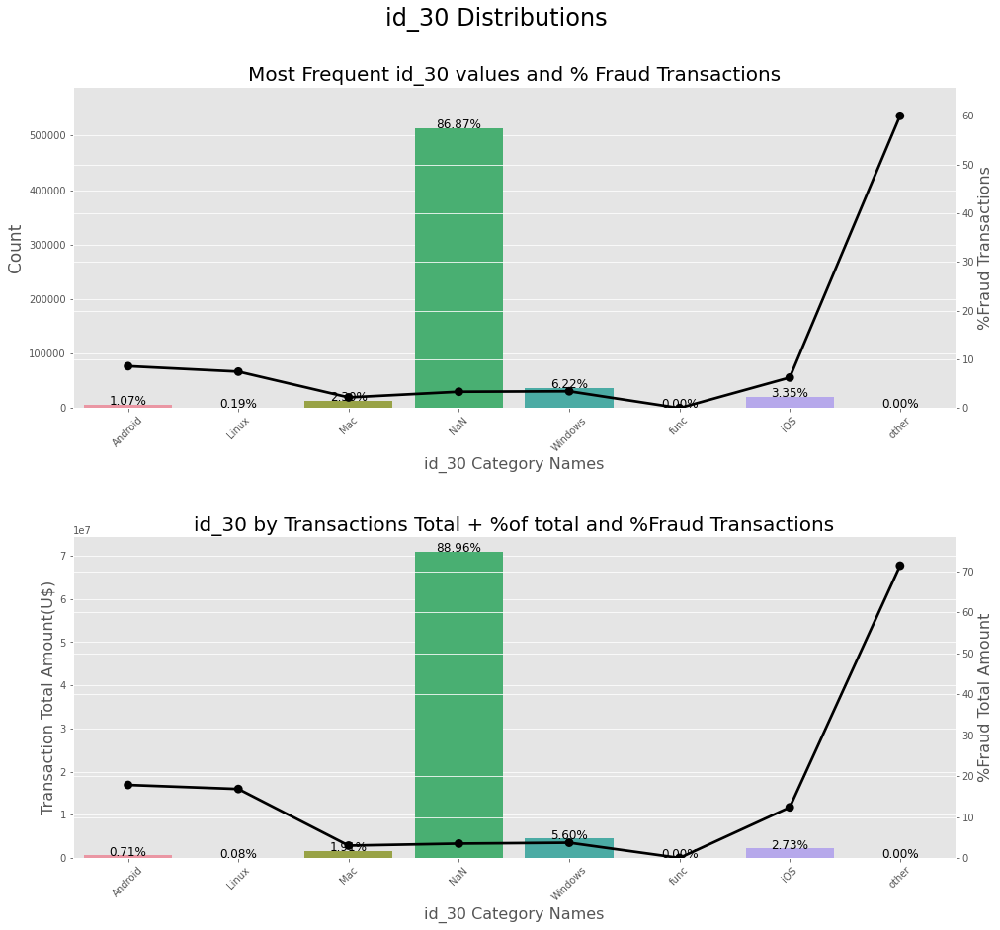

In [22]:
ploting_cnt_amt(train, 'id_30')

Mesmo com a concentração, `id_30` demonstra muitos valores `NaN`. Faremos o mesmo para outras colunas da tabela Identidade

#### Browser column

In [23]:
train.loc[train['id_31'].str.contains('chrome', na=False), 'id_31'] = 'Chrome'
train.loc[train['id_31'].str.contains('firefox', na=False), 'id_31'] = 'Firefox'
train.loc[train['id_31'].str.contains('safari', na=False), 'id_31'] = 'Safari'
train.loc[train['id_31'].str.contains('edge', na=False), 'id_31'] = 'Edge'
train.loc[train['id_31'].str.contains('ie', na=False), 'id_31'] = 'IE'
train.loc[train['id_31'].str.contains('samsung', na=False), 'id_31'] = 'Samsung'
train.loc[train['id_31'].str.contains('opera', na=False), 'id_31'] = 'Opera'
train['id_31'].fillna("NAN", inplace=True)
train.loc[train.id_31.isin(train.id_31.value_counts()[train.id_31.value_counts() 
                                                               < 200].index), 'id_31'] = "Others"

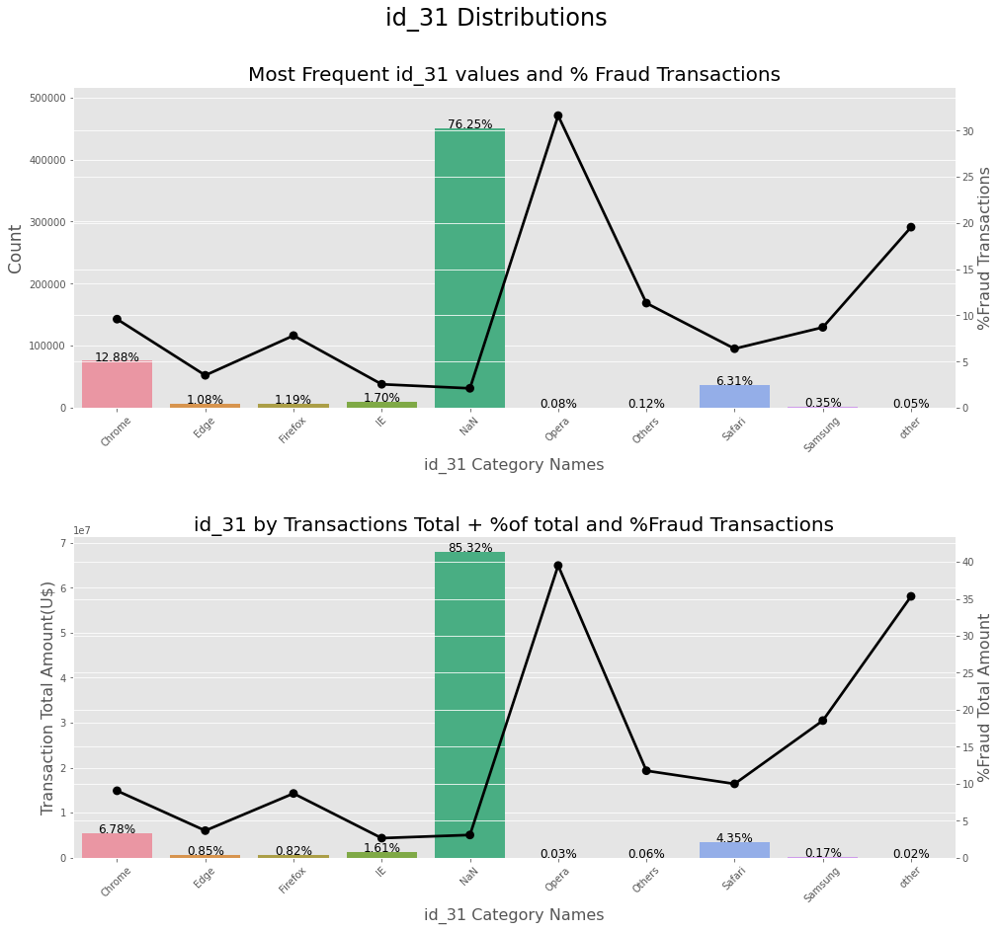

In [24]:
ploting_cnt_amt(train, 'id_31')

#### Device Type

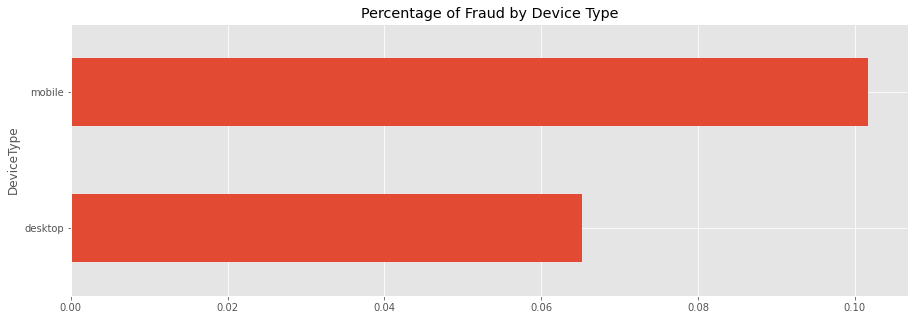

In [25]:
train.groupby('DeviceType') \
.mean()['isFraud'] \
.sort_values() \
.plot(kind = 'barh', 
     figsize = (15, 5), 
     title = 'Percentage of Fraud by Device Type')
plt.show()

#### Device Info

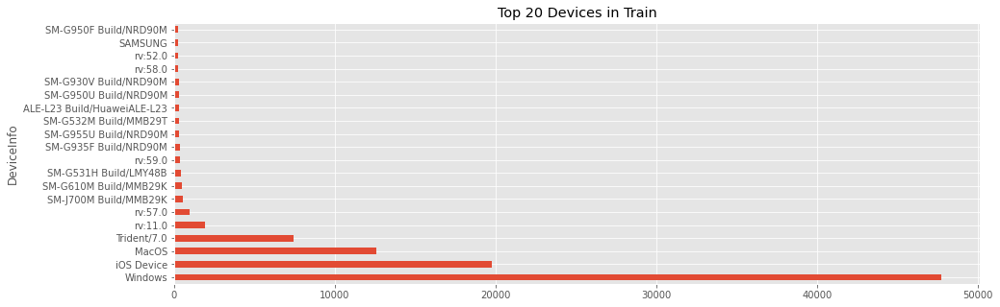

In [26]:
train.groupby('DeviceInfo') \
.count()['TransactionID'] \
.sort_values(ascending = False) \
.head(20) \
.plot(kind = 'barh', figsize = (15, 5), title = 'Top 20 Devices in Train')
plt.show()

### Tabela Transação

#### Transaction Amount

In [27]:
train['TransactionAmt'] = train['TransactionAmt'].astype(float)
print("Transaction Amount Quantiles: ")
print(train['TransactionAmt'].quantile([.01, .025, .1, .25, .5, .75, .9, .975, .99]))

Transaction Amount Quantiles: 
0.010       9.244000000000000
0.025      14.500999999999999
0.100      25.949999999999999
0.250      43.320999999999998
0.500      68.769000000000005
0.750     125.000000000000000
0.900     275.293000000000006
0.975     648.334500000004141
0.990    1104.000000000000000
Name: TransactionAmt, dtype: float64


In [28]:
# observando os percentis para transações fraudulentas e genuínas
print(pd.concat([train[train['isFraud'] == 1]['TransactionAmt']
                 .quantile([.01, .1, .25, .5, .75, .9, .99])
                 .reset_index(),
                 train[train['isFraud'] == 0]['TransactionAmt']
                 .quantile([.01, .1, .25, .5, .75, .9, .99])
                 .reset_index()], 
                axis = 1, keys = ['Fraud', 'NoFraud']))

  Fraud                      NoFraud                      
  index       TransactionAmt   index        TransactionAmt
0  0.01    6.740960000000000    0.01     9.512880000000003
1  0.10   18.936000000000000    0.10    26.309999999999999
2  0.25   35.043999999999997    0.25    43.969999999999999
3  0.50   75.000000000000000    0.50    68.500000000000000
4  0.75  161.000000000000000    0.75   120.000000000000000
5  0.90  335.000000000000000    0.90   267.112000000001842
6  0.99  994.000000000000000    0.99  1104.000000000000000


In [29]:
print('Mean transaction amt for fraud is {:.4f}'
      .format(train.loc[train['isFraud'] == 1]['TransactionAmt'].mean()))
print('Mean transaction amt for non-fraud is {:.4f}'
      .format(train.loc[train['isFraud'] == 0]['TransactionAmt'].mean()))

Mean transaction amt for fraud is 149.2448
Mean transaction amt for non-fraud is 134.5117


#### Product Feature

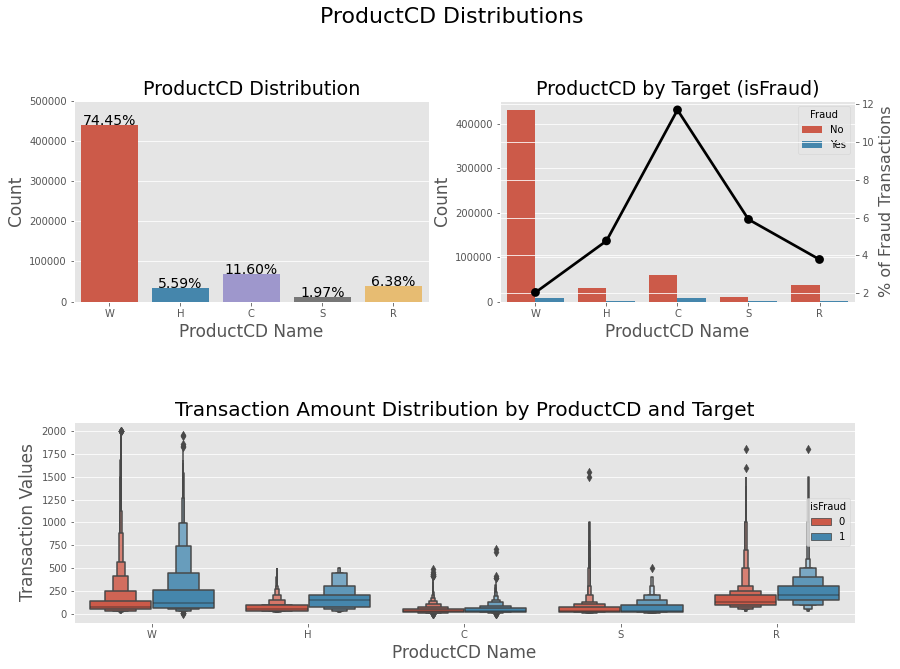

In [30]:
tmp = pd.crosstab(train['ProductCD'], train['isFraud'], normalize = 'index') * 100
tmp = tmp.reset_index()
tmp.rename(columns = {0: 'No Fraud', 1: 'Fraud'}, inplace = True)

plt.figure(figsize = (14, 10))
plt.suptitle('ProductCD Distributions', fontsize = 22)

plt.subplot(221)
g = sns.countplot(x = 'ProductCD', data = train)
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

g.set_title("ProductCD Distribution", fontsize = 19)
g.set_xlabel("ProductCD Name", fontsize = 17)
g.set_ylabel("Count", fontsize = 17)
g.set_ylim(0, 500000)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x() + p.get_width()/2.,
          height + 3, 
          '{:1.2f}%'.format(height / total * 100),
          ha = "center", fontsize = 14)

plt.subplot(222)
g1 = sns.countplot(x = 'ProductCD', hue = 'isFraud', data = train)
plt.legend(title = 'Fraud', loc = 'best', labels = ['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x = 'ProductCD', y = 'Fraud', data = tmp, color = 'black', 
                  order = ['W', 'H', 'C', 'S', 'R'])#, legend = False)
gt.set_ylabel("% of Fraud Transactions", fontsize = 16)

g1.set_title("ProductCD by Target (isFraud)", fontsize = 19)
g1.set_xlabel("ProductCD Name", fontsize = 17)
g1.set_ylabel("Count", fontsize = 17)

plt.subplot(212)
g3 = sns.boxenplot(x = 'ProductCD', y = 'TransactionAmt', hue = 'isFraud',
                  data = train[train['TransactionAmt'] <= 2000])
g3.set_title("Transaction Amount Distribution by ProductCD and Target", fontsize = 20)
g3.set_xlabel("ProductCD Name", fontsize = 17)
g3.set_ylabel("Transaction Values", fontsize = 17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

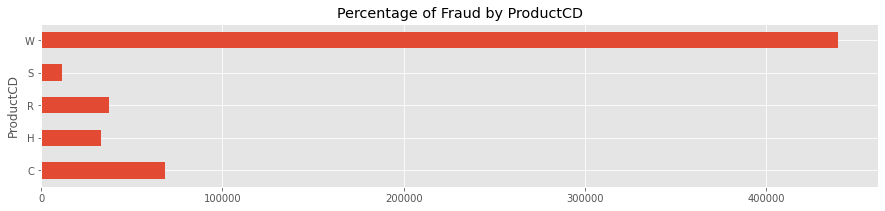

In [31]:
train.groupby('ProductCD') \
['TransactionID'].count() \
.sort_index() \
.plot(kind = 'barh', 
     figsize = (15, 3), 
     title = 'Percentage of Fraud by ProductCD')
plt.show()

A maior parte das transações estão relacionadas com o produto `W`

#### Card Features

In [32]:
resumetable(train[['card1', 'card2', 'card3', 'card4', 'card5', 'card6']])

Dataset Shape: (590540, 6)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,card1,int64,0,13553,13926,2755,4663,9.970000000000001
1,card2,float64,8933,500,NaN,404.0,490.0,6.320000000000000
2,card3,float64,1565,114,150.0,150.0,150.0,0.680000000000000
3,card4,object,1577,4,discover,mastercard,visa,1.090000000000000
4,card5,float64,4259,119,142.0,102.0,166.0,2.660000000000000
5,card6,object,1571,4,credit,credit,debit,0.820000000000000


In [33]:
# percentis para as colunas de cartão
print("Card Features Quantiles: ")
print(train[['card1', 'card2', 'card3', 'card5']].quantile([.01, .025, .1, .25, .5, .75, .975, .99]))

Card Features Quantiles: 
         card1  card2  card3  card5
0.010   1338.0  100.0  144.0  102.0
0.025   1675.0  111.0  150.0  102.0
0.100   2803.0  111.0  150.0  126.0
0.250   6019.0  214.0  150.0  166.0
0.500   9678.0  361.0  150.0  226.0
0.750  14184.0  512.0  150.0  226.0
0.975  18018.0  583.0  185.0  226.0
0.990  18238.0  583.0  185.0  226.0


`Card 1` e `Card 2` com uma ampla distribuição de valores. Melhor tirar o log dessas colunas

In [34]:
train.loc[train.card3.isin(train.card3.value_counts()[train.card3.value_counts() < 200]
                                 .index), 'card3'] = "Others"
train.loc[train.card5.isin(train.card5.value_counts()[train.card5.value_counts() < 300]
                                .index), 'card5'] = "Others"

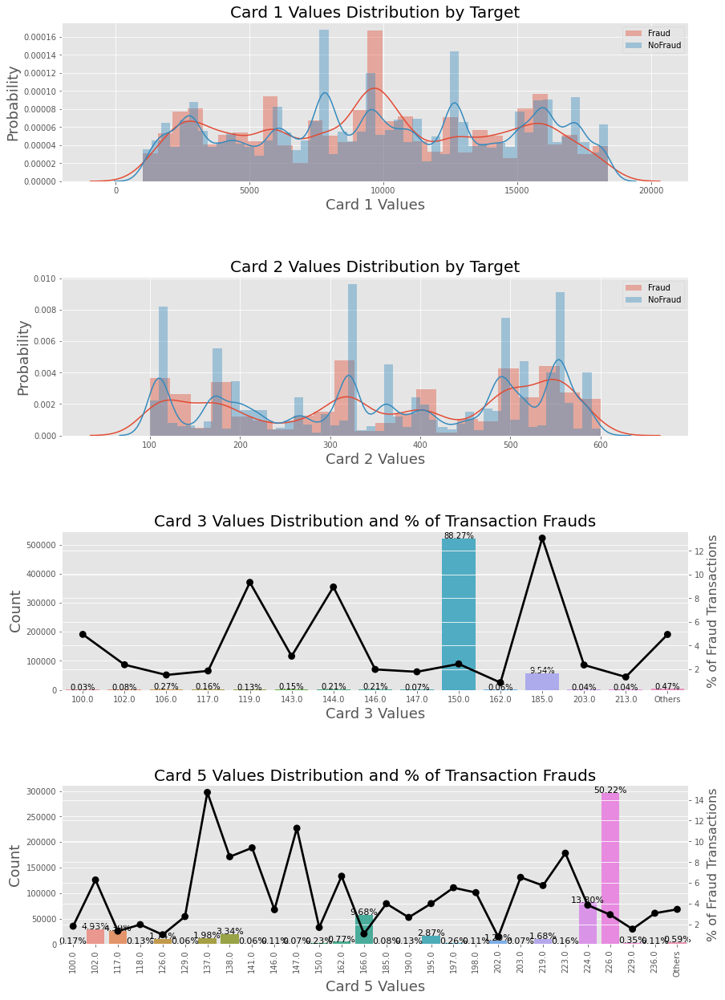

In [35]:
# visualizando as distribuições de Card 1, Card 2 e Card 3
tmp = pd.crosstab(train['card3'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

tmp2 = pd.crosstab(train['card5'], train['isFraud'], normalize='index') * 100
tmp2 = tmp2.reset_index()
tmp2.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

plt.figure(figsize=(14,22))

plt.subplot(411)
g = sns.distplot(train[train['isFraud'] == 1]['card1'], label='Fraud')
g = sns.distplot(train[train['isFraud'] == 0]['card1'], label='NoFraud')
g.legend()
g.set_title("Card 1 Values Distribution by Target", fontsize=20)
g.set_xlabel("Card 1 Values", fontsize=18)
g.set_ylabel("Probability", fontsize=18)

plt.subplot(412)
g1 = sns.distplot(train[train['isFraud'] == 1]['card2'].dropna(), label='Fraud')
g1 = sns.distplot(train[train['isFraud'] == 0]['card2'].dropna(), label='NoFraud')
g1.legend()
g1.set_title("Card 2 Values Distribution by Target", fontsize=20)
g1.set_xlabel("Card 2 Values", fontsize=18)
g1.set_ylabel("Probability", fontsize=18)

plt.subplot(413)
g2 = sns.countplot(x='card3', data=train, order=list(tmp.card3.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='card3', y='Fraud', data=tmp, 
                    color='black', order=list(tmp.card3.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("Card 3 Values Distribution and % of Transaction Frauds", fontsize=20)
g2.set_xlabel("Card 3 Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center") 

plt.subplot(414)
g3 = sns.countplot(x='card5', data=train, order=list(tmp2.card5.values))
g3t = g3.twinx()
g3t = sns.pointplot(x='card5', y='Fraud', data=tmp2, 
                    color='black', order=list(tmp2.card5.values))
g3t.set_ylabel("% of Fraud Transactions", fontsize=16)
g3.set_title("Card 5 Values Distribution and % of Transaction Frauds", fontsize=20)
g3.set_xticklabels(g3.get_xticklabels(),rotation=90)
g3.set_xlabel("Card 5 Values", fontsize=18)
g3.set_ylabel("Count", fontsize=18)
for p in g3.patches:
    height = p.get_height()
    g3.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=11) 
    
plt.subplots_adjust(hspace = 0.6, top = 0.85)


plt.show()

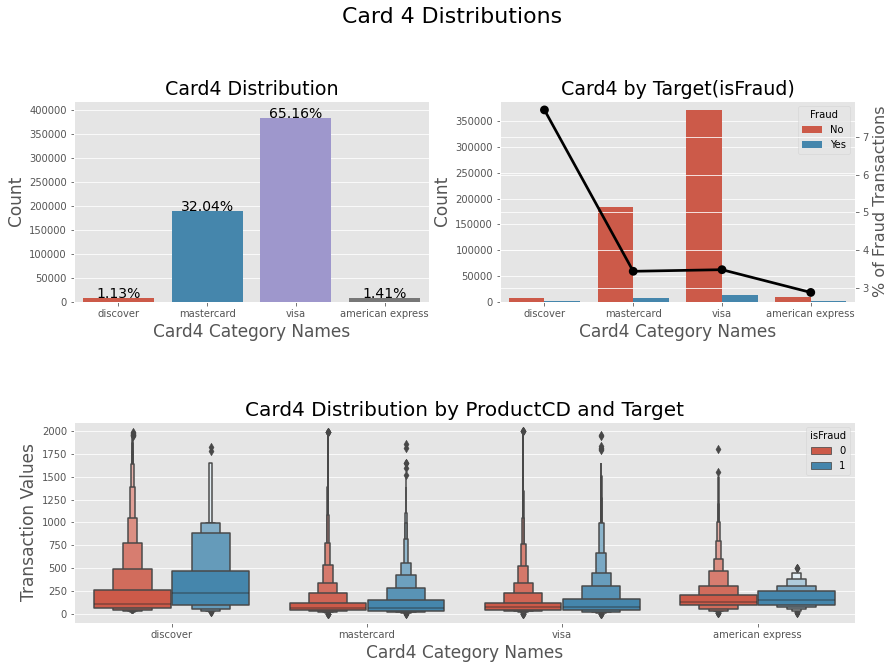

In [36]:
# Card 4
tmp = pd.crosstab(train['card4'], train['isFraud'], normalize = 'index') * 100
tmp = tmp.reset_index()
tmp.rename(columns = {0: 'No Fraud', 1: 'Fraud'}, inplace = True)

plt.figure(figsize = (14, 10))
plt.suptitle('Card 4 Distributions', fontsize = 22)

plt.subplot(221)
g = sns.countplot(x = 'card4', data = train)
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])
g.set_title("Card4 Distribution", fontsize = 19)
g.set_ylim(0, 420000)
g.set_xlabel("Card4 Category Names", fontsize = 17)
g.set_ylabel("Count", fontsize = 17)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x() + p.get_width()/2.,
          height + 3,
          '{:1.2f}%'.format(height/total * 100),
          ha = "center", fontsize = 14)

plt.subplot(222)
g1 = sns.countplot(x = 'card4', hue = 'isFraud', data = train)
plt.legend(title = 'Fraud', loc = 'best', labels = ['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x = 'card4', y = 'Fraud', data = tmp,
                  color = 'black',
                  order = ['discover', 'mastercard', 'visa', 'american express'])#, legend = False)
gt.set_ylabel("% of Fraud Transactions", fontsize = 16)
g1.set_title("Card4 by Target(isFraud)", fontsize = 19)
g1.set_xlabel("Card4 Category Names", fontsize = 17)
g1.set_ylabel("Count", fontsize = 17)

plt.subplot(212)
g3 = sns.boxenplot(x = 'card4', y = 'TransactionAmt', hue = 'isFraud', 
                   data = train[train['TransactionAmt'] <= 2000])
g3.set_title("Card4 Distribution by ProductCD and Target", fontsize = 20)
g3.set_xlabel("Card4 Category Names", fontsize = 17)
g3.set_ylabel("Transaction Values", fontsize = 17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

* 97% dos dados de `Card 4` são Mastercard(32%) e Visa(65%);

* As maiores taxas de fraude estão em Discover (~8%), contra ~3.5% de Mastercard + Visa e 2.87% in American Express

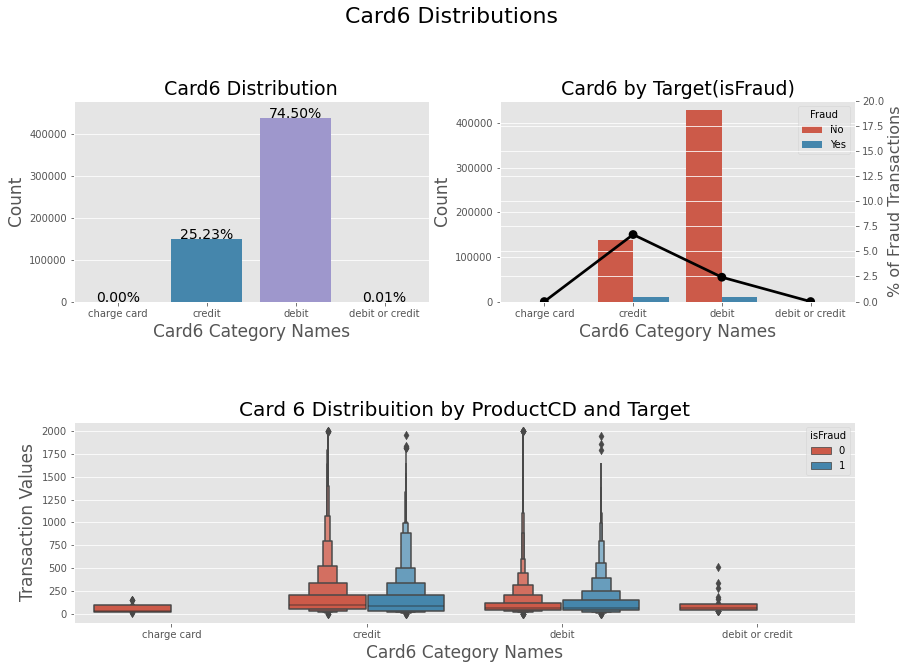

In [37]:
# Card 6
tmp = pd.crosstab(train['card6'], train['isFraud'], normalize = 'index') * 100
tmp = tmp.reset_index()
tmp.rename(columns = {0: 'NoFraud', 1: 'Fraud'}, inplace = True)

plt.figure(figsize = (14, 10))
plt.suptitle('Card6 Distributions', fontsize = 22)

plt.subplot(221)
g = sns.countplot(x = 'card6', data = train, order = list(tmp.card6.values))
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])
g.set_title("Card6 Distribution", fontsize = 19)
g.set_ylim(0, 480000)
g.set_xlabel("Card6 Category Names", fontsize = 17)
g.set_ylabel("Count", fontsize = 17)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14) 

plt.subplot(222)
g1 = sns.countplot(x='card6', hue='isFraud', data=train, order=list(tmp.card6.values))
plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x='card6', y='Fraud', data=tmp, order=list(tmp.card6.values),
                   color='black')#, legend=False)
gt.set_ylim(0,20)
gt.set_ylabel("% of Fraud Transactions", fontsize=16)
g1.set_title("Card6 by Target(isFraud)", fontsize=19)
g1.set_xlabel("Card6 Category Names", fontsize=17)
g1.set_ylabel("Count", fontsize=17)

plt.subplot(212)
g3 = sns.boxenplot(x='card6', y='TransactionAmt', hue='isFraud', order=list(tmp.card6.values),
              data=train[train['TransactionAmt'] <= 2000] )
g3.set_title("Card 6 Distribuition by ProductCD and Target", fontsize=20)
g3.set_xlabel("Card6 Category Names", fontsize=17)
g3.set_ylabel("Transaction Values", fontsize=17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

* 89% dos dados são de cartão de crédito (25%) e débito (74%);

* Maiores taxas de fraudes em débito (~20%) contra 5% de crédito

#### M1-M9

In [38]:
for col in ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']:
    train[col] = train[col].fillna("Miss")
def ploting_dist_ratio(df, col, lim=2000):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(20,5))
    plt.suptitle(f'{col} Distributions ', fontsize=22)

    plt.subplot(121)
    g = sns.countplot(x=col, data=df, order=list(tmp[col].values))
    # plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])
    g.set_title(f"{col} Distribution\nCound and %Fraud by each category", fontsize=18)
    g.set_ylim(0,400000)
    gt = g.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, order=list(tmp[col].values),
                       color='black')#, legend=False)
    gt.set_ylim(0,20)
    gt.set_ylabel("% of Fraud Transactions", fontsize=16)
    g.set_xlabel(f"{col} Category Names", fontsize=16)
    g.set_ylabel("Count", fontsize=17)
    for p in gt.patches:
        height = p.get_height()
        gt.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center",fontsize=14) 
        
    perc_amt = (train.groupby(['isFraud',col])['TransactionAmt'].sum() / 
                total_amt * 100).unstack('isFraud')
    perc_amt = perc_amt.reset_index()
    perc_amt.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.subplot(122)
    g1 = sns.boxplot(x=col, y='TransactionAmt', hue='isFraud', 
                     data=df[df['TransactionAmt'] <= lim], order=list(tmp[col].values))
    g1t = g1.twinx()
    g1t = sns.pointplot(x=col, y='Fraud', data=perc_amt, order=list(tmp[col].values),
                       color='black')#, legend=False)
    g1t.set_ylim(0,5)
    g1t.set_ylabel("%Fraud Total Amount", fontsize=16)
    g1.set_title(f"{col} by Transactions dist", fontsize=18)
    g1.set_xlabel(f"{col} Category Names", fontsize=16)
    g1.set_ylabel("Transaction Amount(U$)", fontsize=16)
        
    plt.subplots_adjust(hspace=.4, wspace = 0.35, top = 0.80)
    
    plt.show()

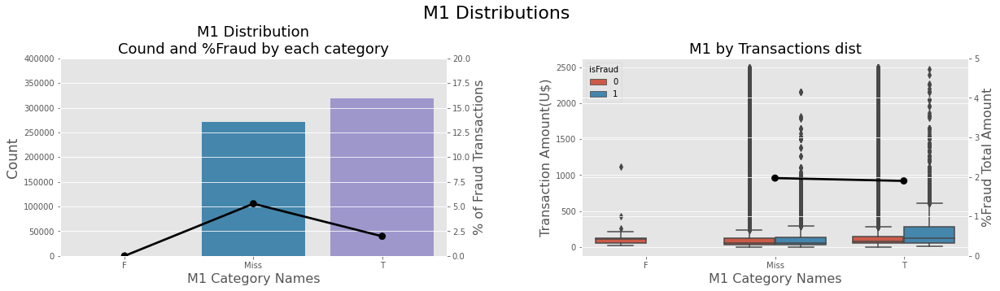

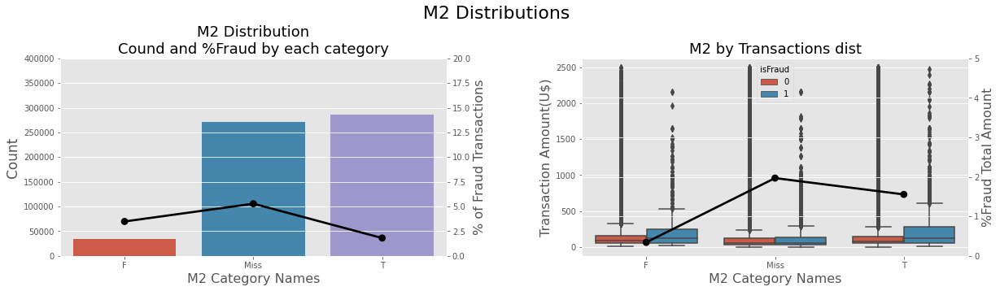

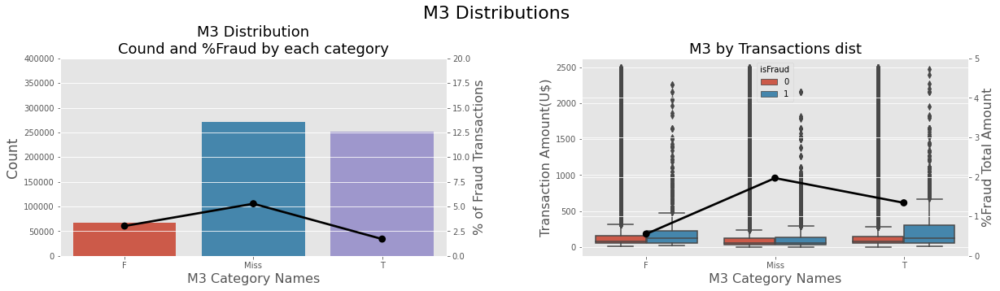

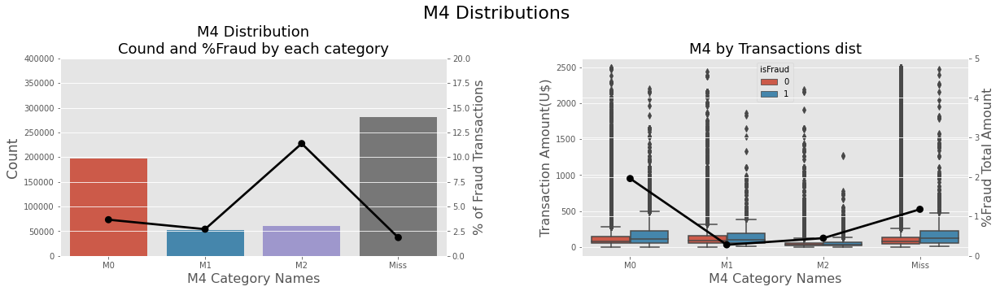

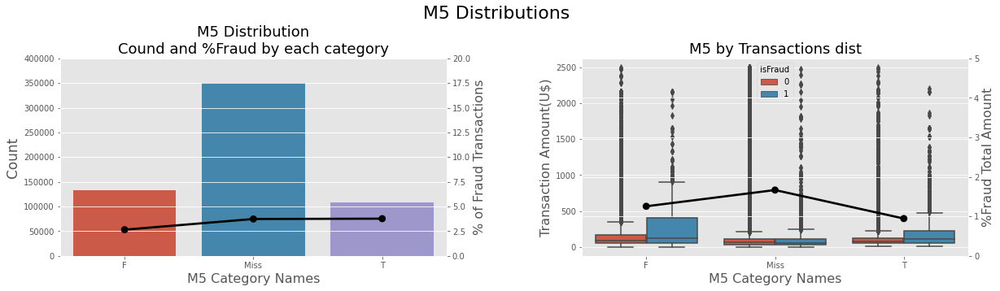

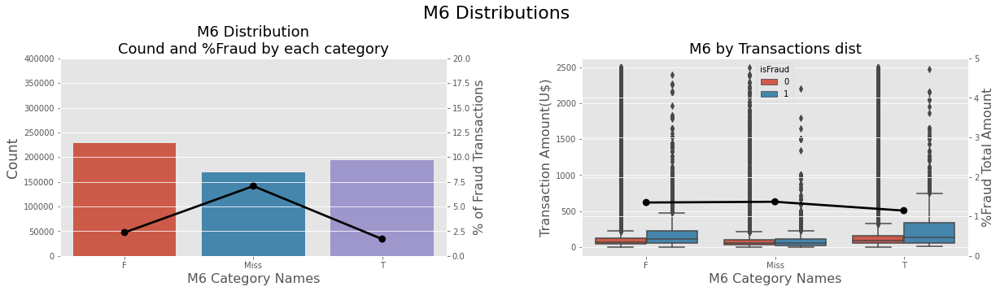

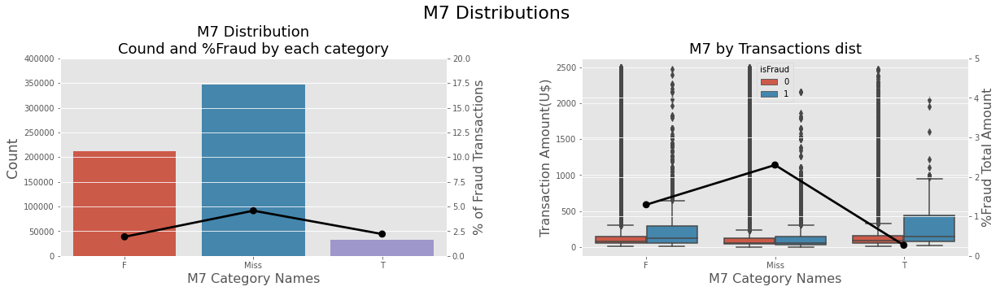

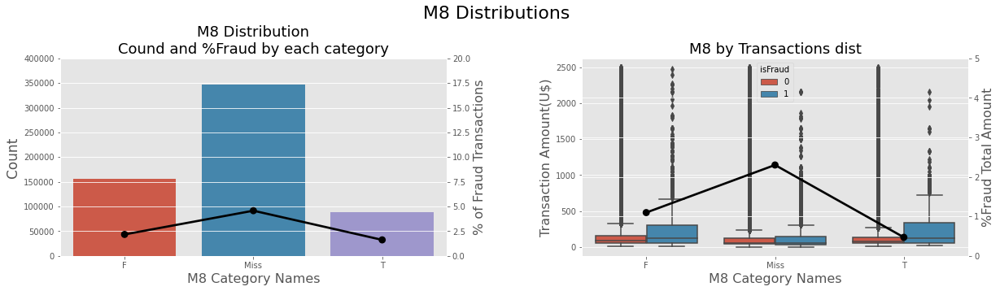

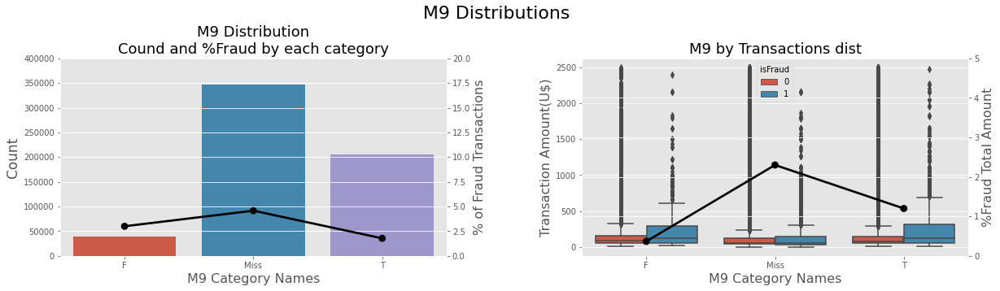

In [39]:
# distribuições M: distribuição de contagem, percentual de fraude e valor total de transação
for col in ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']:
    ploting_dist_ratio(train, col, lim=2500)

Em todos os casos, mais da metade das transações tem valores faltantes.

#### Addr1 and Addr2

In [40]:
print("Card Features Quantiles")
print(train[['addr1', 'addr2']].quantile([0.01, .025, .1, .25, .5, .75, .90, .975, .99]))

Card Features Quantiles
       addr1  addr2
0.010  123.0   87.0
0.025  123.0   87.0
0.100  177.0   87.0
0.250  204.0   87.0
0.500  299.0   87.0
0.750  330.0   87.0
0.900  441.0   87.0
0.975  498.0   87.0
0.990  512.0   87.0


In [41]:
train.loc[train.addr1.isin(train.addr1.value_counts()[train.addr1.value_counts() <= 
                                                               5000].index), 'addr1'] = "Others"
train.loc[train.addr2.isin(train.addr2.value_counts()[train.addr2.value_counts() <= 
                                                              50].index), 'addr2'] = "Others"

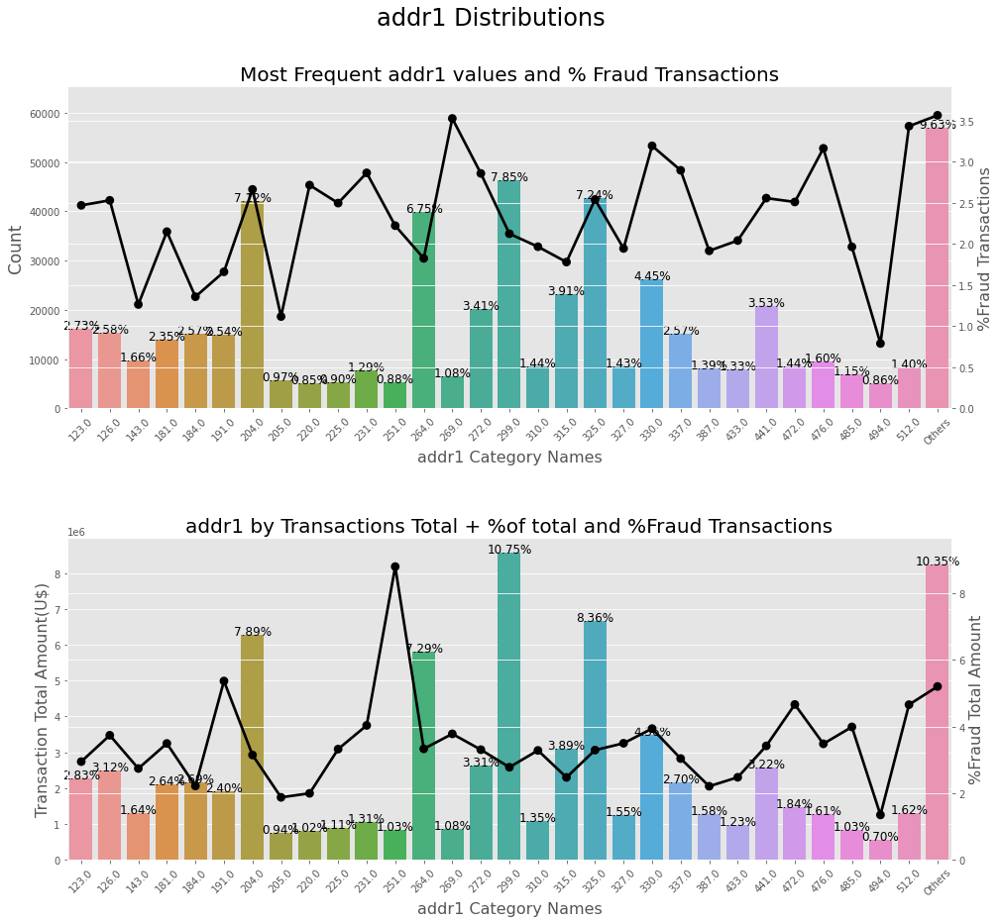

In [42]:
# distribuição de addr1
ploting_cnt_amt(train, 'addr1')

Baixa concentração verificada na feature `addr1`

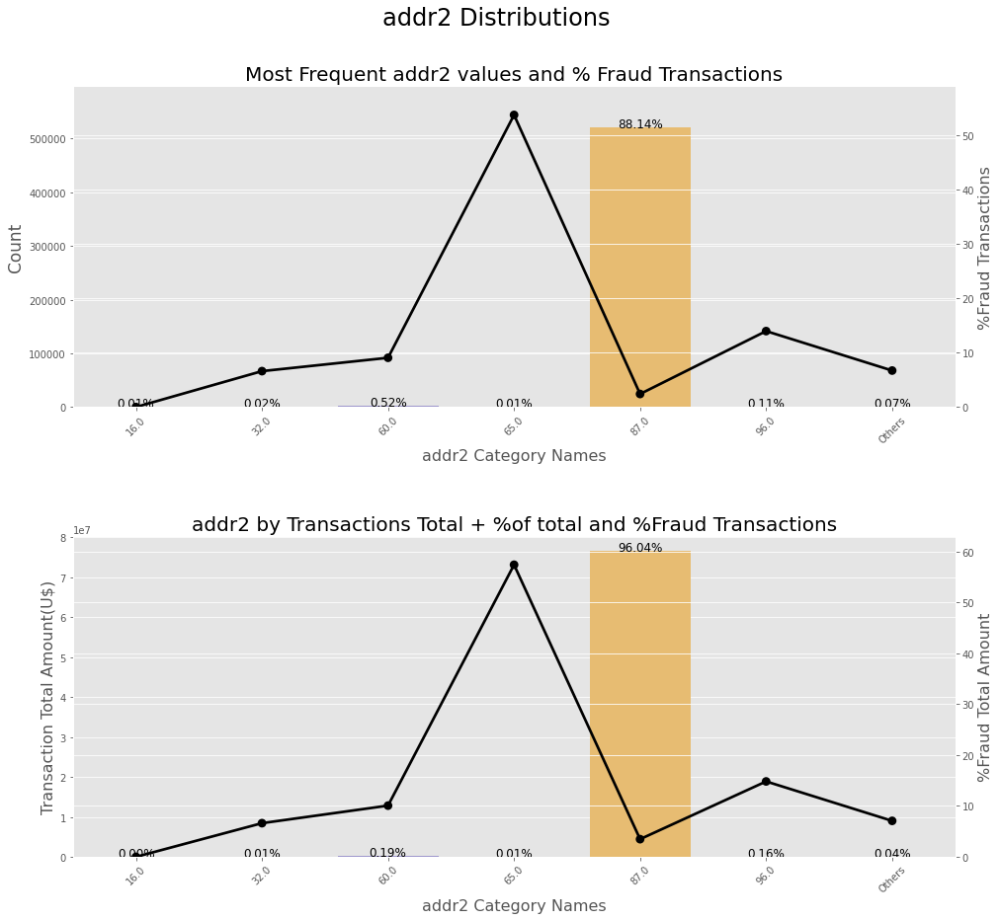

In [43]:
# Addr2 Distributions
ploting_cnt_amt(train, 'addr2')

In [44]:
print(' addr1 - has {} NA values'.format(train['addr1'].isna().sum()))
print(' addr2 - has {} NA values'.format(train['addr2'].isna().sum()))

 addr1 - has 65706 NA values
 addr2 - has 65706 NA values


#### P Emaildomain

In [45]:
train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo Mail'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train.P_emaildomain.isin(train.P_emaildomain\
                                         .value_counts()[train.P_emaildomain.value_counts() <= 500 ]\
                                         .index), 'P_emaildomain'] = "Others"
train.P_emaildomain.fillna("NoInf", inplace=True)

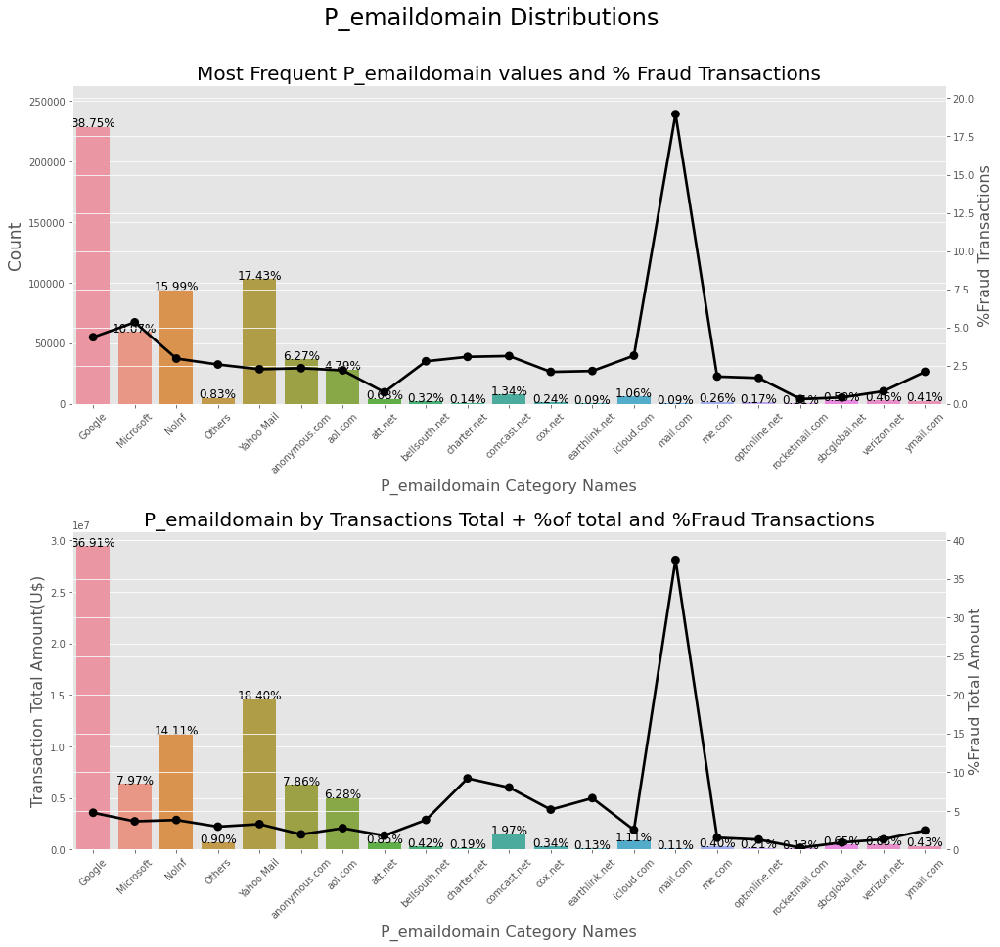

In [46]:
# domínio dos emails
ploting_cnt_amt(train, 'P_emaildomain')

#### R-Email Domain

In [47]:
train.loc[train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train.loc[train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo Mail'
train.loc[train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train.loc[train.R_emaildomain.isin(train.R_emaildomain\
                                         .value_counts()[train.R_emaildomain.value_counts() <= 300 ]\
                                         .index), 'R_emaildomain'] = "Others"
train.R_emaildomain.fillna("NoInf", inplace=True)

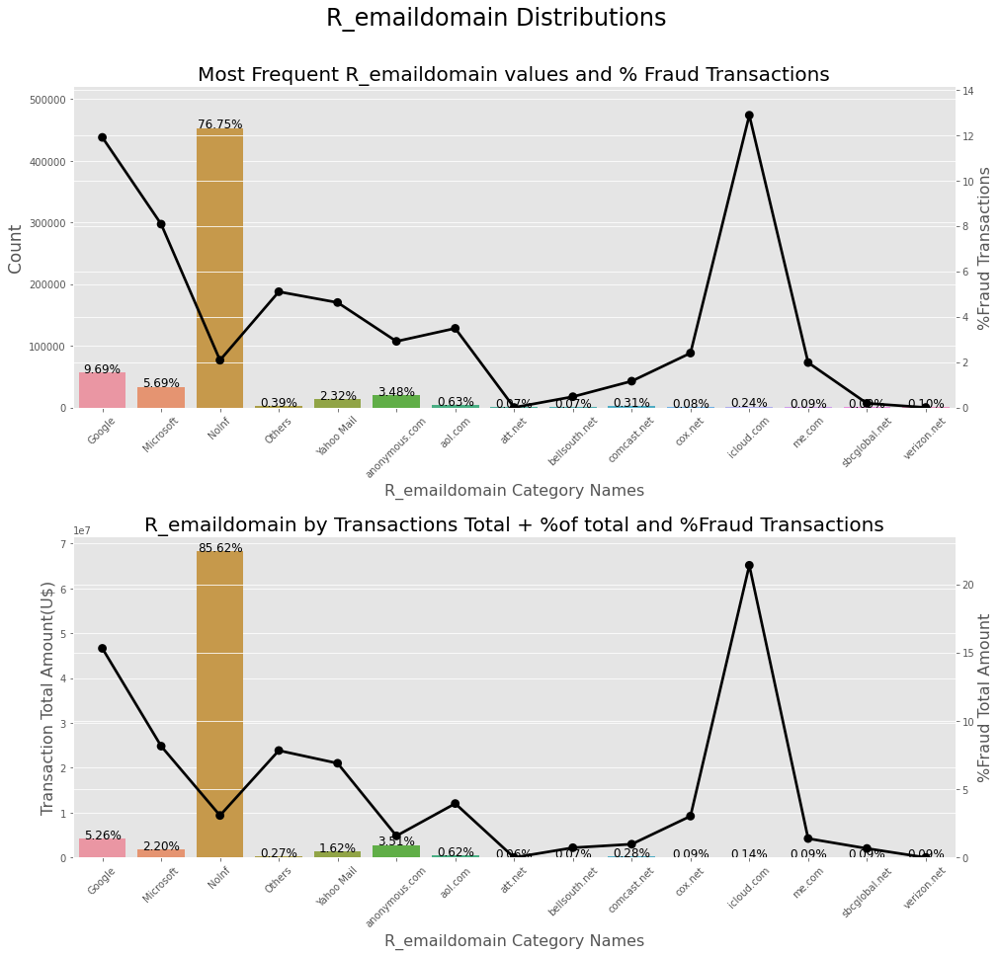

In [48]:
ploting_cnt_amt(train, 'R_emaildomain')

#### C1-C14

In [49]:
resumetable(train[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 
                    'C11', 'C12', 'C13', 'C14']])

Dataset Shape: (590540, 14)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,C1,float64,0,1657,1.0,1.0,1.0,2.72
1,C2,float64,0,1216,1.0,1.0,1.0,2.75
2,C3,float64,0,27,0.0,0.0,0.0,0.04
3,C4,float64,0,1260,0.0,0.0,0.0,1.12
4,C5,float64,0,319,0.0,0.0,0.0,2.06
5,C6,float64,0,1328,1.0,1.0,1.0,2.52
6,C7,float64,0,1103,0.0,0.0,0.0,0.71
7,C8,float64,0,1253,0.0,0.0,0.0,1.25
8,C9,float64,0,205,1.0,0.0,1.0,2.62
9,C10,float64,0,1231,0.0,0.0,0.0,1.23


In [50]:
train[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8',
                      'C9', 'C10', 'C11', 'C12', 'C13', 'C14']].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000,590540.000000000000000
mean,14.092457750533411,15.269734480306161,0.005643986859485,4.092185118704914,5.571526060893420,9.071082399160090,2.848477664510448,5.144574457276391,4.480240119212924,5.240342737155824,10.241521319470316,4.076226843228231,32.539917702441834,8.295214549395469
std,133.569017999404849,154.668899215115431,0.150535621816861,68.848458559012954,25.786975821564244,71.508467387029469,61.727303516294882,95.378573649118124,16.674896706250987,95.581442962408531,94.336291830343100,86.666217674160464,129.364844445589540,49.544262418729545
min,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
25%,1.000000000000000,1.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,1.000000000000000,1.000000000000000
50%,1.000000000000000,1.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,3.000000000000000,1.000000000000000
75%,3.000000000000000,3.000000000000000,0.000000000000000,0.000000000000000,1.000000000000000,2.000000000000000,0.000000000000000,0.000000000000000,2.000000000000000,0.000000000000000,2.000000000000000,0.000000000000000,12.000000000000000,2.000000000000000
max,4685.000000000000000,5691.000000000000000,26.000000000000000,2253.000000000000000,349.000000000000000,2253.000000000000000,2255.000000000000000,3331.000000000000000,210.000000000000000,3257.000000000000000,3188.000000000000000,3188.000000000000000,2918.000000000000000,1429.000000000000000


In [51]:
train.loc[train.C1.isin(train.C1\
                              .value_counts()[train.C1.value_counts() <= 400 ]\
                              .index), 'C1'] = "Others"

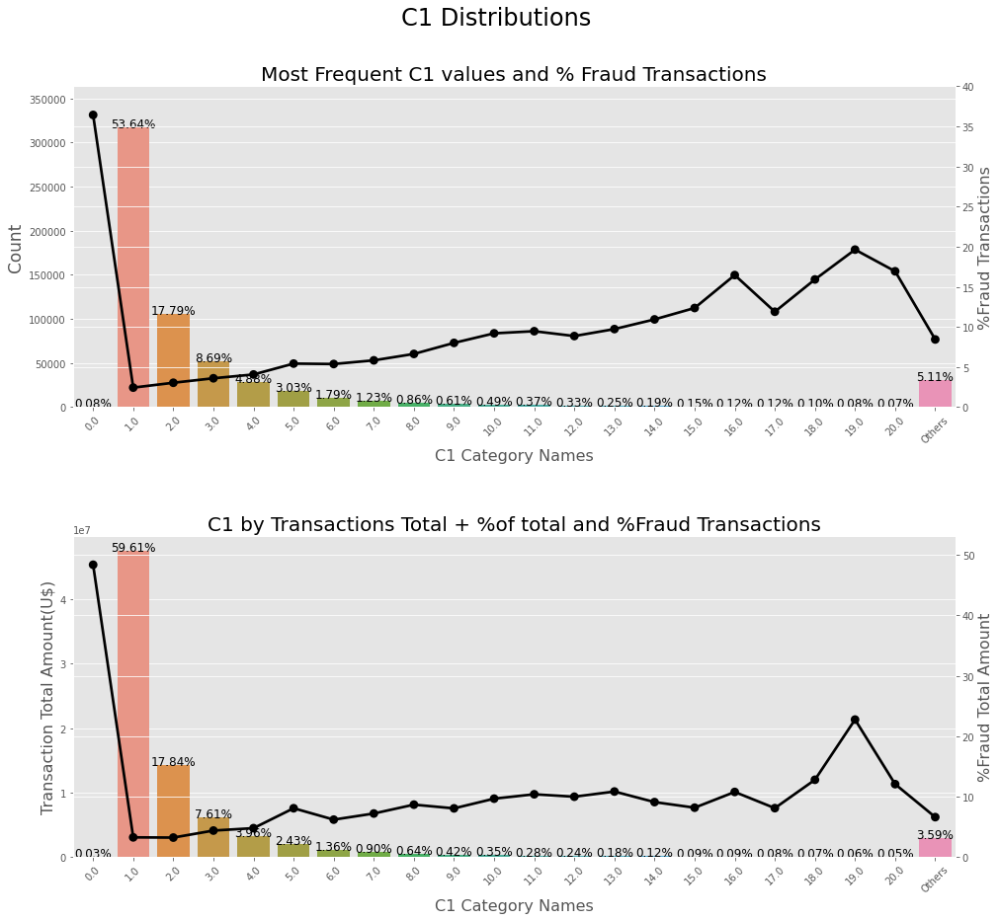

In [52]:
# C1 Distribution Plot
ploting_cnt_amt(train, 'C1')

In [53]:
train.loc[train.C2.isin(train.C2.value_counts()[train.C2.value_counts() <= 350]
                             .index), 'C2'] = 'Others'

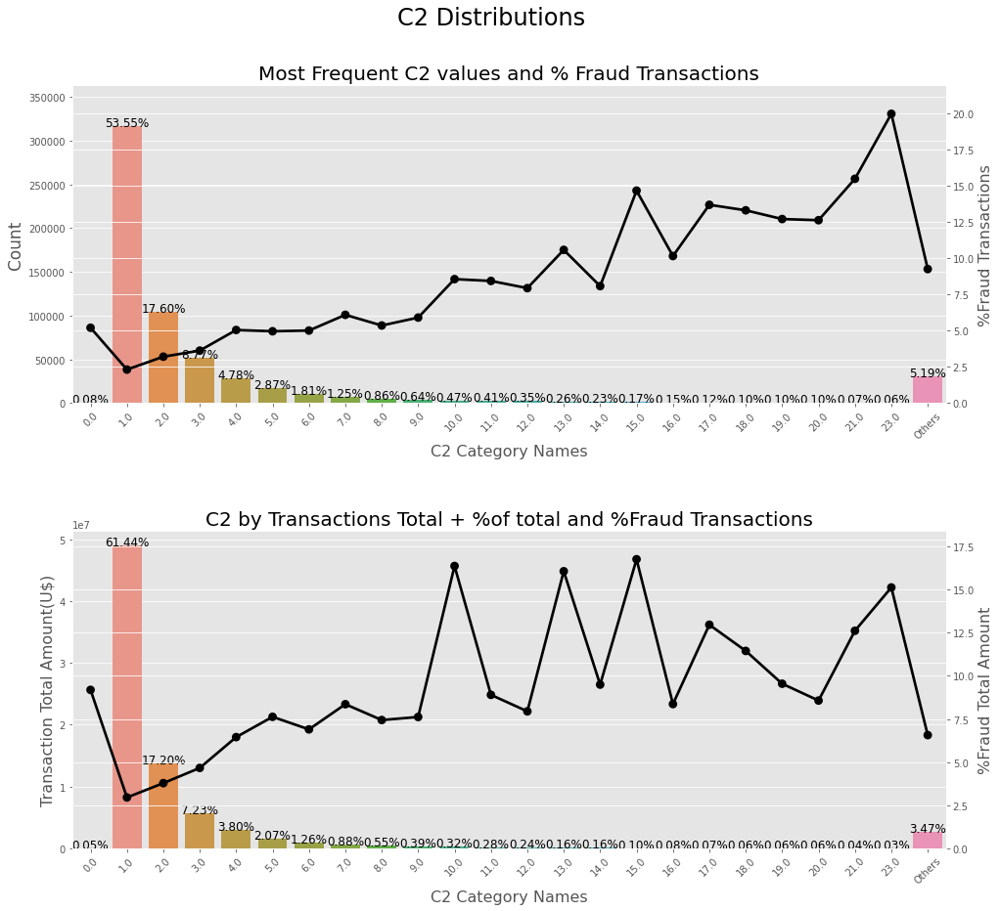

In [54]:
# C2 Distribution Plot
ploting_cnt_amt(train, 'C2')

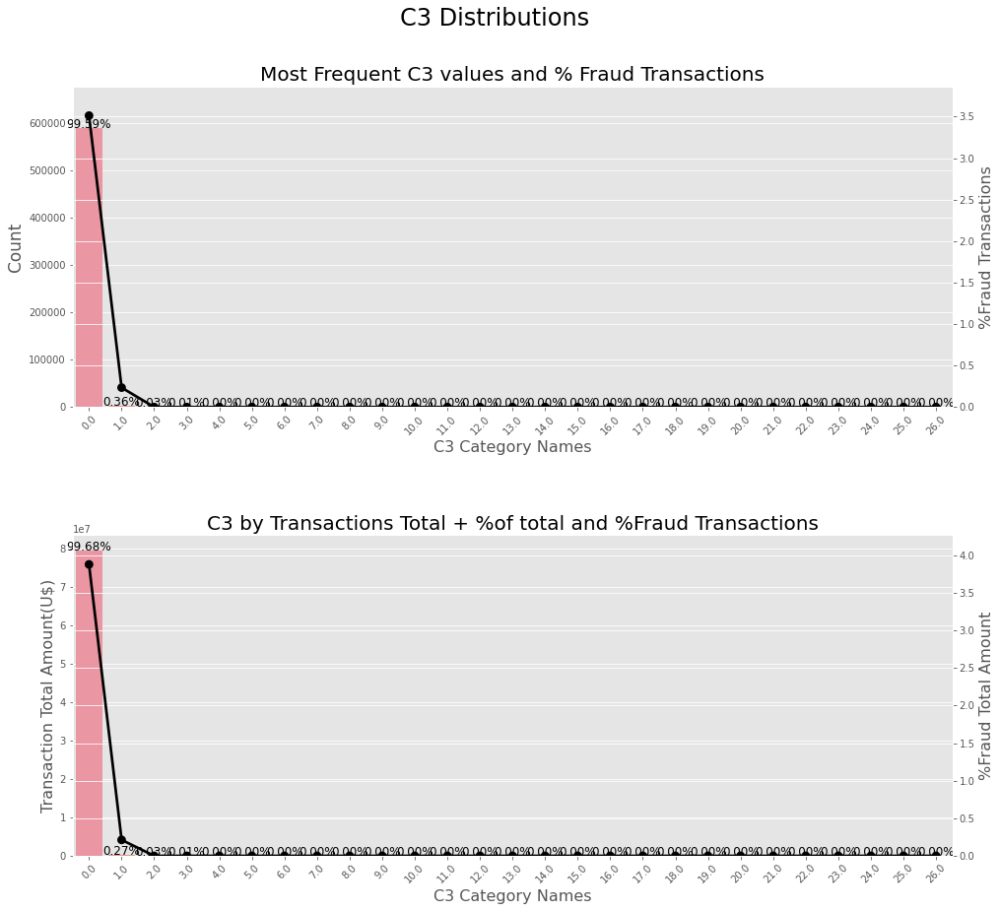

In [55]:
# C3 Distribution Plot
ploting_cnt_amt(train, 'C3')

In [56]:
train.loc[train.C4.isin(train.C4.value_counts()[train.C4.value_counts() <= 350]
                             .index), 'C4'] = 'Others'

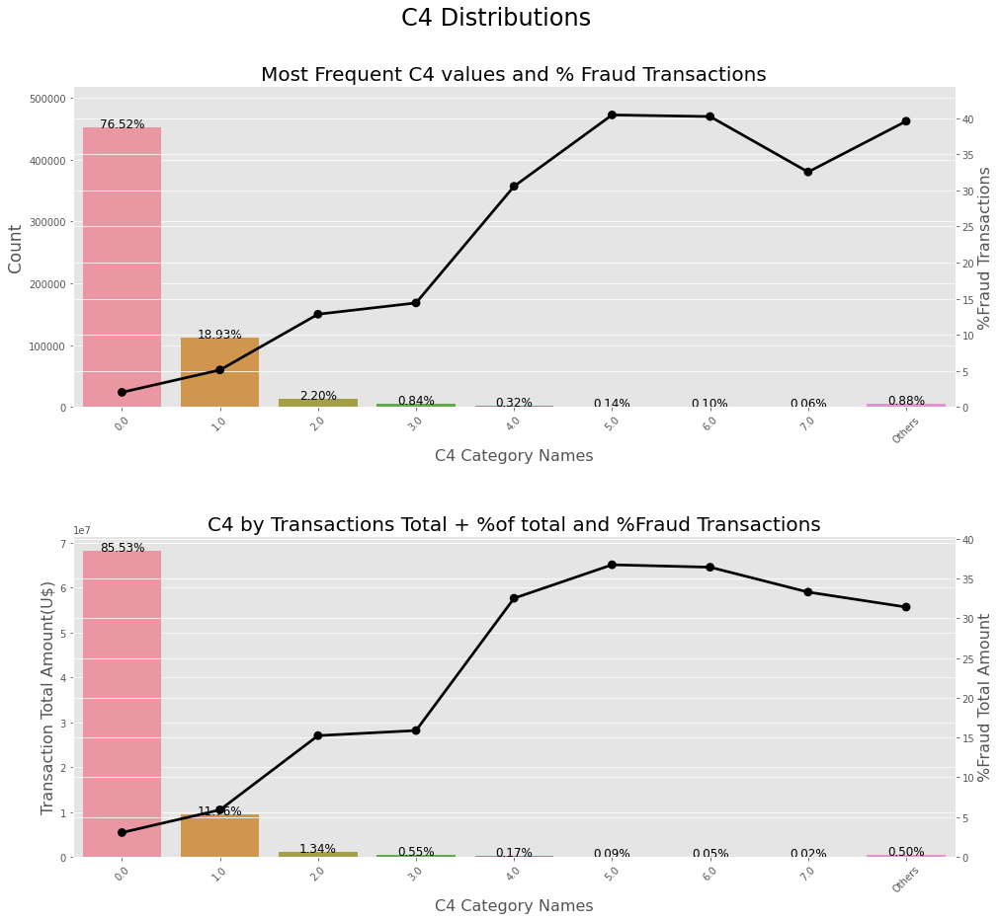

In [57]:
# C4 Distribution Plot
ploting_cnt_amt(train, 'C4')

In [58]:
train.loc[train.C5.isin(train.C5.value_counts()[train.C5.value_counts() <= 350]
                             .index), 'C5'] = 'Others'

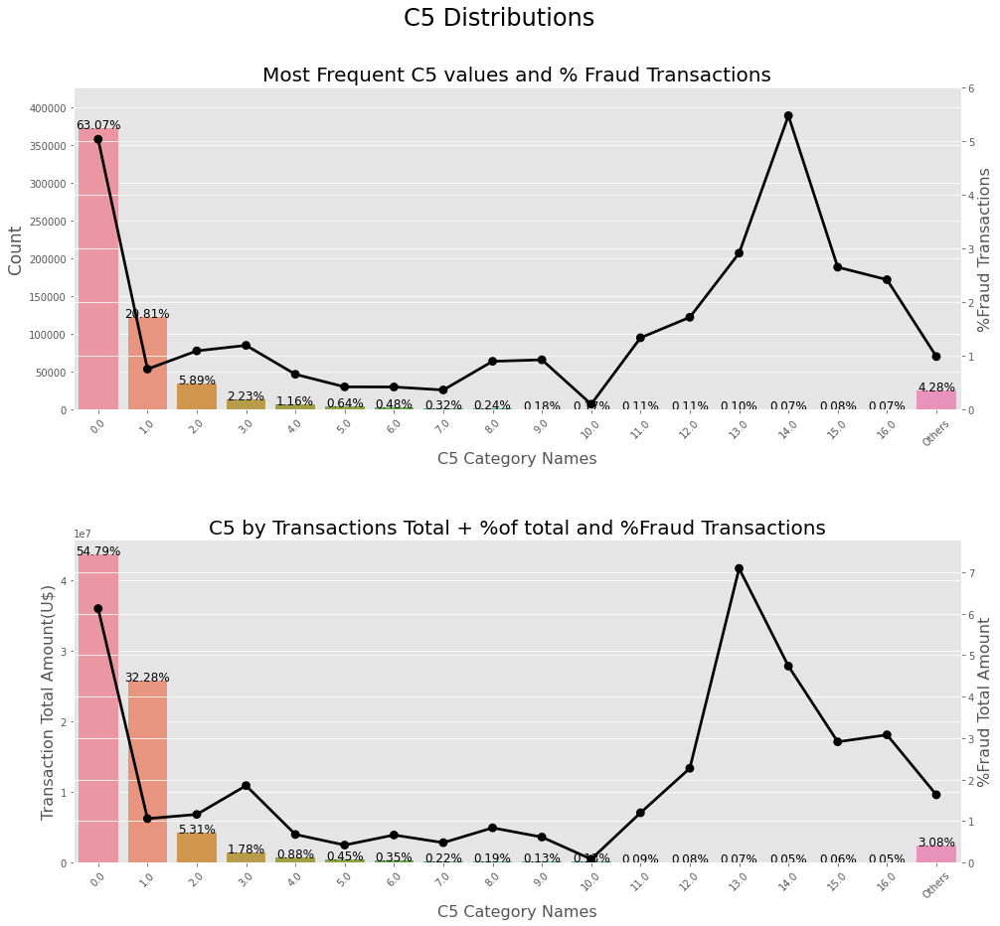

In [59]:
# C5 Distribution Plot
ploting_cnt_amt(train, 'C5')

In [60]:
train.loc[train.C6.isin(train.C6.value_counts()[train.C6.value_counts() <= 500]
                             .index), 'C6'] = 'Others'

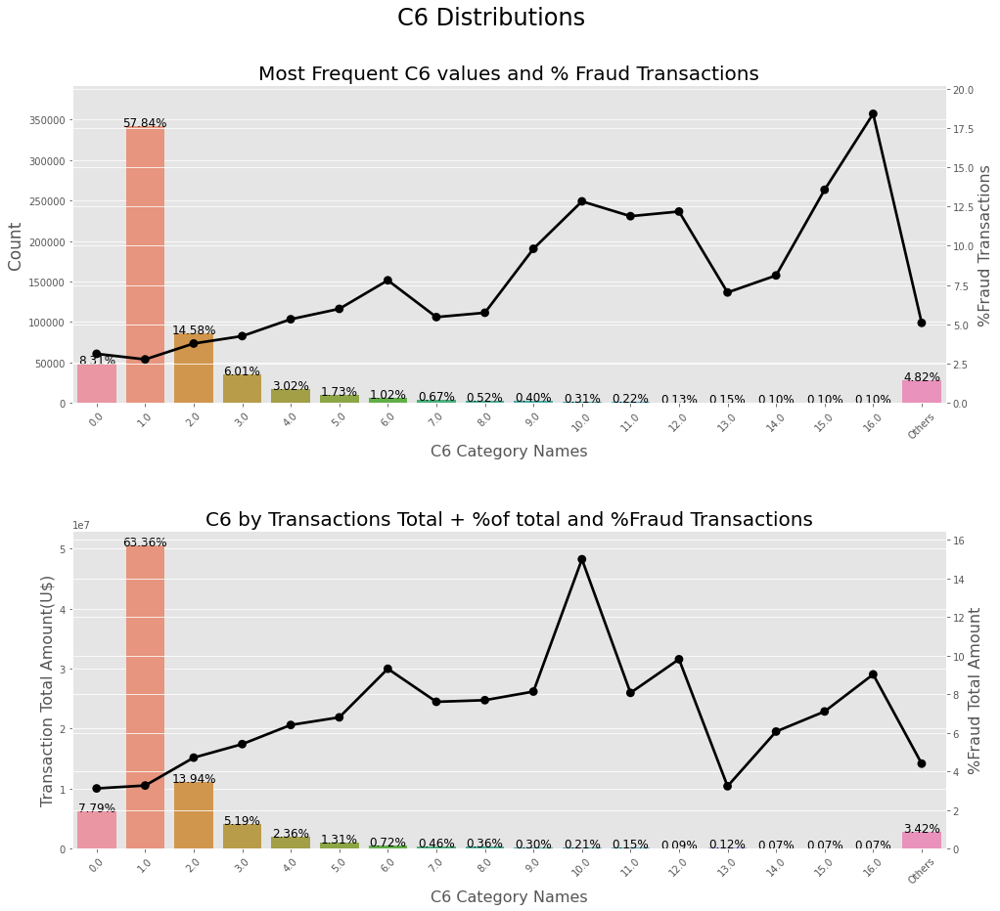

In [61]:
# C6 Distribution Plot
ploting_cnt_amt(train, 'C6')

In [62]:
train.loc[train.C7.isin(train.C7.value_counts()[train.C7.value_counts() <= 500]
                             .index), 'C7'] = 'Others'

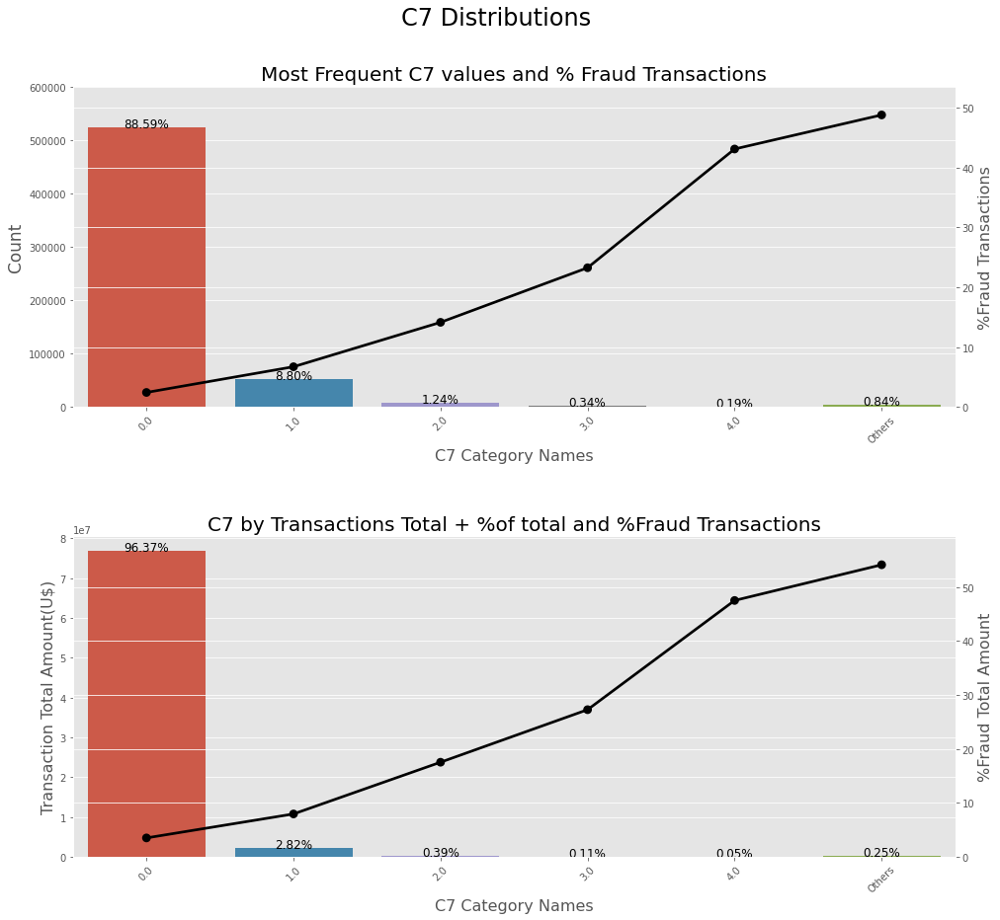

In [63]:
# C7 Distribution Plot
ploting_cnt_amt(train, 'C7')

In [64]:
train.loc[train.C8.isin(train.C8.value_counts()[train.C8.value_counts() <= 500]
                             .index), 'C8'] = 'Others'

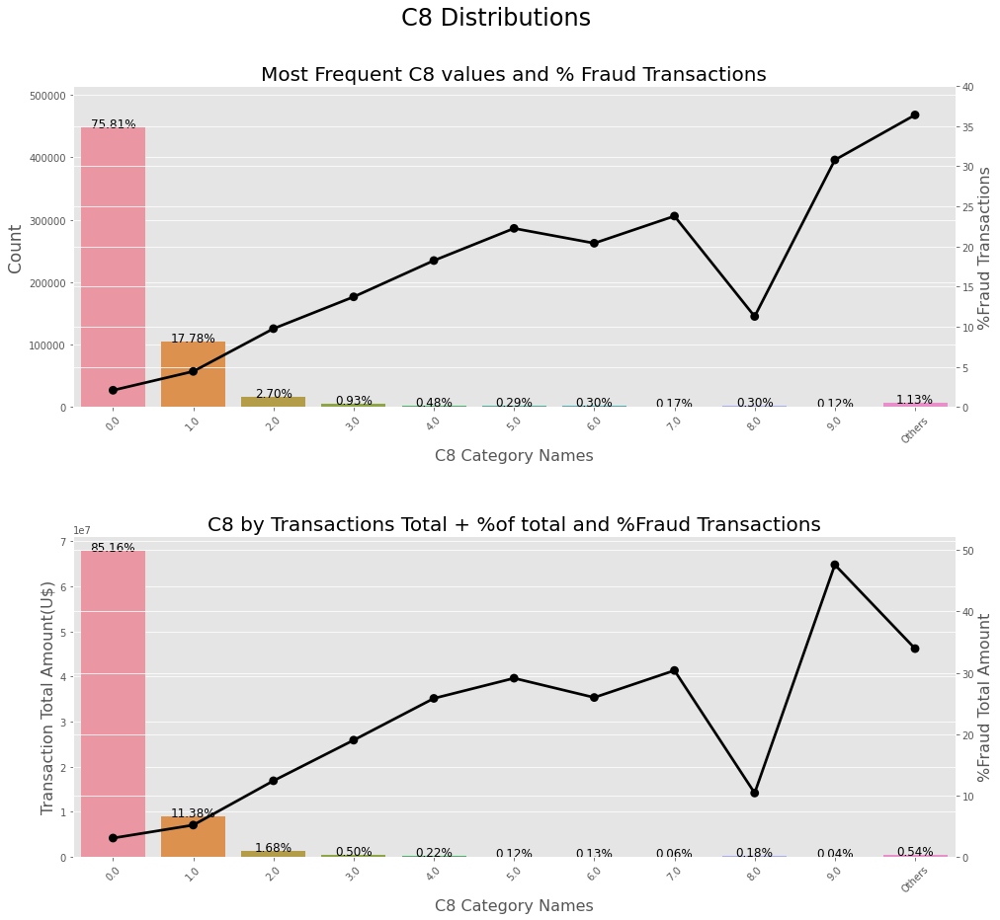

In [65]:
# C8 Distribution Plot
ploting_cnt_amt(train, 'C8')

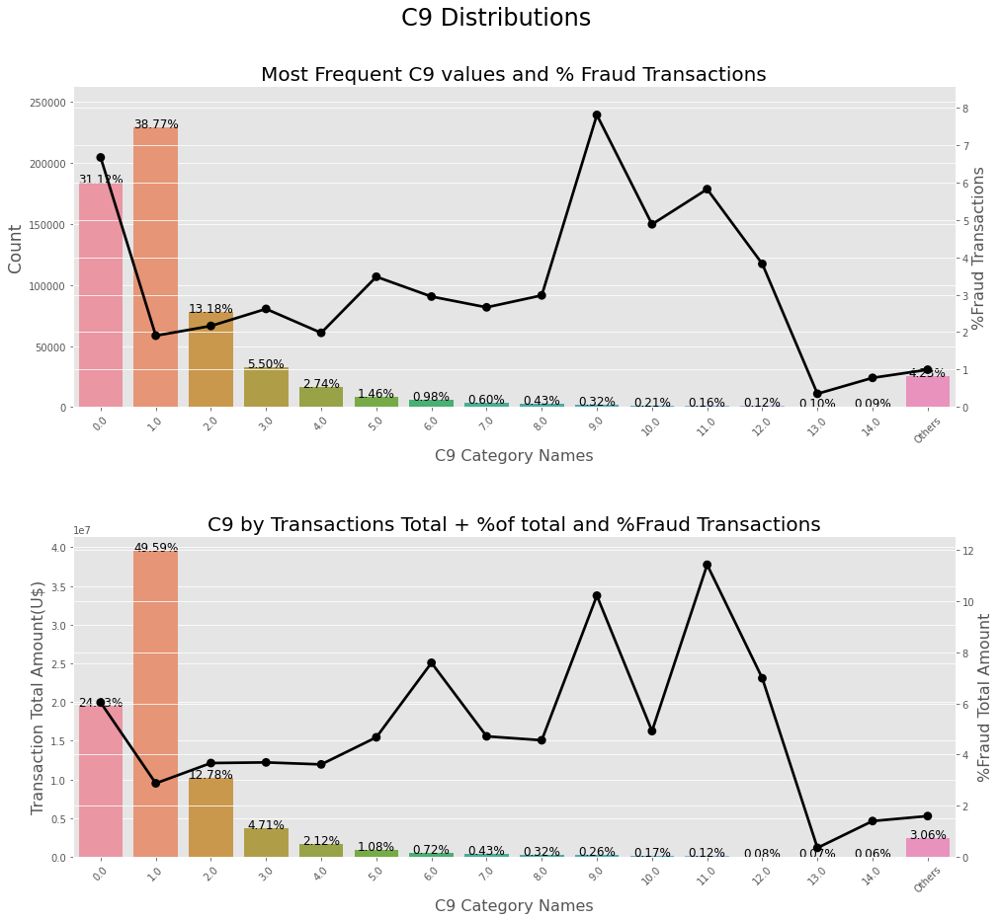

In [66]:
train.loc[train.C9.isin(train.C9.value_counts()[train.C9.value_counts() <= 500]
                             .index), 'C9'] = 'Others'
# C9 Distribution Plot
ploting_cnt_amt(train, 'C9')

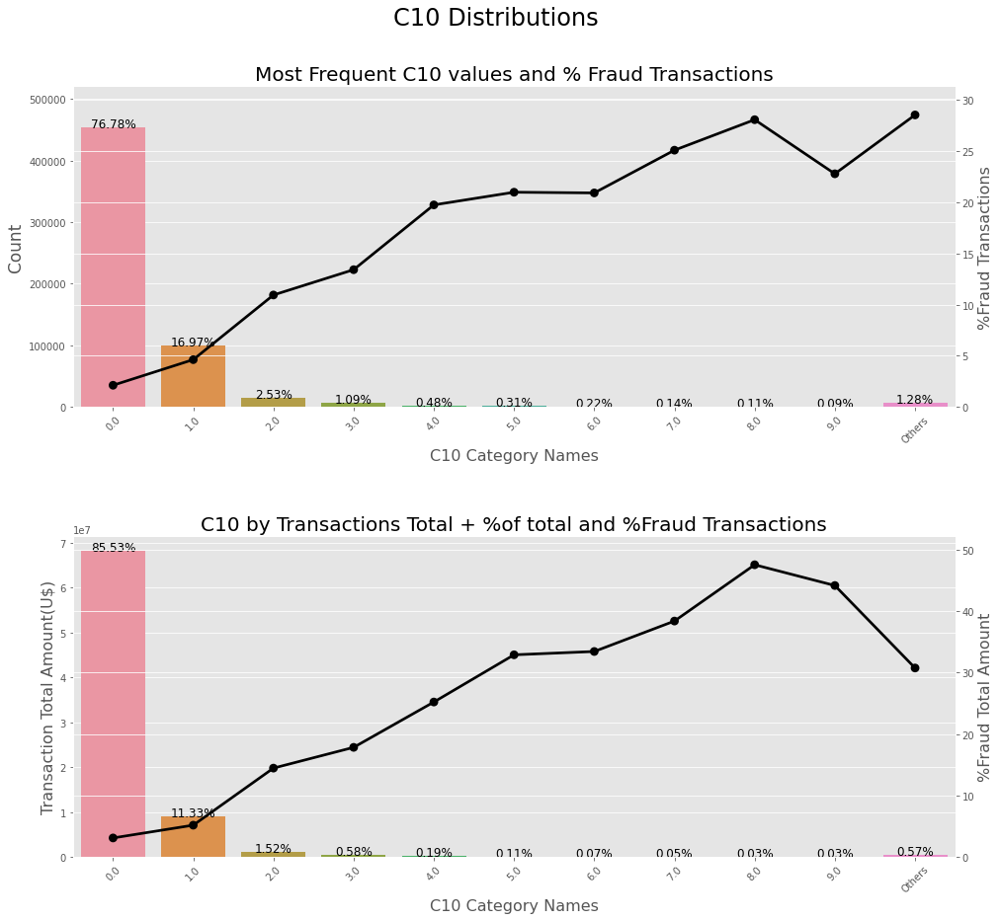

In [67]:
train.loc[train.C10.isin(train.C10.value_counts()[train.C10.value_counts() <= 500]
                             .index), 'C10'] = 'Others'
# C10 Distribution Plot
ploting_cnt_amt(train, 'C10')

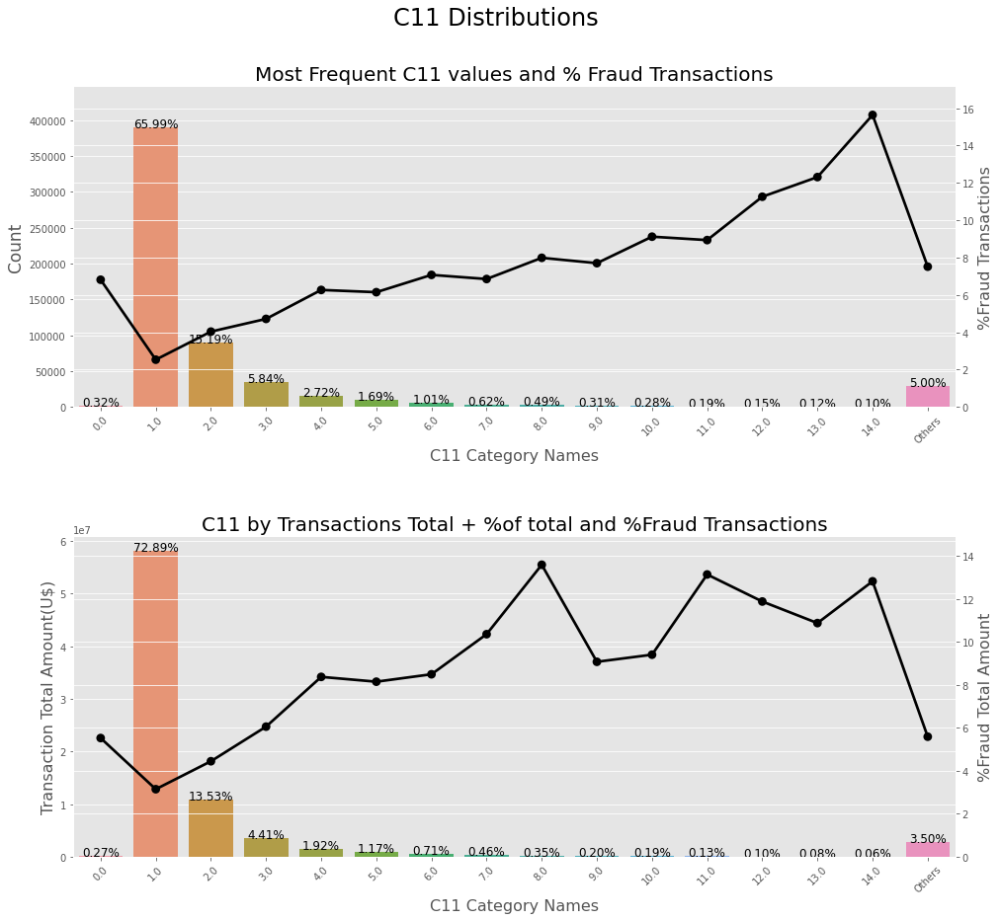

In [68]:
train.loc[train.C11.isin(train.C11.value_counts()[train.C11.value_counts() <= 500]
                             .index), 'C11'] = 'Others'
# C11 Distribution Plot
ploting_cnt_amt(train, 'C11')

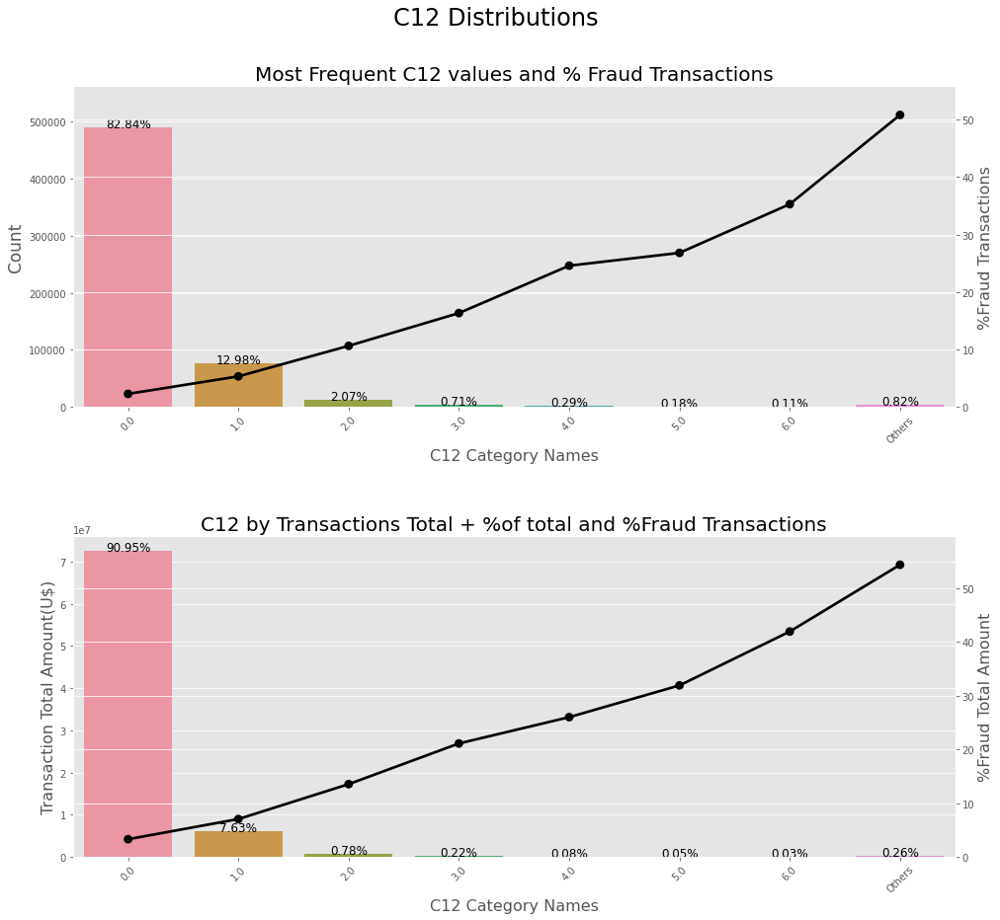

In [69]:
train.loc[train.C12.isin(train.C12.value_counts()[train.C12.value_counts() <= 500]
                             .index), 'C12'] = 'Others'
# C12 Distribution Plot
ploting_cnt_amt(train, 'C12')

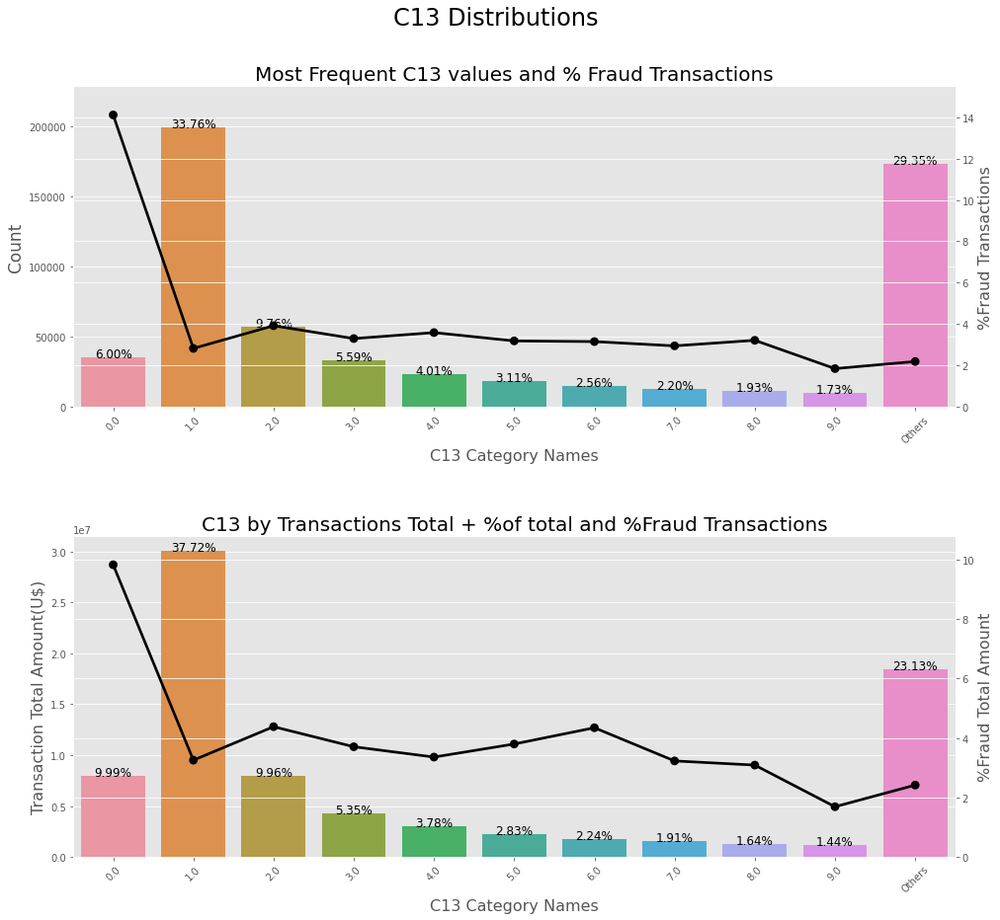

In [70]:
train.loc[train.C13.isin(train.C13.value_counts()[train.C13.value_counts() <= 10000]
                             .index), 'C13'] = 'Others'
# C13 Distribution Plot
ploting_cnt_amt(train, 'C13')

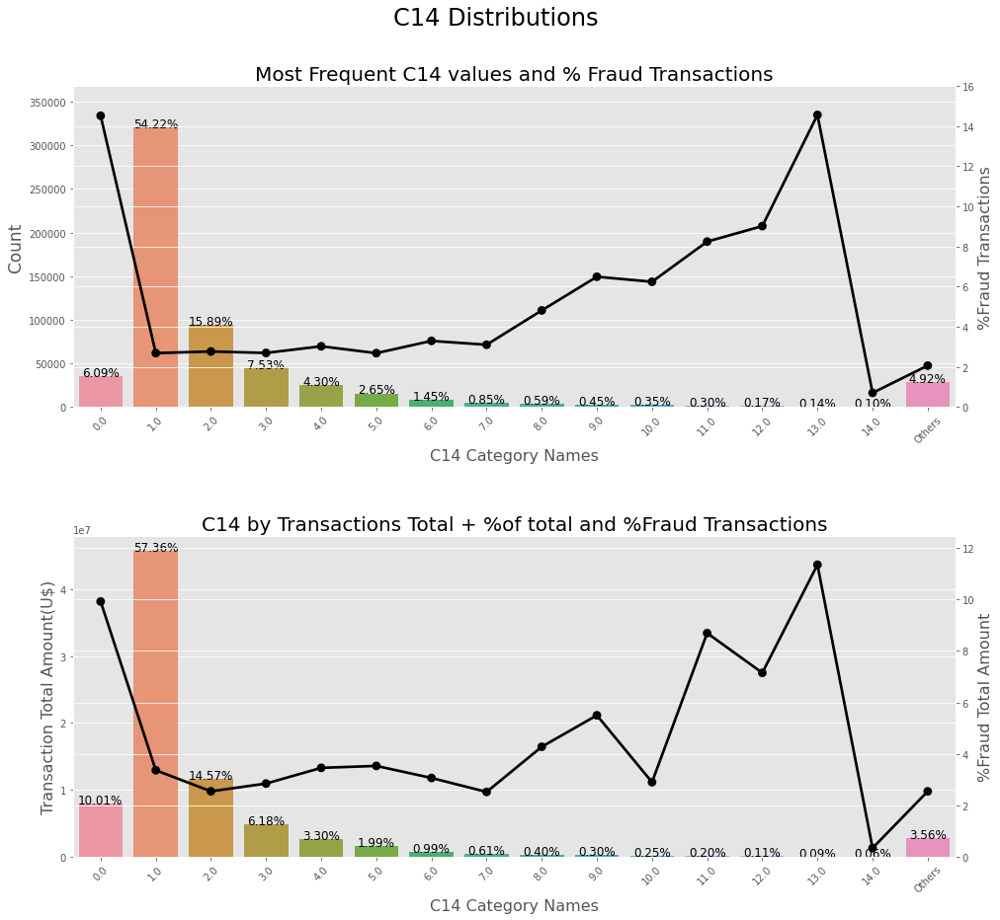

In [71]:
train.loc[train.C14.isin(train.C14.value_counts()[train.C14.value_counts() <= 500]
                             .index), 'C14'] = 'Others'
# C14 Distribution Plot
ploting_cnt_amt(train, 'C14')

#### Dist1 and Dist2

In [72]:
resumetable(train[['dist1', 'dist2']])

Dataset Shape: (590540, 2)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,dist1,float64,352271,2651,19.0,NaN,287.0,6.34
1,dist2,float64,552913,1751,NaN,NaN,NaN,7.42


In [73]:
train[['dist1', 'dist2']].describe()

,dist1,dist2
count,238269.000000000000000,37627.000000000000000
mean,118.502180308810637,231.855422967549885
std,371.872026491167389,529.053493552950727
min,0.000000000000000,0.000000000000000
25%,3.000000000000000,7.000000000000000
50%,8.000000000000000,37.000000000000000
75%,24.000000000000000,206.000000000000000
max,10286.000000000000000,11623.000000000000000


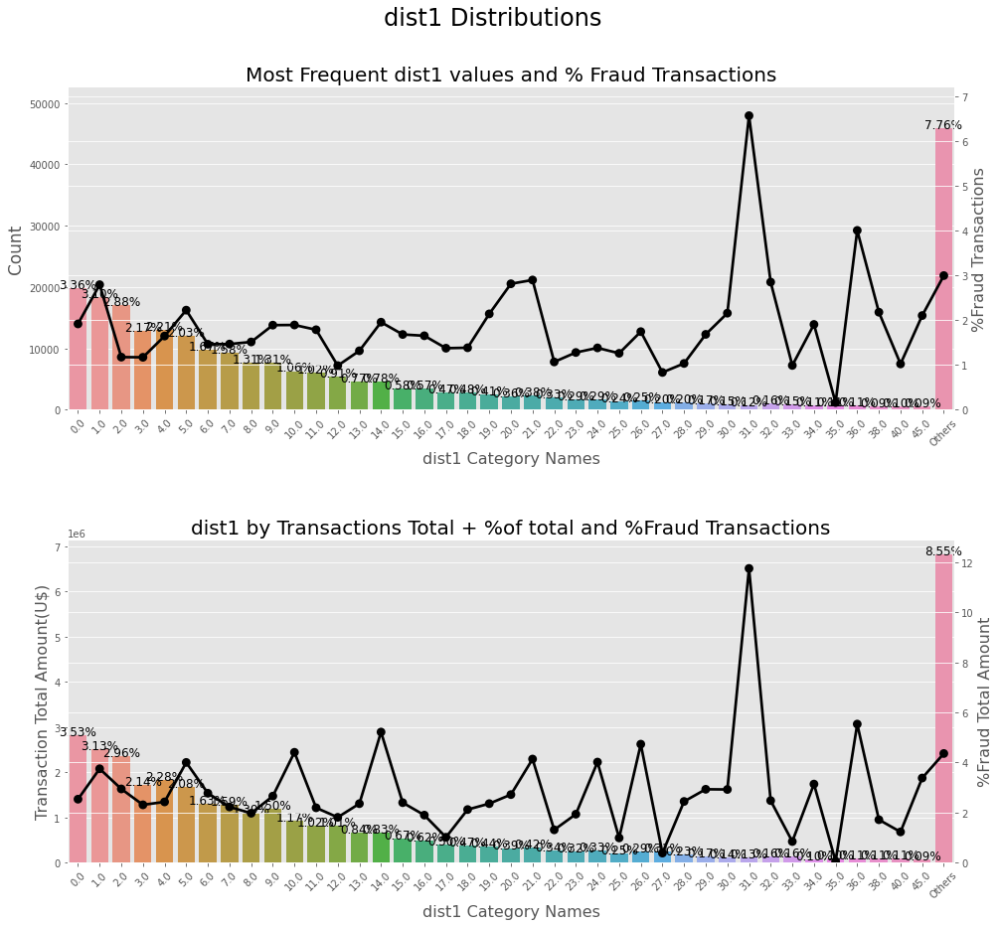

In [74]:
train.loc[train.dist1.isin(train.dist1.value_counts()[train.dist1.value_counts() <= 500]
                             .index), 'dist1'] = 'Others'
# dist1 Distribution Plot
ploting_cnt_amt(train, 'dist1')

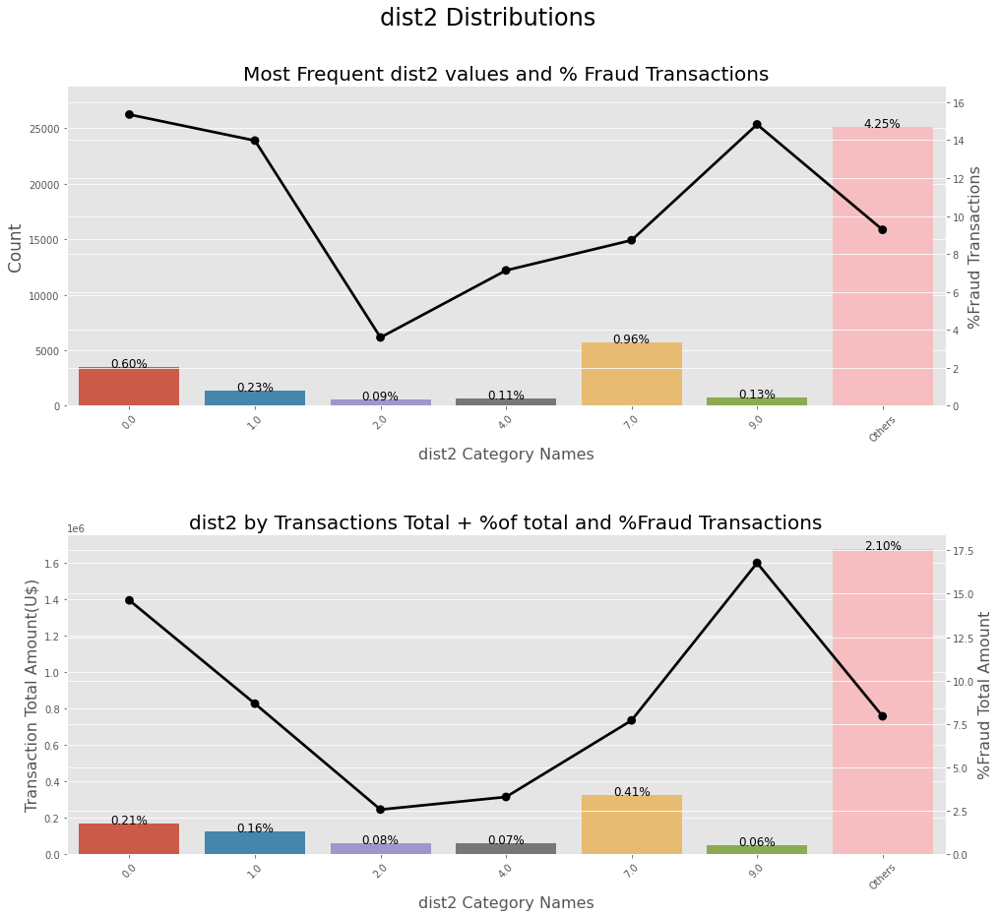

In [75]:
train.loc[train.dist2.isin(train.dist2.value_counts()[train.dist2.value_counts() <= 500]
                             .index), 'dist2'] = 'Others'
# dist2 Distribution Plot
ploting_cnt_amt(train, 'dist2')

#### D1-D15

In [76]:
resumetable(train[['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']])

Dataset Shape: (590540, 15)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,D1,float64,1269,641,14.0,0.0,0.0,5.57
1,D2,float64,280797,641,NaN,NaN,NaN,8.57
2,D3,float64,262878,649,13.0,NaN,NaN,5.60
3,D4,float64,168922,808,NaN,0.0,0.0,6.42
4,D5,float64,309841,688,NaN,NaN,NaN,5.95
5,D6,float64,517353,829,NaN,NaN,NaN,4.09
6,D7,float64,551623,597,NaN,NaN,NaN,4.29
7,D8,float64,515614,12353,NaN,NaN,NaN,11.32
8,D9,float64,515614,24,NaN,NaN,NaN,4.29
9,D10,float64,76022,818,13.0,0.0,0.0,6.09


In [77]:
train[['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']].describe()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,589271.000000000000000,309743.000000000000000,327662.000000000000000,421618.000000000000000,280699.000000000000000,73187.000000000000000,38917.000000000000000,74926.000000000000000,74926.000000000000000,514518.000000000000000,311253.000000000000000,64717.000000000000000,61952.000000000000000,62187.000000000000000,501427.000000000000000
mean,94.347568436254292,169.563231453172477,28.343347718075332,140.002440597887187,42.335964859155183,69.805716862284285,41.638949559318547,146.058107646878710,0.561057126596166,123.982136679377589,146.621465495914890,54.037532642118762,17.901294550619834,57.724444015630276,163.744578971614999
std,157.660386520898697,177.315864942072068,62.384721370068242,191.096773526366064,89.000144339782452,143.669252942601588,99.743263540217356,231.663839969046478,0.316879565697502,182.615224535141010,186.042622014270705,124.274558380139581,67.614425024841864,136.312450288663740,202.726659900955582
min,0.000000000000000,0.000000000000000,0.000000000000000,-122.000000000000000,0.000000000000000,-83.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,-53.000000000000000,-83.000000000000000,0.000000000000000,-193.000000000000000,-83.000000000000000
25%,0.000000000000000,26.000000000000000,1.000000000000000,0.000000000000000,1.000000000000000,0.000000000000000,0.000000000000000,0.958333015441894,0.208333000540733,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
50%,3.000000000000000,97.000000000000000,8.000000000000000,26.000000000000000,10.000000000000000,0.000000000000000,0.000000000000000,37.875000000000000,0.666665971279144,15.000000000000000,43.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,52.000000000000000
75%,122.000000000000000,276.000000000000000,27.000000000000000,253.000000000000000,32.000000000000000,40.000000000000000,17.000000000000000,187.958328247070312,0.833333015441895,197.000000000000000,274.000000000000000,13.000000000000000,0.000000000000000,2.000000000000000,314.000000000000000
max,640.000000000000000,640.000000000000000,819.000000000000000,869.000000000000000,819.000000000000000,873.000000000000000,843.000000000000000,1707.791625976562500,0.958333015441894,876.000000000000000,670.000000000000000,648.000000000000000,847.000000000000000,878.000000000000000,879.000000000000000


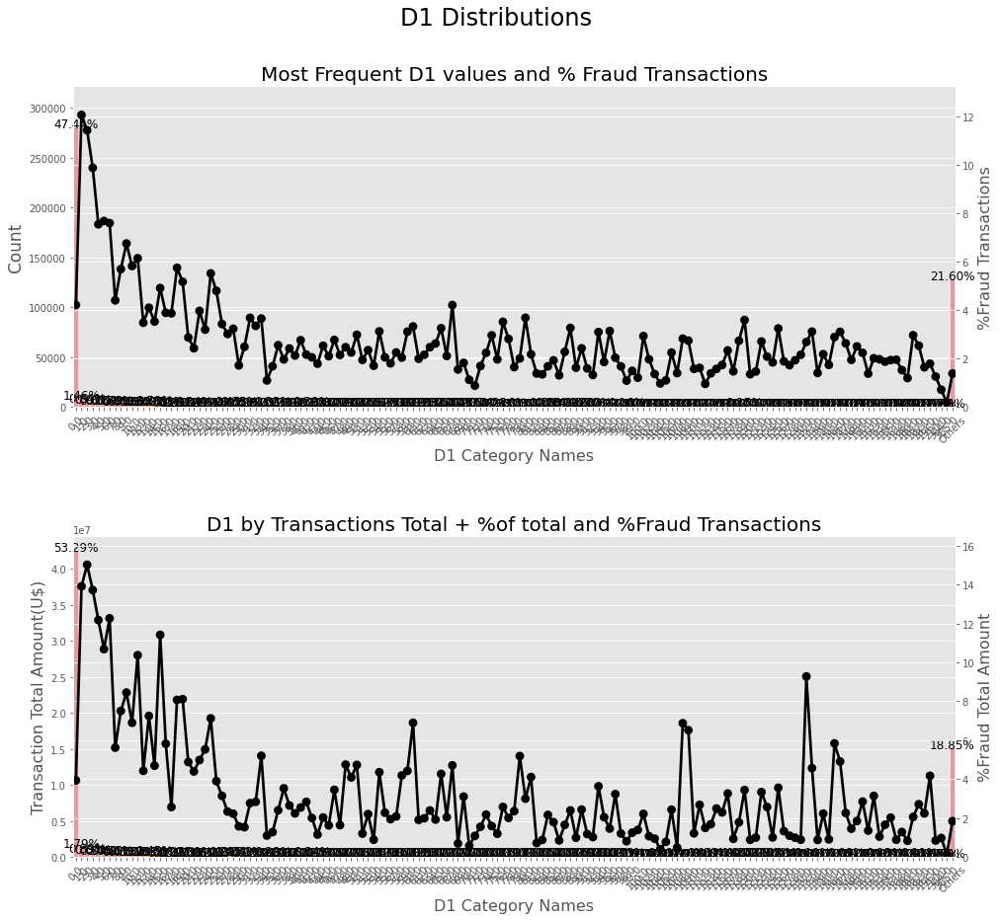

In [78]:
train.loc[train.D1.isin(train.D1.value_counts()[train.D1.value_counts() <= 500]
                             .index), 'D1'] = 'Others'
# D1 Distribution Plot
ploting_cnt_amt(train, 'D1')

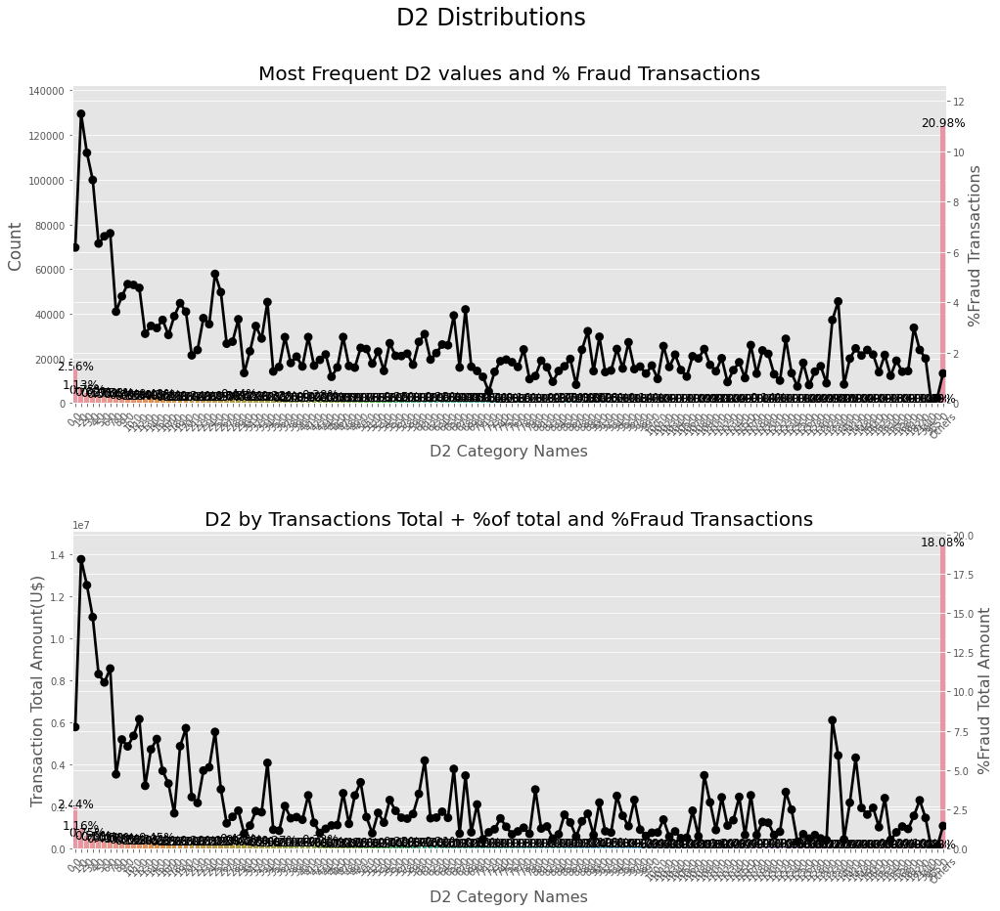

In [79]:
train.loc[train.D2.isin(train.D2.value_counts()[train.D2.value_counts() <= 500]
                             .index), 'D2'] = 'Others'
# D2 Distribution Plot
ploting_cnt_amt(train, 'D2')

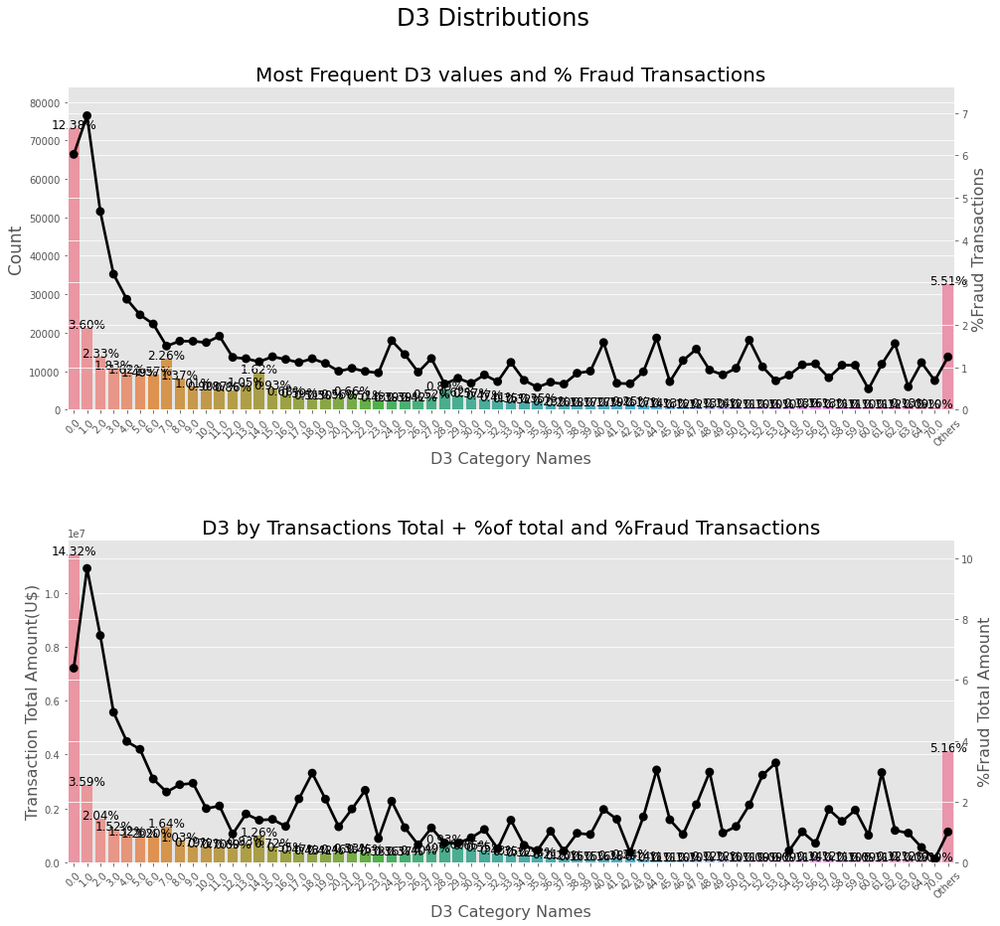

In [80]:
train.loc[train.D3.isin(train.D3.value_counts()[train.D3.value_counts() <= 500]
                             .index), 'D3'] = 'Others'
# D3 Distribution Plot
ploting_cnt_amt(train, 'D3')

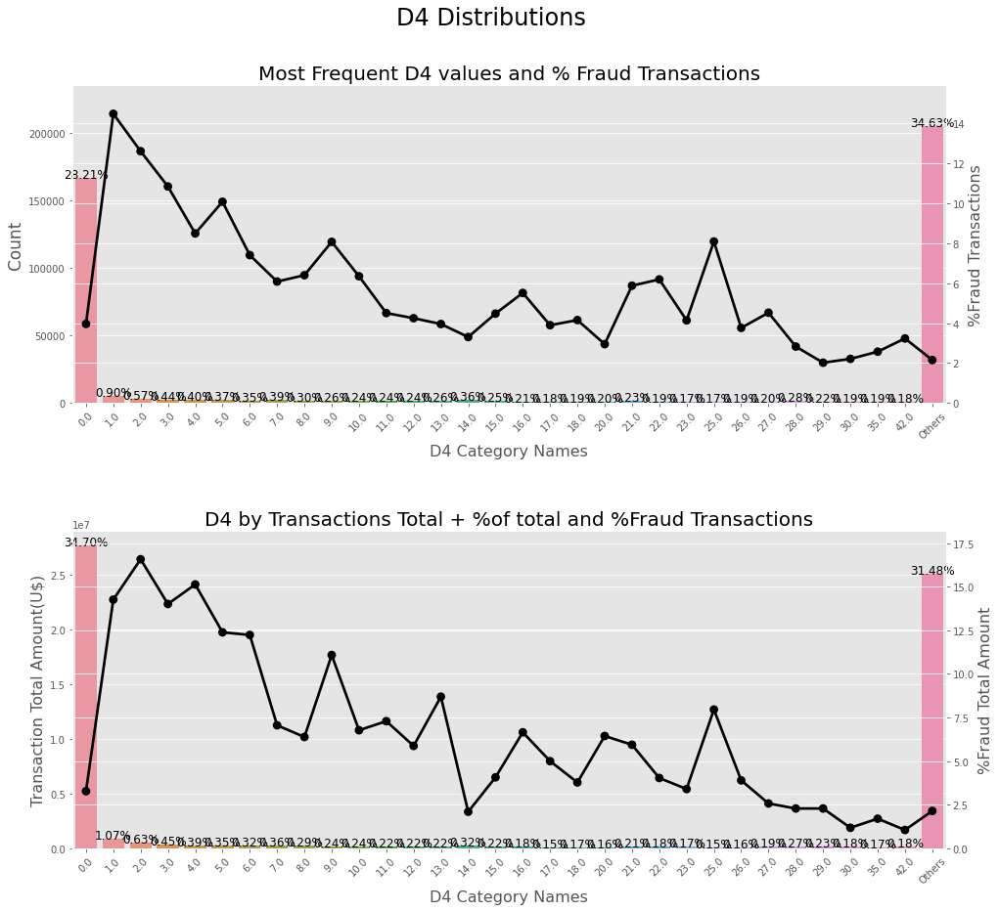

In [81]:
train.loc[train.D4.isin(train.D4.value_counts()[train.D4.value_counts() <= 1000]
                             .index), 'D4'] = 'Others'
# D4 Distribution Plot
ploting_cnt_amt(train, 'D4')

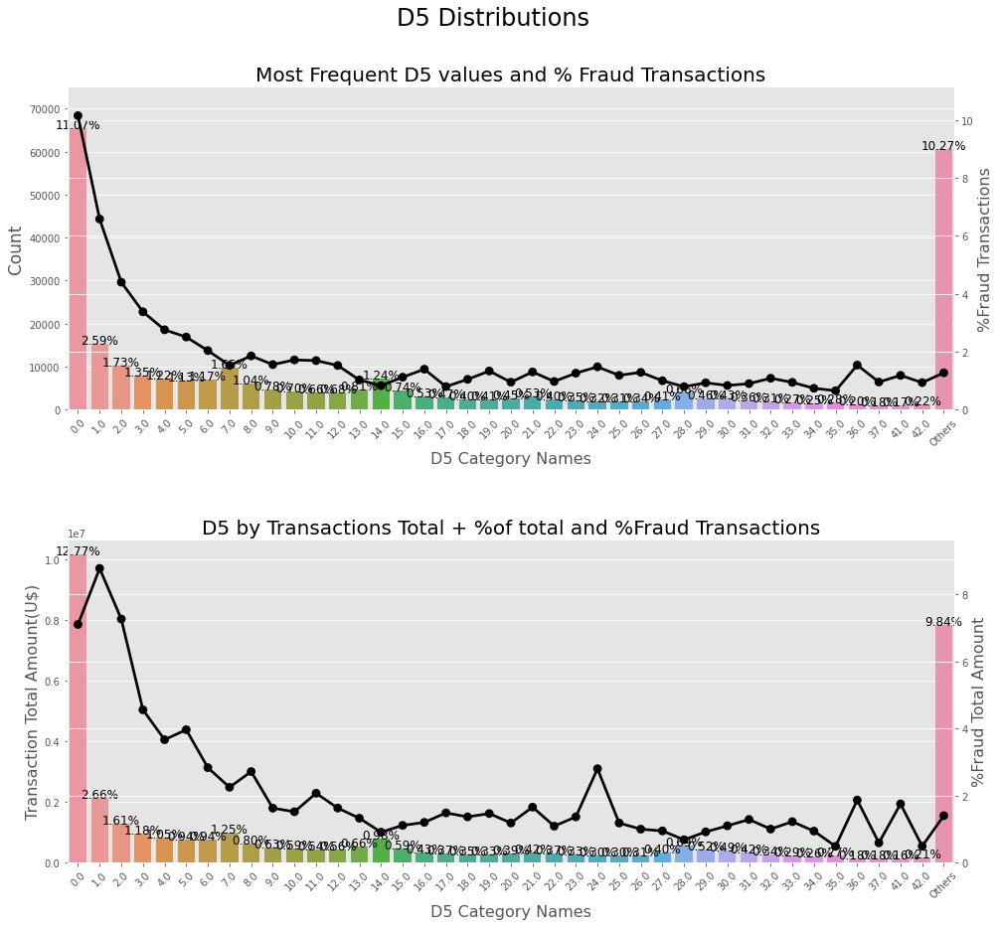

In [82]:
train.loc[train.D5.isin(train.D5.value_counts()[train.D5.value_counts() <= 1000]
                             .index), 'D5'] = 'Others'
# D5 Distribution Plot
ploting_cnt_amt(train, 'D5')

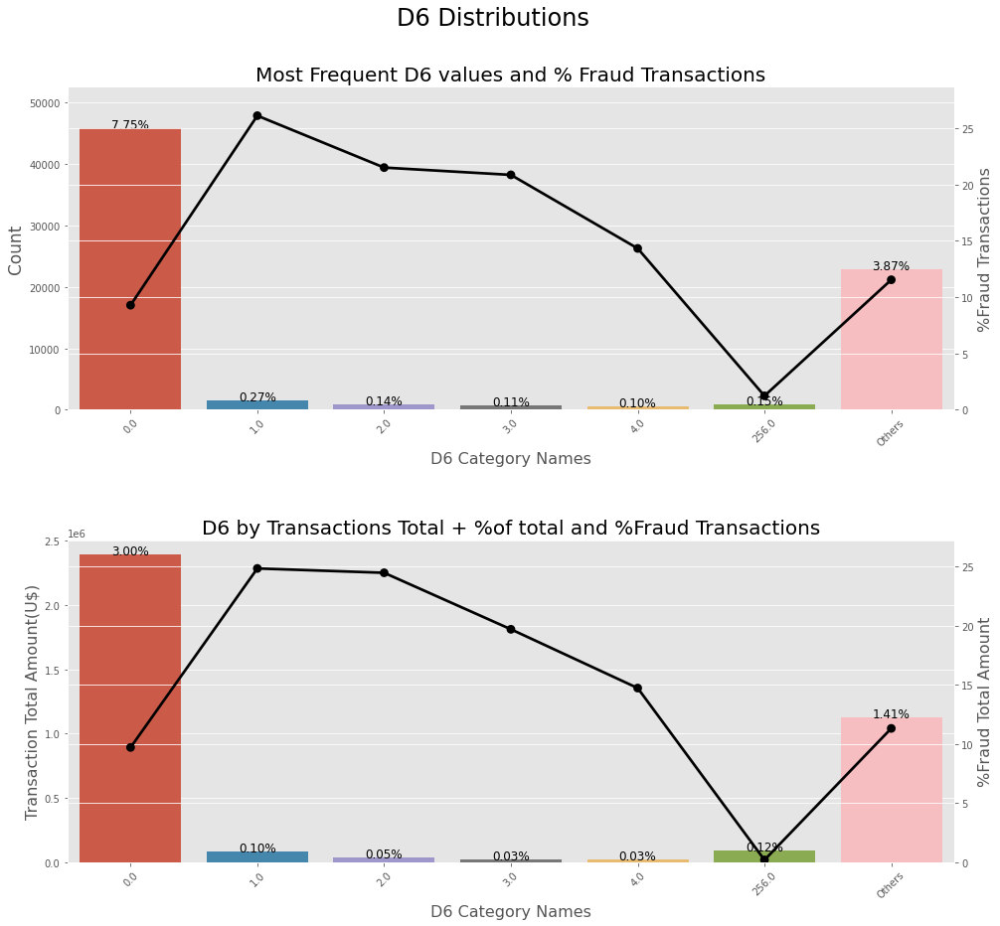

In [83]:
train.loc[train.D6.isin(train.D6.value_counts()[train.D6.value_counts() <= 500]
                             .index), 'D6'] = 'Others'
# D6 Distribution Plot
ploting_cnt_amt(train, 'D6')

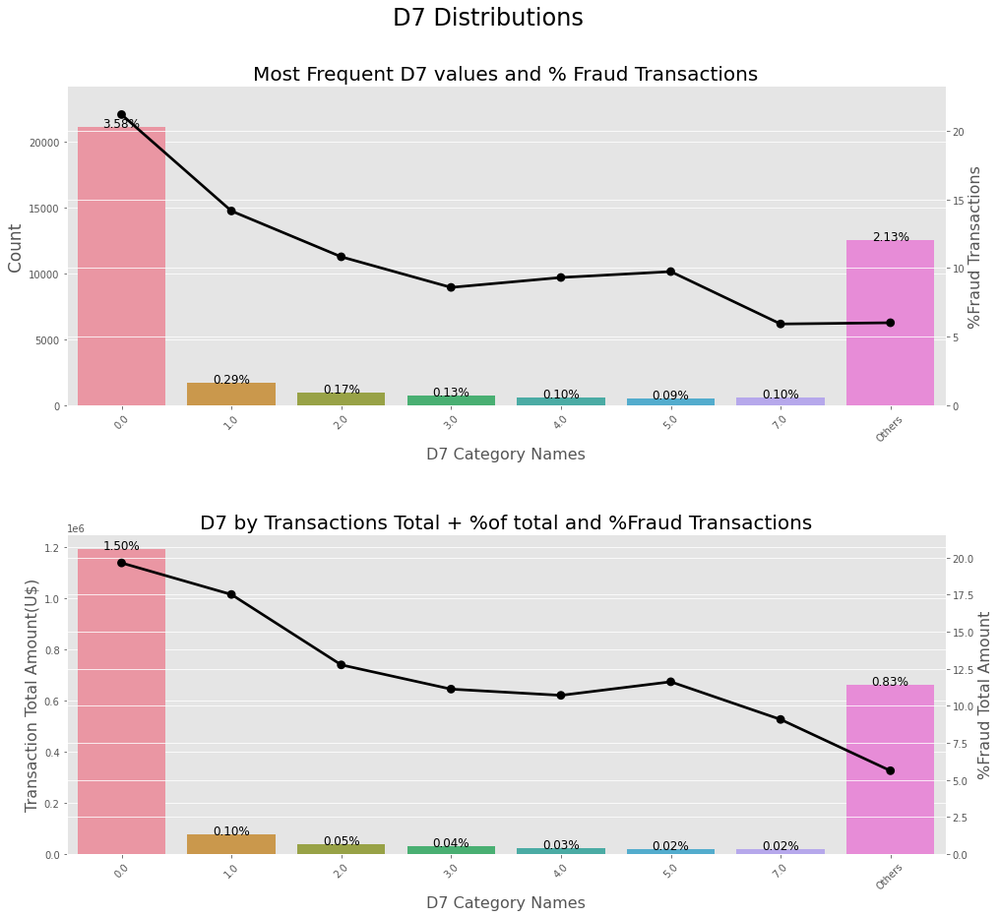

In [84]:
train.loc[train.D7.isin(train.D7.value_counts()[train.D7.value_counts() <= 500]
                             .index), 'D7'] = 'Others'
# D7 Distribution Plot
ploting_cnt_amt(train, 'D7')

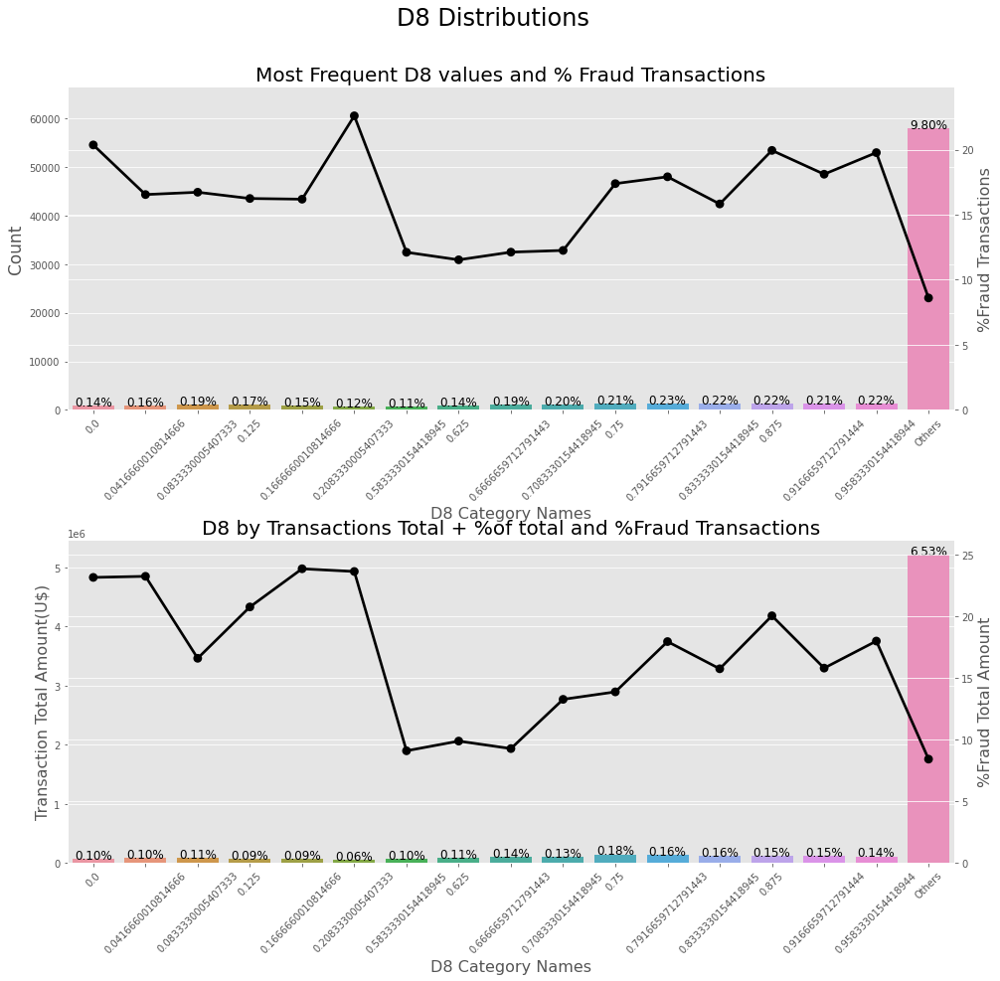

In [85]:
train.loc[train.D8.isin(train.D8.value_counts()[train.D8.value_counts() <= 500]
                             .index), 'D8'] = 'Others'
# D8 Distribution Plot
ploting_cnt_amt(train, 'D8')

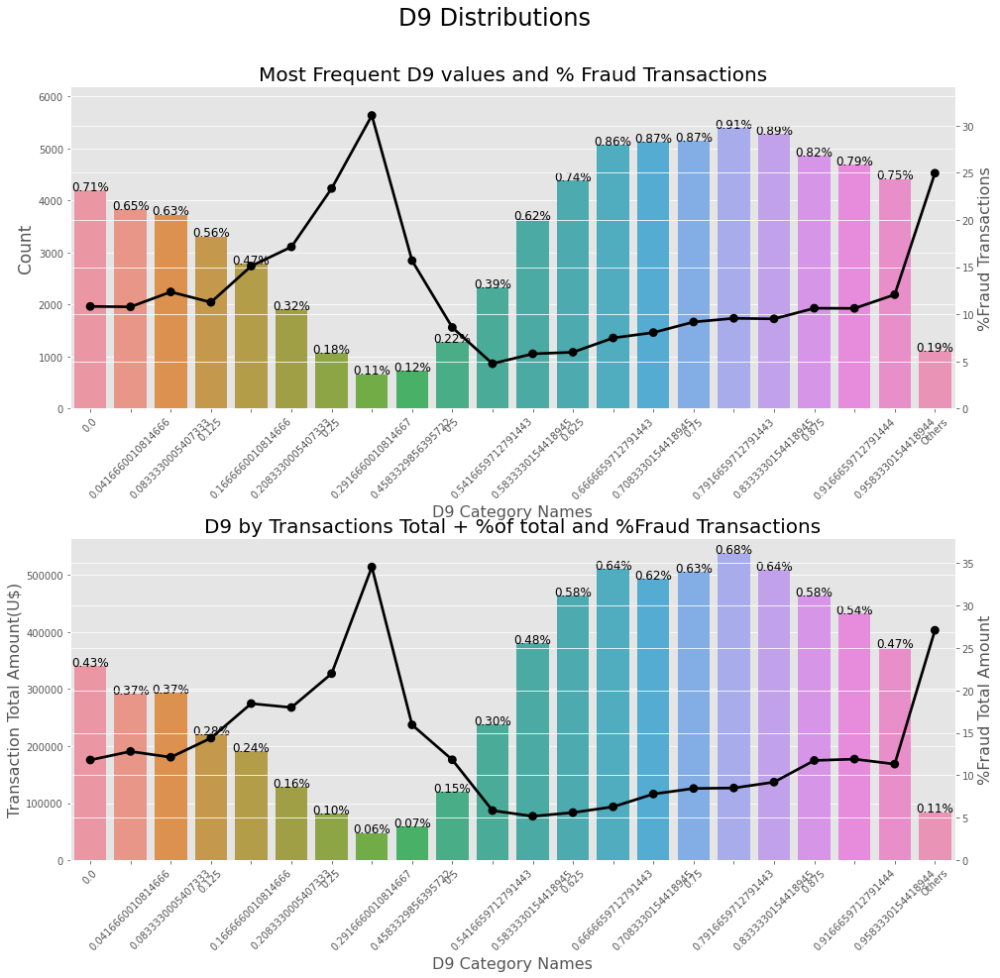

In [86]:
train.loc[train.D9.isin(train.D9.value_counts()[train.D9.value_counts() <= 500]
                             .index), 'D9'] = 'Others'
# D9 Distribution Plot
ploting_cnt_amt(train, 'D9')

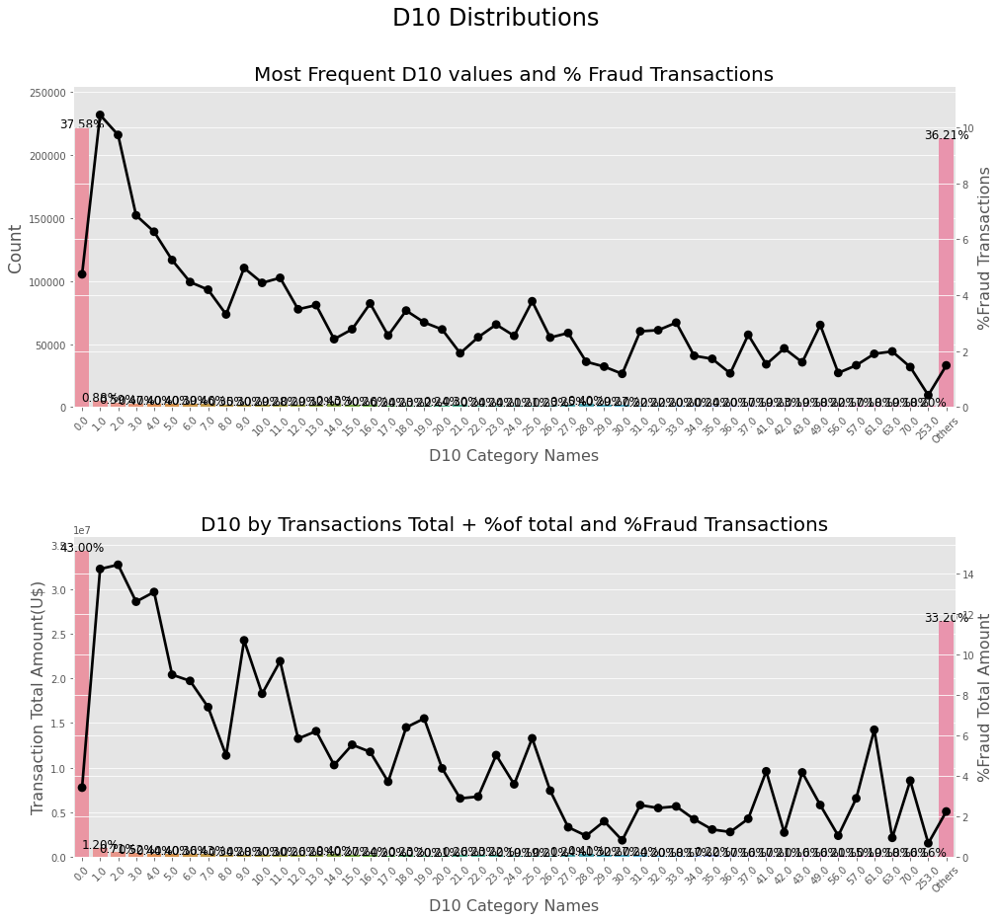

In [87]:
train.loc[train.D10.isin(train.D10.value_counts()[train.D10.value_counts() <= 1000]
                             .index), 'D10'] = 'Others'
# D10 Distribution Plot
ploting_cnt_amt(train, 'D10')

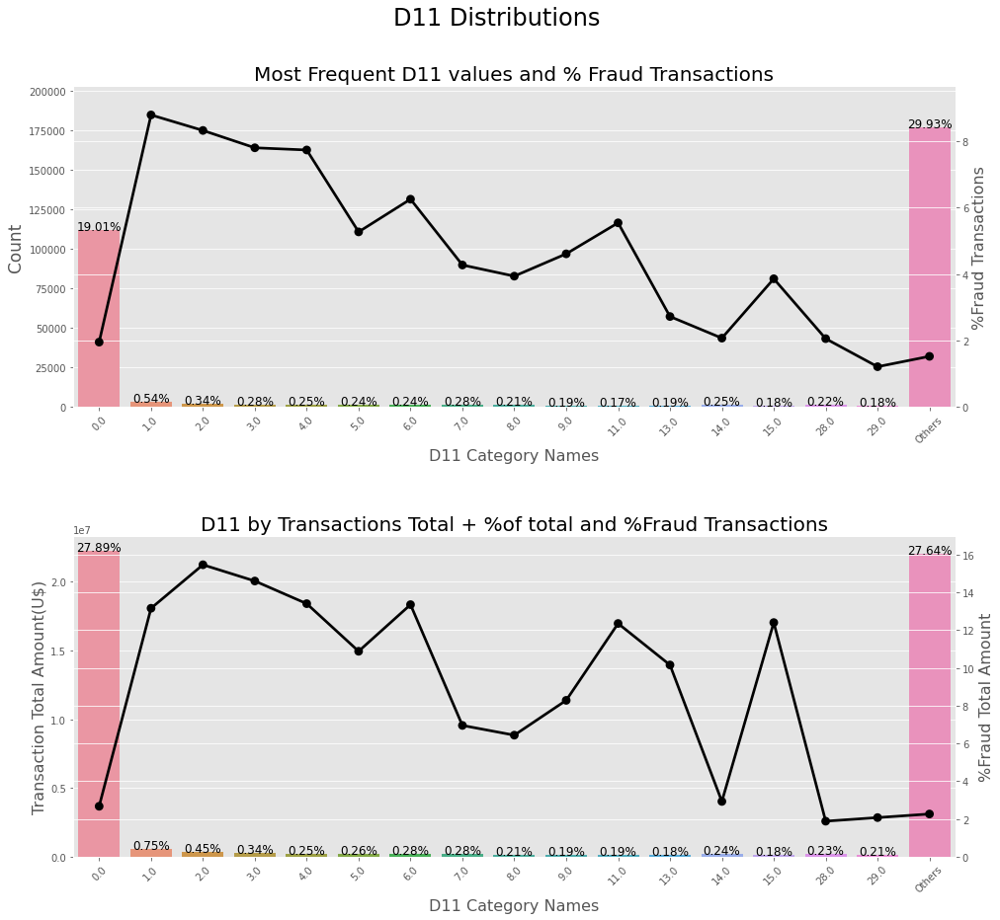

In [88]:
train.loc[train.D11.isin(train.D11.value_counts()[train.D11.value_counts() <= 1000]
                             .index), 'D11'] = 'Others'
# D11 Distribution Plot
ploting_cnt_amt(train, 'D11')

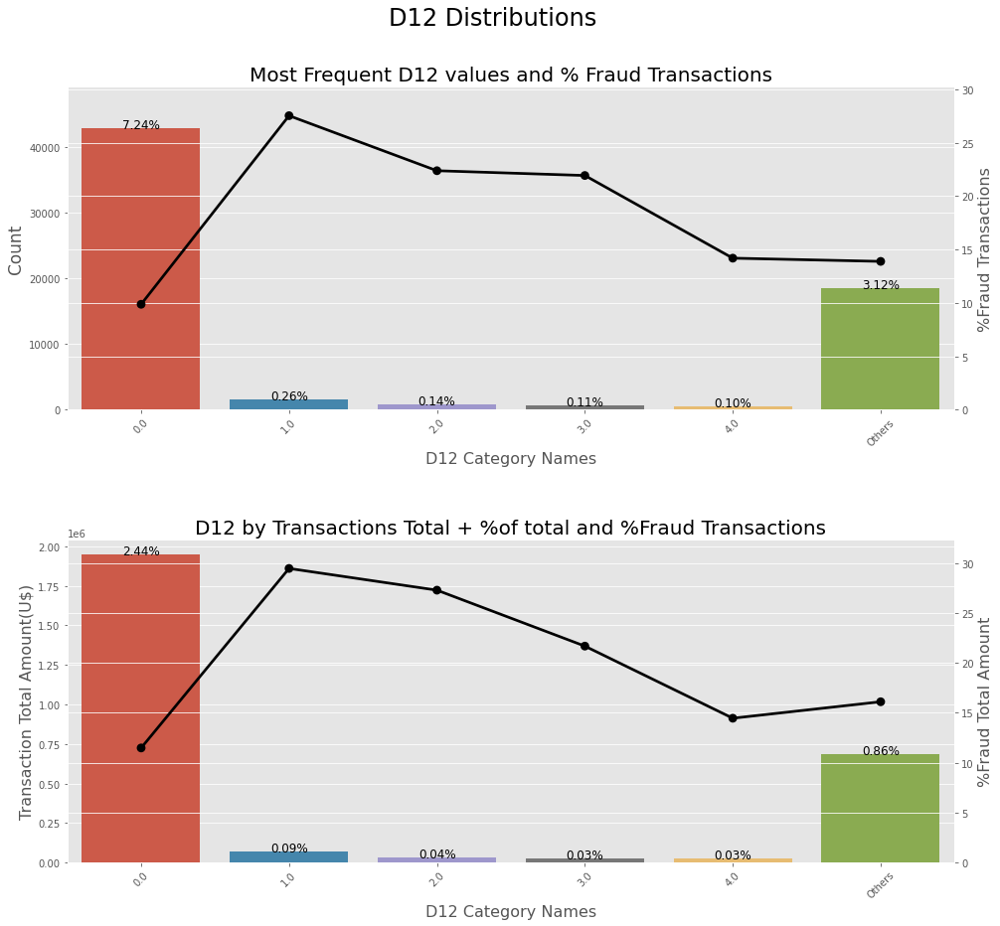

In [89]:
train.loc[train.D12.isin(train.D12.value_counts()[train.D12.value_counts() <= 500]
                             .index), 'D12'] = 'Others'
# D12 Distribution Plot
ploting_cnt_amt(train, 'D12')

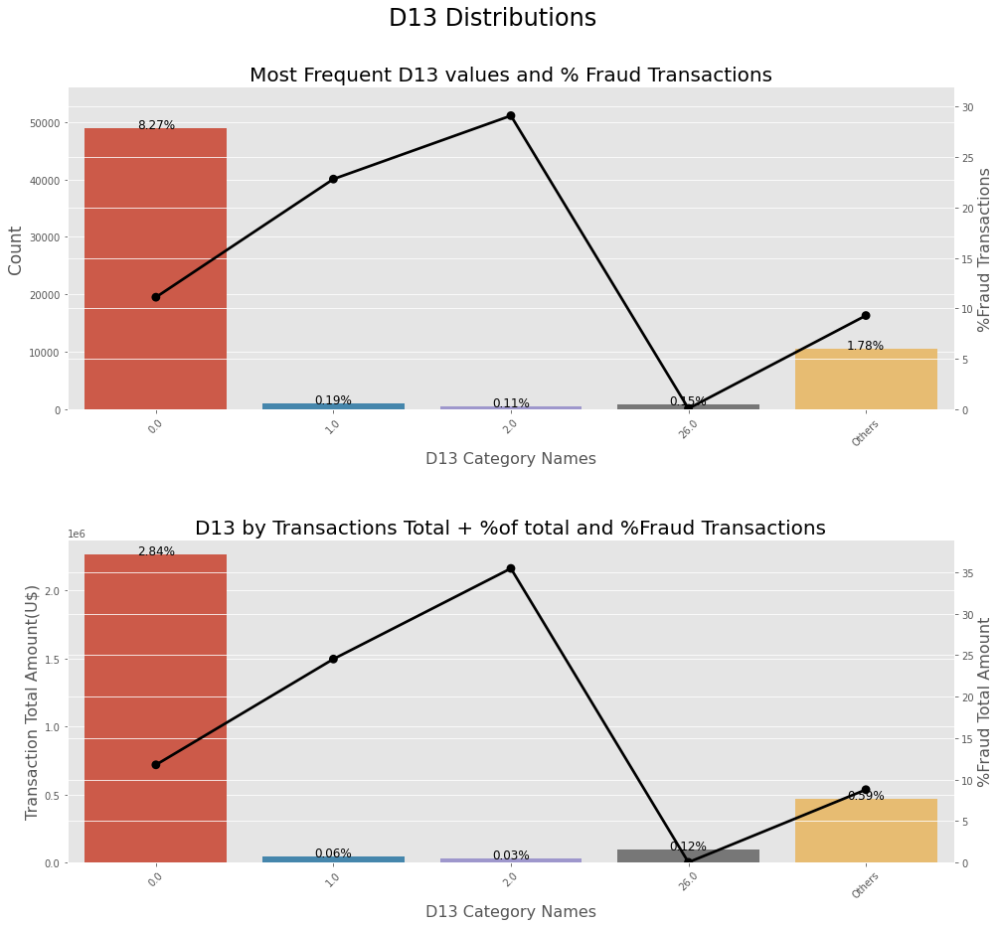

In [90]:
train.loc[train.D13.isin(train.D13.value_counts()[train.D13.value_counts() <= 500]
                             .index), 'D13'] = 'Others'
# D13 Distribution Plot
ploting_cnt_amt(train, 'D13')

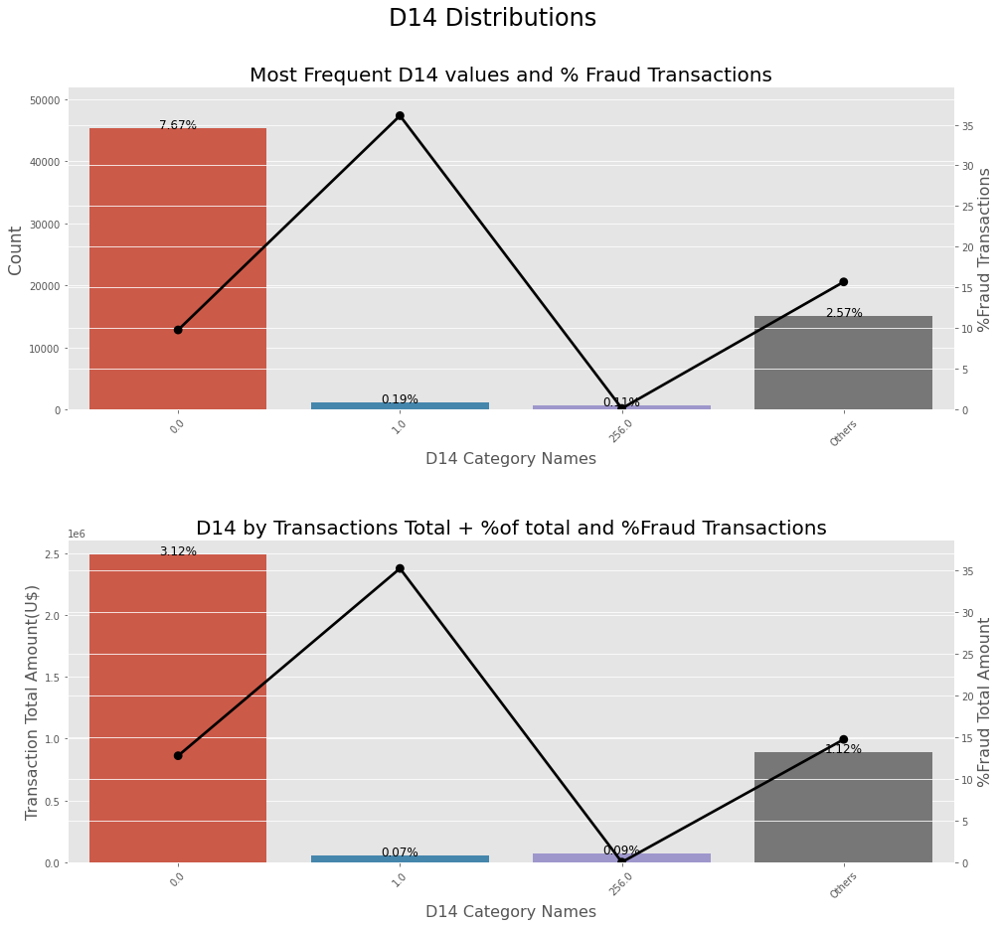

In [91]:
train.loc[train.D14.isin(train.D14.value_counts()[train.D14.value_counts() <= 500]
                             .index), 'D14'] = 'Others'
# D14 Distribution Plot
ploting_cnt_amt(train, 'D14')

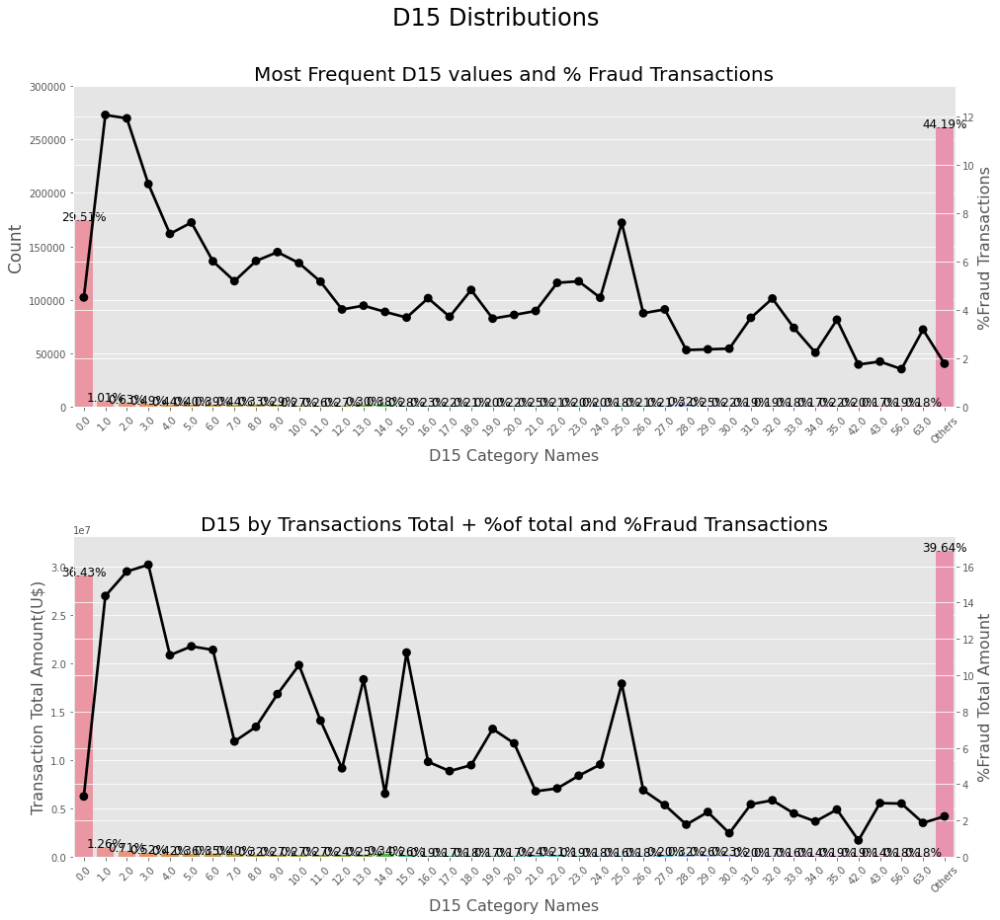

In [92]:
train.loc[train.D15.isin(train.D15.value_counts()[train.D15.value_counts() <= 1000]
                             .index), 'D15'] = 'Others'
# D15 Distribution Plot
ploting_cnt_amt(train, 'D15')

#### V1 - V339

In [93]:
v_cols = [c for c in train if c[0] == 'V']
train[v_cols].head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [94]:
train[v_cols].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,311253.000000000000000,...,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000,82351.000000000000000
mean,0.999945382052542,1.045204383572206,1.078074749480326,0.846456098415116,0.876990743864316,1.045686306638008,1.072869980369667,1.027704150642725,1.041528916990358,0.463915207242982,...,0.775874002744350,721.741882916404506,1375.783644036513351,1014.622781509143010,9.807015093927214,59.164549671486512,28.530902964203371,55.352421950538890,151.160542070513145,100.700881592801892
std,0.007390205667367,0.240132888213394,0.320889824940622,0.440053286680472,0.475902496321142,0.239384928778582,0.304778806855747,0.186069364493091,0.226338728710295,0.521522084010931,...,4.727971393408287,6217.223583406429498,11169.275702404978801,7955.735481948921006,243.861390570583268,387.629479999626142,274.576919719621969,668.486832619135953,1095.034386884882679,814.946721848684888
min,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,...,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
25%,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,0.000000000000000,...,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
50%,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,0.000000000000000,...,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
75%,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,1.000000000000000,...,0.000000000000000,0.000000000000000,25.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
max,1.000000000000000,8.000000000000000,9.000000000000000,6.000000000000000,6.000000000000000,9.000000000000000,9.000000000000000,8.000000000000000,8.000000000000000,4.000000000000000,...,55.000000000000000,160000.000000000000000,160000.000000000000000,160000.000000000000000,55125.000000000000000,55125.000000000000000,55125.000000000000000,104060.000000000000000,104060.000000000000000,104060.000000000000000


In [95]:
train['v_mean'] = train[v_cols].mean(axis = 1)

In [96]:
# fazendo o mesmo para a base de teste
test['v_mean'] = test[v_cols].mean(axis = 1)

#### Time Delta Feature

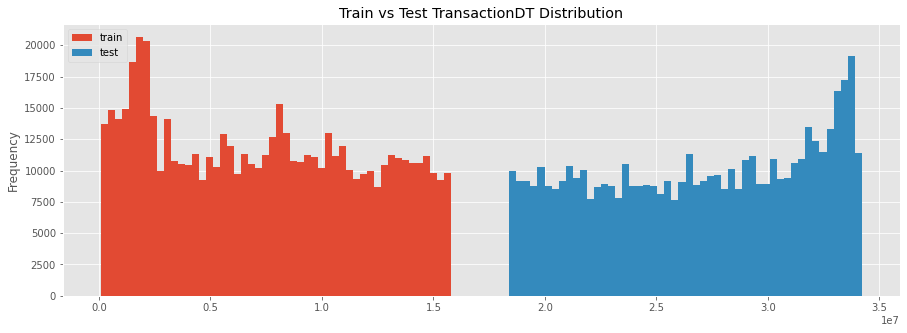

In [97]:
train['TransactionDT'].plot(kind = 'hist', 
                            figsize = (15, 5), 
                            label = 'train', 
                            bins = 50, 
                            title = 'Train vs Test TransactionDT Distribution')

test['TransactionDT'].plot(kind = 'hist', 
                           label = 'test', 
                           bins = 50)
plt.legend()
plt.show()

Checando se as fraudes apresentam horários específicos de maior taxa

In [98]:
# Converting to Total Days, Weekdays and Hours
# We will use the first date as 2017-12-01 and use the delta time to compute datetime features

import datetime

START_DATE = '2017-12-01'
start_date = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
train["Date"] = train['TransactionDT'].apply(lambda x: (start_date + datetime.timedelta
                                                             (seconds = x)))

train['_Weekdays'] = train['Date'].dt.dayofweek
train['_Hours'] = train['Date'].dt.hour
train['_Days'] = train['Date'].dt.day

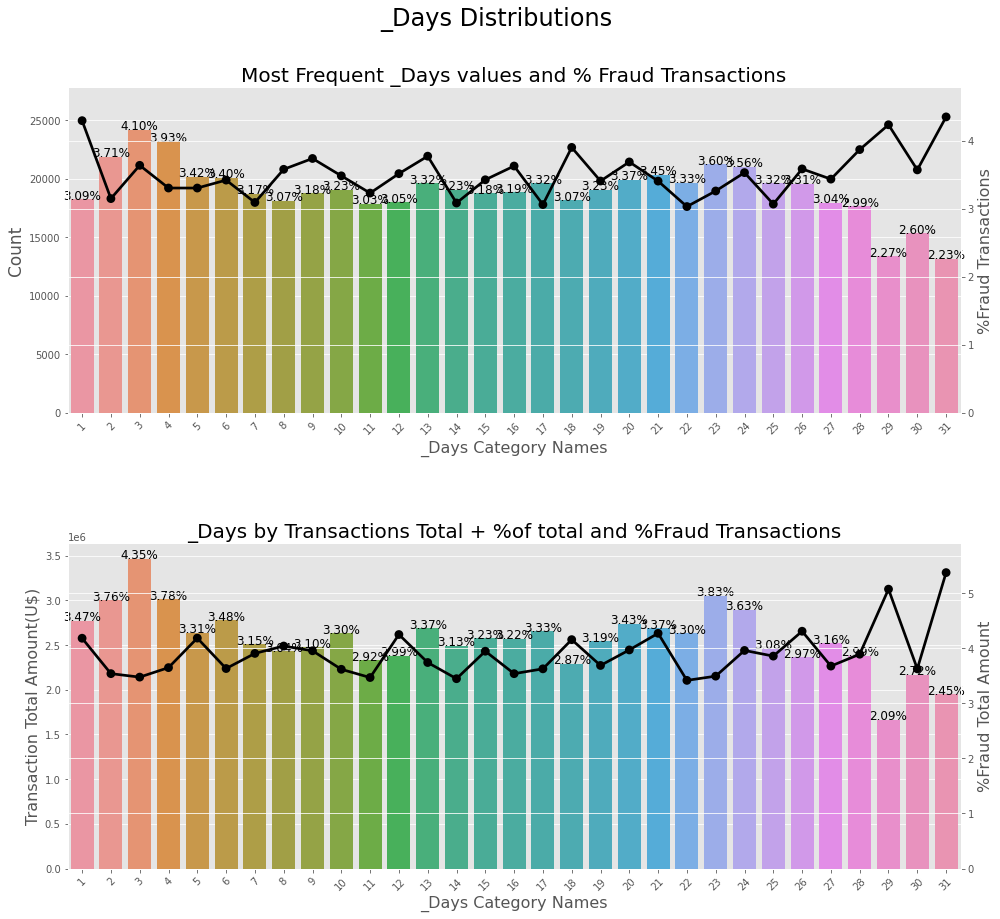

In [99]:
# Top Days With Highest Total Transaction Amount¶
ploting_cnt_amt(train, '_Days')

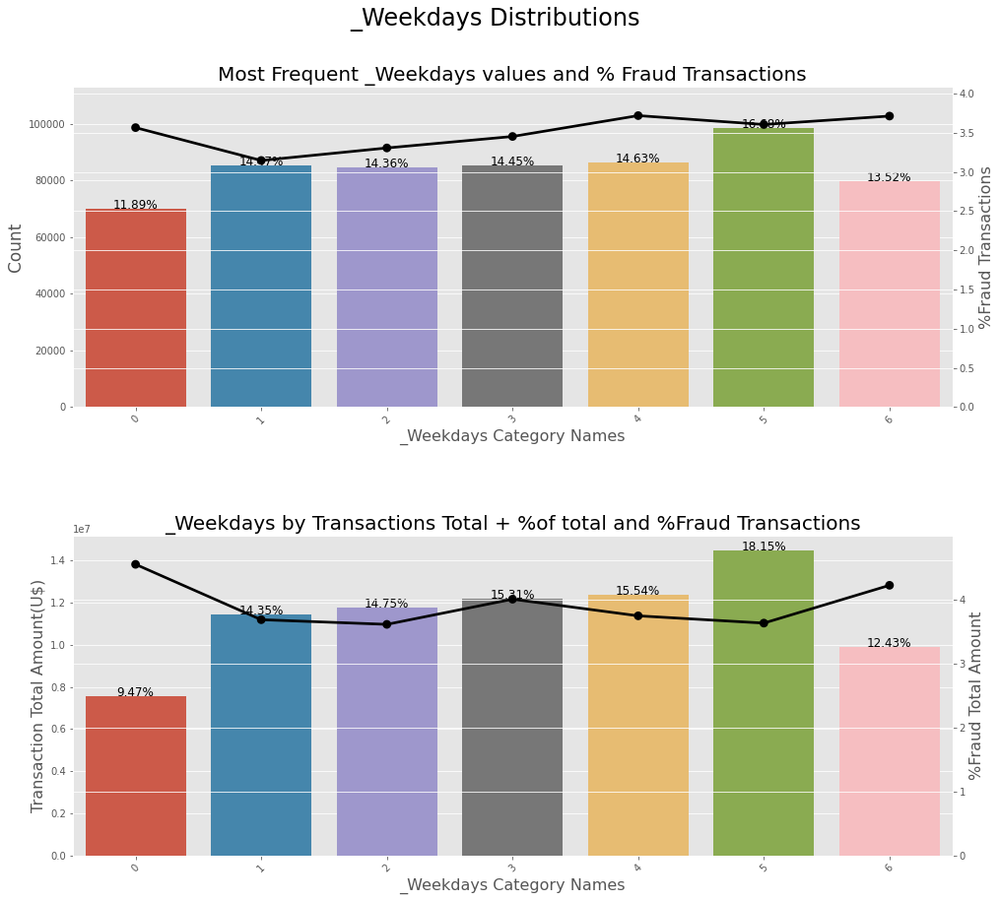

In [100]:
# Ploting WeekDays Distributions
ploting_cnt_amt(train, '_Weekdays')

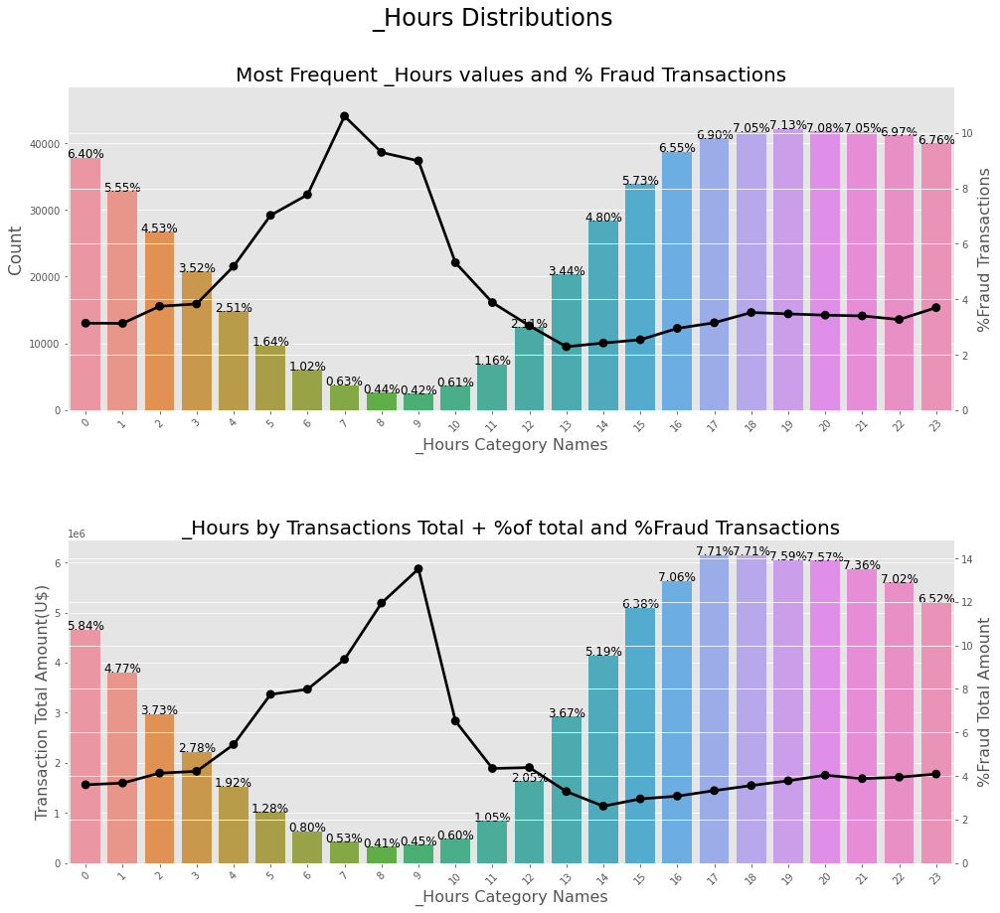

In [101]:
# Ploting Hours Distributions
ploting_cnt_amt(train, '_Hours')

In [102]:
# Top Days With Highest Total Transaction Amount¶
#pd.options.display.max_rows = 999
#pd.set_option('display.max_rows', None)
#train['Date']

In [103]:
# fazendo o mesmo para base teste

START_DATE = '2017-12-01'
start_date = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
test["Date"] = test['TransactionDT'].apply(lambda x: (start_date + datetime.timedelta
                                                             (seconds = x)))

test['_Weekdays'] = test['Date'].dt.dayofweek
test['_Hours'] = test['Date'].dt.hour
test['_Days'] = test['Date'].dt.day

In [104]:
#pd.set_option('display.max_rows', None)
#test['Date']

In [105]:
pd.reset_option('display.max_rows')

# Feature Engineering

## Equalizando nomes de colunas entre bases de treino e teste

In [106]:
# checando as diferenças entre nomes de colunas da base treino e teste
# para equalizar mudanças
pd.set_option('display.max_rows', 500)
train.columns.difference(test.columns)

Index(['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08',
       'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16',
       'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24',
       'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
       'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'isFraud'],
      dtype='object')

In [107]:
# renomear colunas de teste e de treino
test.columns = test.columns.str.replace('-', '_')
#test.rename(columns = {'id-07':'id_07', 'id-08': 'id_08', 'id-21': 'id_21', 'id-22': 'id_22', 'id-23': 'id_23', 'id-24': 'id_24', 'id-25': 'id_25', 
#                       'id-26':'id_26', 'id-27': 'id_27', 'id-18': 'id_18'}, inplace = True)

In [108]:
# checando resultado final das diferenças
train.columns.difference(test.columns)

Index(['isFraud'], dtype='object')

## Tratando Colunas com Valores Faltantes

In [109]:
# colunas com mais de 75% dos valores como NaN
many_null_cols_train = [col for col in train.columns if train[col].isnull().sum() / train.shape[0] > 0.75]

# colunas com mais de 90% de valores únicos
big_top_value_cols_train = [col for col in train.columns if train[col].value_counts(dropna=False, normalize=True).values[0] > 0.75]

# colunas com valor único
one_value_cols_train = [col for col in train.columns if train[col].nunique() <= 1]

many_null_cols_test = [col for col in test.columns if test[col].isnull().sum() / test.shape[0] > 0.75]
big_top_value_cols_test = [col for col in test.columns if test[col].value_counts(dropna=False, normalize=True).values[0] > 0.75]
one_value_cols_test = [col for col in test.columns if test[col].nunique() <= 1]

In [110]:
# concatenar todas as colunas desnecessárias
cols_to_drop = list(set(many_null_cols_train + big_top_value_cols_train + one_value_cols_train + many_null_cols_test + big_top_value_cols_test + one_value_cols_test))
cols_to_drop.remove('isFraud')
len(cols_to_drop)

346

In [111]:
train = train.drop(cols_to_drop, axis=1)

In [112]:
test = test.drop(cols_to_drop, axis=1)

In [113]:
# checando diferença entre colunas das bases treino e teste
train.columns.difference(test.columns)

Index(['isFraud'], dtype='object')

## Tratando Linhas com Valores Faltantes 

In [114]:
# Delete rows containing either 75% or more than 75% NaN Values
perc = 75.0 
min_count =  int(((100 - perc) / 100) * train.shape[1] + 1)
train = train.dropna(axis = 0, thresh = min_count)

In [115]:
# Delete rows containing either 75% or more than 75% NaN Values
perc = 75.0 
min_count =  int(((100 - perc) / 100) * test.shape[1] + 1)
test = test.dropna(axis = 0, thresh = min_count)

In [116]:
train.shape

(590540, 93)

In [117]:
test.shape

(506691, 92)

## Substituindo NaNs remanescentes por 0 para pacotes de balanceamento e redução de dimensionalidade

In [118]:
# replace NaN by 0 to run PCA and t-SNE
train.replace(np.nan, 0, inplace=True)

## Encoding de variáveis categóricas (para pacotes de redução de dimensionalidade)

### Encoding categorical features

#### Using LabelEncoder

In [119]:
# finding out the featues identified as "object" to encode them
object_columns = train.select_dtypes(include = "object").columns
print(object_columns)

Index(['ProductCD', 'card4', 'card5', 'addr1', 'dist1', 'P_emaildomain', 'C1',
       'C2', 'C5', 'C6', 'C9', 'C11', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4',
       'D5', 'D10', 'D11', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7',
       'M8', 'M9'],
      dtype='object')


In [120]:
object_columns_treated = ['ProductCD', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2',
       'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15', 'id_28', 'id_29',
       'id_31', 'D2', 'D3', 'D15', 'C5', 'D4', 'D5', 'D1', 'C9', 'C11', 'D10', 'D11', 'C14', 'C6', 'dist1', 'C13']

In [121]:
from sklearn import preprocessing
le = LabelEncoder()

In [122]:
for col in object_columns_treated:
    if col in train.columns:
        le.fit(list(train[col].astype(str).values) + list(test[col].astype(str).values))
        train[col] = le.fit_transform(list(train[col].astype(str).values))
        test[col] = le.fit_transform(list(test[col].astype(str).values))

In [123]:
checking_remaining_objects_train = resumetable(train)[['Name', 'dtypes']]
checking_remaining_objects_train[checking_remaining_objects_train['dtypes'] == 'object']

Dataset Shape: (590540, 93)


,Name,dtypes


In [124]:
checking_remaining_objects_test = resumetable(test)[['Name', 'dtypes']]
checking_remaining_objects_test[checking_remaining_objects_test['dtypes'] == 'object']

Dataset Shape: (506691, 92)


,Name,dtypes


In [125]:
# You could use df._get_numeric_data() to get numeric columns and then find out categorical columns
cols = train.columns
num_cols = train._get_numeric_data().columns
cat_cols = list(set(cols) - set(num_cols))
cat_cols

['Date']

In [126]:
cols = test.columns
num_cols = test._get_numeric_data().columns
cat_cols = list(set(cols) - set(num_cols))
cat_cols

['Date']

In [127]:
# checking for columns difference between train and test
train.columns.difference(test.columns)

Index(['isFraud'], dtype='object')

## Separando a variável target da base de treino

In [128]:
# fazer cópia dos datasets antes de retirar as colunas para balanceamento e redução de dimensionalidade
train_0 = train.copy()
test_0 = test.copy()

# remover TransactionID e datetime para balanceamento e redução de dimensionalidade
train = train.drop(['TransactionID', 'TransactionDT', 'Date'], axis = 1)
test = test.drop(['TransactionID', 'TransactionDT', 'Date'], axis = 1)

In [129]:
# checking for columns difference between train and test
train.columns.difference(test.columns)

Index(['isFraud'], dtype='object')

In [130]:
X_train = train.drop('isFraud',axis = 1)
y_train = train['isFraud'].astype('uint8')

In [131]:
y_train.value_counts()

0    569877
1     20663
Name: isFraud, dtype: int64

# Redução de Dimensionalidade

## Filtragem

Advantages of Filter methods
* Filter methods are model agnostic
* Rely entirely on features in the data set
* Computationally very fast
* Based on different statistical methods

The disadvantage of Filter methods
* The filter method looks at individual features for identifying it’s relative importance. A feature may not be useful on its own but maybe an important influencer when combined with other features. Filter methods may miss such features.

#### Removing quasi-constant features

Quasi-constant features, as the name suggests, are the features that are almost constant. Such features are not very useful for making predictions. There is no rule as to what should be the threshold for the variance of quasi-constant features.

However, as a rule of thumb, remove those quasi-constant features that have more than 99% similar values for the output observations.

Thus, instead of passing 0 as the value for the threshold parameter, we will pass 0.01, which means that if the variance of the values in a column is less than 0.01, remove that column. In other words, remove the feature column where approximately 99% of the values are similar.

In [132]:
qcons_filter = VarianceThreshold(threshold=0.01)

#Fit and transforming on train data
data_qcons = qcons_filter.fit_transform(X_train)
print(data_qcons.shape)

#Extracting all Quasi constant columns using get support function of our filter
qcons_columns = [column for column in X_train.columns
                    if column not in X_train.columns[qcons_filter.get_support()]]

#No. of Quasi constant columns
print(len(qcons_columns))

#Quasi Constant columns names:
for column in qcons_columns:
    print(column)

(590540, 89)
0


## Seleção de Features com Teste do Qui-Quadrado

This is a form of non-parametric test (a test wherein median is an important parameter) in which feature selection is done with the help of hypothesis testing and p-value. The feature selection is only suited to categorical features or features having discrete data contained within it. The continuous features are not taken into account and therefore should not be used while performing this test. The formula for this type of test is given as:

Summation (Observed Value – Expected Value) / Expected Value

If the p-value is less than 0.05 then we reject the null hypothesis and go with the alternate hypothesis in this type of test.

In [133]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [134]:
# 20 features
model_20_chi2 = SelectKBest(chi2, k = 20)
new_20_chi2 = model_20_chi2.fit(X_train, y_train)
X_20_chi2 = new_20_chi2.transform(X_train)
# getting the feature names and converting them into a dataframe
cols = new_20_chi2.get_support(indices = True)
features_df_new_20_chi2 = X_train.iloc[:, cols]
features_df_new_20_chi2

,TransactionAmt,card1,dist1,C2,C5,D1,D2,D3,D5,D10,D11,D15,V39,V40,V52,V127,V307,V308,V310,v_mean
0,68.500000000000000,13926,12,1,0,41,0,6,0,6,4,1,0.0,0.0,0.0,117.000000000000000,117.000000000000000,0.00000000000000,0.000000000000000,3.271604938271605
1,29.000000000000000,2755,0,1,0,1,0,0,0,1,0,1,0.0,0.0,0.0,0.000000000000000,0.000000000000000,0.00000000000000,0.000000000000000,0.313609467455621
2,59.000000000000000,4663,41,1,0,1,0,0,0,1,17,41,0.0,0.0,0.0,0.000000000000000,0.000000000000000,0.00000000000000,0.000000000000000,0.388888888888889
3,50.000000000000000,18132,0,18,0,17,17,1,1,49,0,41,0.0,0.0,0.0,1758.000000000000000,1758.000000000000000,925.00000000000000,354.000000000000000,66.573964497041416
4,50.000000000000000,4497,0,1,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.000000000000000,0.000000000000000,0.00000000000000,0.000000000000000,799.648110650510148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,49.000000000000000,6550,41,1,1,77,70,25,0,40,17,35,0.0,0.0,0.0,47.950000762939453,47.950000762939453,0.00000000000000,47.950000762939453,2.491666699633186
590536,39.500000000000000,10444,0,1,0,1,0,0,0,1,1,1,0.0,0.0,0.0,0.000000000000000,0.000000000000000,0.00000000000000,0.000000000000000,0.388888888888889
590537,30.949999999999999,12037,0,1,1,1,0,0,0,1,1,1,0.0,0.0,0.0,0.000000000000000,0.000000000000000,0.00000000000000,0.000000000000000,0.444444444444444
590538,117.000000000000000,7826,24,1,0,70,63,1,1,16,17,16,0.0,0.0,1.0,1035.500000000000000,2903.500000000000000,117.00000000000000,669.500000000000000,56.897222222222226


In [135]:
# 50 features
model_50_chi2 = SelectKBest(chi2, k = 50)
new_50_chi2 = model_50_chi2.fit(X_train, y_train)
X_50_chi2 = new_50_chi2.transform(X_train)
# getting the feature names and converting them into a dataframe
cols = new_50_chi2.get_support(indices = True)
features_df_new_50_chi2 = X_train.iloc[:, cols]
features_df_new_50_chi2

,TransactionAmt,ProductCD,card1,addr1,dist1,P_emaildomain,C1,C2,C5,C6,...,V93,V96,V127,V130,V282,V283,V307,V308,V310,v_mean
0,68.500000000000000,4,13926,18,12,2,1,1,0,1,...,0.0,1.0,117.000000000000000,0.000000000000000,1.0,1.0,117.000000000000000,0.00000000000000,0.000000000000000,3.271604938271605
1,29.000000000000000,4,2755,19,0,0,1,1,0,1,...,0.0,0.0,0.000000000000000,0.000000000000000,1.0,1.0,0.000000000000000,0.00000000000000,0.000000000000000,0.313609467455621
2,59.000000000000000,4,4663,21,41,1,1,1,0,1,...,0.0,0.0,0.000000000000000,0.000000000000000,1.0,1.0,0.000000000000000,0.00000000000000,0.000000000000000,0.388888888888889
3,50.000000000000000,4,18132,27,0,4,12,18,0,11,...,0.0,48.0,1758.000000000000000,354.000000000000000,0.0,0.0,1758.000000000000000,925.00000000000000,354.000000000000000,66.573964497041416
4,50.000000000000000,1,4497,31,0,0,1,1,0,1,...,0.0,0.0,0.000000000000000,0.000000000000000,1.0,1.0,0.000000000000000,0.00000000000000,0.000000000000000,799.648110650510148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,49.000000000000000,4,6550,15,41,2,12,1,1,0,...,0.0,1.0,47.950000762939453,47.950000762939453,1.0,1.0,47.950000762939453,0.00000000000000,47.950000762939453,2.491666699633186
590536,39.500000000000000,4,10444,7,0,0,1,1,0,1,...,0.0,0.0,0.000000000000000,0.000000000000000,1.0,1.0,0.000000000000000,0.00000000000000,0.000000000000000,0.388888888888889
590537,30.949999999999999,4,12037,11,0,0,1,1,1,1,...,0.0,0.0,0.000000000000000,0.000000000000000,1.0,1.0,0.000000000000000,0.00000000000000,0.000000000000000,0.444444444444444
590538,117.000000000000000,4,7826,23,24,6,1,1,0,10,...,0.0,4.0,1035.500000000000000,117.000000000000000,2.0,7.0,2903.500000000000000,117.00000000000000,669.500000000000000,56.897222222222226


## Seleção de Features com Teste ANOVA

A feature selection technique is most suited to filter features wherein categorical and continuous data is involved. It is a type of parametric test which means it assumes a normal distribution of data forming a bell shape curve. There are many types of Anova test out there and a user can try out these as per their need. The assumption here is made as per the hypothesis testing where the null hypothesis states that there is no difference in the means and alternate says that there is a difference. If the p-value is less than 0.05 then the null hypothesis is rejected and the features are selected or else dropped if the null hypothesis becomes true. The implementation of this feature selection technique is given below with the help of Scikit Learn library

In [136]:
from sklearn.feature_selection import f_classif

In [137]:
# 20 features
model_20_anova = SelectKBest(score_func = f_classif, k = 20)
new_20_anova = model_20_anova.fit(X_train, y_train)
X_20_anova = new_20_anova.transform(X_train)
# getting the feature names and converting them into a dataframe
cols = new_20_anova.get_support(indices = True)
features_df_new_20_anova = X_train.iloc[:, cols]
features_df_new_20_anova

,ProductCD,V29,V39,V40,V42,V43,V50,V51,V52,V69,V70,V80,V81,V84,V85,V90,V92,V93,V282,V283
0,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
3,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
590536,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
590537,4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
590538,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,7.0


In [138]:
# 50 features
model_50_anova = SelectKBest(score_func = f_classif, k = 50)
new_50_anova = model_50_anova.fit(X_train, y_train)
X_50_anova = new_50_anova.transform(X_train)
# getting the feature names and converting them into a dataframe
cols = new_50_anova.get_support(indices = True)
features_df_new_50_anova = X_train.iloc[:, cols]
features_df_new_50_anova

,ProductCD,addr1,C1,C2,C5,C11,C13,D1,D2,D3,...,V80,V81,V84,V85,V90,V91,V92,V93,V282,V283
0,4,18,1,1,0,7,1,41,0,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1,4,19,1,1,0,1,1,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,4,21,1,1,0,1,1,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
3,4,27,12,18,0,1,10,17,17,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,31,1,1,0,1,1,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,4,15,12,1,1,1,3,77,70,25,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
590536,4,7,1,1,0,1,1,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
590537,4,11,1,1,1,1,1,1,0,0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0
590538,4,23,1,1,0,1,5,70,63,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,7.0


## Seleção de Features com Análise de Correlação

In [139]:
train = pd.concat([X_train, y_train], axis = 1)

In [140]:
import time

In [141]:
pd.set_option('display.max_rows', 500)

In [142]:
%%time
topcorr = train.corr(method = 'spearman')['isFraud'].sort_values()[:-1]
topcorr_tail_20 = topcorr.tail(20)
topcorr_tail_20

CPU times: user 41.3 s, sys: 89.2 ms, total: 41.4 s
Wall time: 41.4 s


V308      0.073418497214432
V280      0.073899373882164
C11       0.076232068632520
C2        0.077726897136262
V282      0.096685148215255
V283      0.101298738644988
v_mean    0.108435865162259
V84       0.145651125618145
V85       0.146612027620918
V92       0.147128669045498
V50       0.147657943300074
V80       0.147957186503408
V93       0.147977905689527
V42       0.148898554212677
V81       0.149101217920727
V43       0.150331458618882
V39       0.152581492651280
V40       0.154035063211205
V51       0.158864399806702
V52       0.159404328634565
Name: isFraud, dtype: float64

In [143]:
topcorr_tail_50 = topcorr.tail(50)
topcorr_tail_50

V76              -0.058698538698348
V75              -0.058679793995118
M9               -0.058395624752527
V36              -0.057838047148325
D1               -0.055004972238274
P_emaildomain    -0.050066880445711
M4               -0.048215603719153
card5            -0.035971632391822
V99              -0.029565285646689
D4               -0.027838678345451
V130             -0.025135920220868
D5               -0.020741052837495
V285             -0.018573815673745
V310             -0.013600548965128
card1            -0.013430651942333
_Hours           -0.006867436602465
M6               -0.006761707437722
card4            -0.003011173133824
TransactionAmt   -0.001575825874342
card2             0.001637185053190
_Days             0.002432078861546
_Weekdays         0.007325473804775
M8                0.009358346446780
M5                0.020749670051715
V96               0.021775280095490
V127              0.022260304434084
V307              0.028988518927377
C6                0.04763799

# Balanceamento de Classes

## Usando sklearn-resample

### Informações Gerais

https://www.kaggle.com/code/arthursilveirasc/resampling-strategies-for-imbalanced-datasets/edit

A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).

![](https://raw.githubusercontent.com/rafjaa/machine_learning_fecib/master/src/static/img/resampling.png)

Despite the advantage of balancing classes, these techniques also have their weaknesses (there is no free lunch). The simplest implementation of over-sampling is to duplicate random records from the minority class, which can cause overfitting. In under-sampling, the simplest technique involves removing random records from the majority class, which can cause loss of information.

### Undersample da classe majoritária com Resample

In [144]:
from sklearn.utils import resample

In [145]:
not_fraud = train[train.isFraud == 0]
fraud = train[train.isFraud == 1]


not_fraud_undersampled = resample(not_fraud,
                                  replace = False, # sample without replacement
                                  n_samples = len(fraud), # match minority n
                                  random_state = 27)

# combine minority and undersampled majority
undersample_with_resample = pd.concat([not_fraud_undersampled, fraud])

# checking counts
undersample_with_resample.isFraud.value_counts()


X_undersample_with_resample = undersample_with_resample.drop('isFraud',axis = 1)
y_undersample_with_resample = undersample_with_resample['isFraud'].astype('uint8')

# utilizando seleção de features
cols_20_chi2 = features_df_new_20_chi2.columns
cols_50_chi2 = features_df_new_50_chi2.columns
cols_20_anova = features_df_new_20_anova.columns
cols_50_anova = features_df_new_50_anova.columns
cols_topcorr_20 = topcorr_tail_20.index
cols_topcorr_50 = topcorr_tail_50.index

### Oversample da classe minoritária com Resample

In [146]:
# oversample
fraud_upsampled = resample(fraud, 
                           replace = True, # sample with replacement
                           n_samples = len(not_fraud), # match number in majority class
                           random_state = 27)

# combine majority and upsampled minority
oversample_with_resample = pd.concat([not_fraud, fraud_upsampled])

# check new class counts
oversample_with_resample.isFraud.value_counts()

X_oversample_with_resample = oversample_with_resample.drop('isFraud',axis = 1)
y_oversample_with_resample = oversample_with_resample['isFraud'].astype('uint8')

## Usando o módulo imbalanced-learn

### Random under-sampling com imbalanced-learn

In [147]:
import imblearn
from imblearn.under_sampling import RandomUnderSampler

In [148]:
rus = RandomUnderSampler(random_state=0)

In [149]:
X_undersample_with_rus, y_undersample_with_rus = rus.fit_resample(X_train, y_train)

undersample_with_rus = pd.concat([X_undersample_with_rus, y_undersample_with_rus], axis = 1, ignore_index=False)

### Random over-sampling com imbalanced-learn

In [150]:
from imblearn.over_sampling import RandomOverSampler

In [151]:
ros = RandomOverSampler(random_state=0)

In [152]:
X_oversample_with_ros, y_oversample_with_ros = ros.fit_resample(X_train, y_train)

oversample_with_ros = pd.concat([X_oversample_with_ros, y_oversample_with_ros], axis = 1, ignore_index=False)

# Seleção do Modelo de Classificação

## Inicializando os classificadores

In [153]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import cross_validate

In [154]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import lightgbm as lgbm
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [155]:
clf_et = ExtraTreesClassifier(n_estimators=100, random_state=0)
clf_rf = RandomForestClassifier(max_depth=2, random_state=0)
clf_dt = DecisionTreeClassifier(random_state=0)
clf_cb = CatBoostClassifier(iterations=5, learning_rate=0.1) # loss_function='CrossEntropy')
clf_xgb = XGBClassifier()
clf_lgbm = lgbm.LGBMClassifier()
clf_gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
clf_ada = AdaBoostClassifier(n_estimators=100, random_state=0)
clf_lr = LogisticRegression(random_state=0)
clf_knn = KNeighborsClassifier(n_neighbors=3)
clf_svm = svm.SVC()
clf_gnb = GaussianNB()

## Validação Cruzada para Undersample com Resample

In [156]:
X_undersample_with_resample_train, X_undersample_with_resample_test, \
y_undersample_with_resample_train, y_undersample_with_resample_test = train_test_split(X_undersample_with_resample, y_undersample_with_resample, test_size = .2, random_state = 1)

### 20 Chi-Square

In [157]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

ExtraTreesClassifier(random_state=0)
Avg accuracy : 0.7571954115198023
Avg f1_score : 0.7497324890527917
Avg recall : 0.7344266205498242
Avg precision : 0.766011432045165
CPU times: user 25.6 s, sys: 6.19 ms, total: 25.6 s
Wall time: 25.6 s


In [158]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

RandomForestClassifier(max_depth=2, random_state=0)
Avg accuracy : 0.7287667141949519
Avg f1_score : 0.7168120697017095
Avg recall : 0.6931832548154333
Avg precision : 0.7424972368842467
CPU times: user 10.2 s, sys: 7.51 ms, total: 10.2 s
Wall time: 10.2 s


In [159]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

DecisionTreeClassifier(random_state=0)
Avg accuracy : 0.7011807899845117
Avg f1_score : 0.7013966132722494
Avg recall : 0.7090357206750552
Avg precision : 0.6943260890021196
CPU times: user 2.16 s, sys: 0 ns, total: 2.16 s
Wall time: 2.16 s


In [160]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

0:	learn: 0.6577124	total: 50.6ms	remaining: 202ms
1:	learn: 0.6308775	total: 54.5ms	remaining: 81.7ms
2:	learn: 0.6082640	total: 58.5ms	remaining: 39ms
3:	learn: 0.5929536	total: 62.3ms	remaining: 15.6ms
4:	learn: 0.5782705	total: 66.1ms	remaining: 0us
0:	learn: 0.6627153	total: 2.63ms	remaining: 10.5ms
1:	learn: 0.6383940	total: 4.92ms	remaining: 7.38ms
2:	learn: 0.6172264	total: 6.98ms	remaining: 4.65ms
3:	learn: 0.5981784	total: 8.94ms	remaining: 2.23ms
4:	learn: 0.5835593	total: 11ms	remaining: 0us
0:	learn: 0.6597466	total: 2.11ms	remaining: 8.44ms
1:	learn: 0.6373674	total: 4.35ms	remaining: 6.52ms
2:	learn: 0.6120887	total: 6.42ms	remaining: 4.28ms
3:	learn: 0.5932935	total: 8.46ms	remaining: 2.11ms
4:	learn: 0.5787067	total: 10.4ms	remaining: 0us
0:	learn: 0.6606004	total: 2.14ms	remaining: 8.57ms
1:	learn: 0.6347032	total: 4.42ms	remaining: 6.63ms
2:	learn: 0.6125083	total: 6.53ms	remaining: 4.35ms
3:	learn: 0.5971398	total: 8.64ms	remaining: 2.16ms
4:	learn: 0.5821139	total:

0:	learn: 0.6606004	total: 1.9ms	remaining: 7.62ms
1:	learn: 0.6347032	total: 3.81ms	remaining: 5.72ms
2:	learn: 0.6125083	total: 5.58ms	remaining: 3.72ms
3:	learn: 0.5971398	total: 7.3ms	remaining: 1.82ms
4:	learn: 0.5821139	total: 9.01ms	remaining: 0us
0:	learn: 0.6602078	total: 6.1ms	remaining: 24.4ms
1:	learn: 0.6380906	total: 8ms	remaining: 12ms
2:	learn: 0.6160066	total: 9.75ms	remaining: 6.5ms
3:	learn: 0.5972244	total: 11.4ms	remaining: 2.86ms
4:	learn: 0.5820284	total: 13.2ms	remaining: 0us
0:	learn: 0.6609565	total: 1.95ms	remaining: 7.8ms
1:	learn: 0.6369174	total: 3.77ms	remaining: 5.66ms
2:	learn: 0.6119224	total: 5.53ms	remaining: 3.68ms
3:	learn: 0.5956267	total: 7.24ms	remaining: 1.81ms
4:	learn: 0.5812998	total: 8.95ms	remaining: 0us
0:	learn: 0.6602489	total: 1.93ms	remaining: 7.74ms
1:	learn: 0.6350369	total: 3.75ms	remaining: 5.62ms
2:	learn: 0.6147934	total: 5.44ms	remaining: 3.62ms
3:	learn: 0.5966912	total: 7.1ms	remaining: 1.77ms
4:	learn: 0.5815983	total: 8.76m

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_20_chi2], y_undersample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

### 50 Chi-Square

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_50_chi2], y_undersample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_chi2], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

### 20 Anova

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_20_anova], y_undersample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_20_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

### 50 Anova

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_50_anova], y_undersample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_50_anova], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

### 20 Top Corr

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_topcorr_20], y_undersample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_20], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

### 50 Top Corr

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train[cols_topcorr_50], y_undersample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test[cols_topcorr_50], y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

### Todas as colunas

In [ ]:
%%time

clf_et.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_et, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_rf, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_dt, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_cb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_xgb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gbc, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_ada, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lr, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_knn, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_svm, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_resample_train, y_undersample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gnb, X_undersample_with_resample_test, y_undersample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

## Validação Cruzada para Undersample com RUS

In [ ]:
X_undersample_with_rus_train, X_undersample_with_rus_test, \
y_undersample_with_rus_train, y_undersample_with_rus_test = \
train_test_split(X_undersample_with_rus, y_undersample_with_rus, test_size = .2, random_state = 1)

### 20 Chi-Square

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_20_chi2], y_undersample_with_rus_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

### 50 Chi-Square

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_50_chi2], y_undersample_with_rus_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_chi2], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

### 20 Anova

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_20_anova], y_undersample_with_rus_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_20_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

### 50 Anova

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_50_anova], y_undersample_with_rus_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_50_anova], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

### 20 Top Corr

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_topcorr_20], y_undersample_with_rus_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_20], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

### 50 Top Corr

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train[cols_topcorr_50], y_undersample_with_rus_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test[cols_topcorr_50], y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

### Todas as colunas

In [ ]:
%%time

clf_et.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_et, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_rf, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_dt, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_cb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_xgb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lgbm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gbc, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_ada, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lr, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_knn, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_svm, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_undersample_with_rus_train, y_undersample_with_rus_train)

accuracy_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gnb, X_undersample_with_rus_test, y_undersample_with_rus_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
t1 = time.time()
print("Script took {:.2} s".format(t1 - t0))

## Validação Cruzada para Oversample com Resample

In [ ]:
X_oversample_with_resample_train, X_oversample_with_resample_test, \
y_oversample_with_resample_train, y_oversample_with_resample_test = \
train_test_split(X_oversample_with_resample, y_oversample_with_resample, test_size = .2, random_state = 1)

### 20 Chi-Square

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_20_chi2], y_oversample_with_resample_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

### 50 Chi-Square

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_50_chi2], y_oversample_with_resample_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_chi2], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

### 20 Anova

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_20_anova], y_oversample_with_resample_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_20_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

### 50 Anova

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_50_anova], y_oversample_with_resample_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_50_anova], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

### 20 Top Corr

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_topcorr_20], y_oversample_with_resample_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_20], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

### 50 Top Corr

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train[cols_topcorr_50], y_oversample_with_resample_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test[cols_topcorr_50], y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

### Todas as colunas

In [ ]:
%%time

clf_et.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_et, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_rf, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_dt, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_cb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_xgb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gbc, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_ada, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lr, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_knn, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_svm, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_resample_train, y_oversample_with_resample_train)

accuracy_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gnb, X_oversample_with_resample_test, y_oversample_with_resample_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

## Validação Cruzada para Oversample com ROS

In [ ]:
X_oversample_with_ros_train, X_oversample_with_ros_test, \
y_oversample_with_ros_train, y_oversample_with_ros_test = \
train_test_split(X_oversample_with_ros, y_oversample_with_ros, test_size = .2, random_state = 1)

### 20 Chi-Square

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_20_chi2], y_oversample_with_ros_train)

accuracy_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_chi2_K_10_list = [i for i in accuracy_20_chi2_K_10_dict.values()]
accuracy_20_chi2_K_10_avg = np.mean(accuracy_20_chi2_K_10_list[2])

f1_score_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_chi2_K_10_list = [i for i in f1_score_20_chi2_K_10_dict.values()]
f1_score_20_chi2_K_10_avg = np.mean(f1_score_20_chi2_K_10_list[2])

recall_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_chi2_K_10_list = [i for i in recall_20_chi2_K_10_dict.values()]
recall_20_chi2_K_10_avg = np.mean(recall_20_chi2_K_10_list[2])

precision_20_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_chi2_K_10_list = [i for i in precision_20_chi2_K_10_dict.values()]
precision_20_chi2_K_10_avg = np.mean(precision_20_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_chi2_K_10_avg)
print("Avg f1_score :", f1_score_20_chi2_K_10_avg)
print("Avg recall :", recall_20_chi2_K_10_avg)
print("Avg precision :", precision_20_chi2_K_10_avg)

### 50 Chi-Square

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_50_chi2], y_oversample_with_ros_train)

accuracy_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_chi2_K_10_list = [i for i in accuracy_50_chi2_K_10_dict.values()]
accuracy_50_chi2_K_10_avg = np.mean(accuracy_50_chi2_K_10_list[2])

f1_score_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_chi2_K_10_list = [i for i in f1_score_50_chi2_K_10_dict.values()]
f1_score_50_chi2_K_10_avg = np.mean(f1_score_50_chi2_K_10_list[2])

recall_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_chi2_K_10_list = [i for i in recall_50_chi2_K_10_dict.values()]
recall_50_chi2_K_10_avg = np.mean(recall_50_chi2_K_10_list[2])

precision_50_chi2_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_chi2], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_chi2_K_10_list = [i for i in precision_50_chi2_K_10_dict.values()]
precision_50_chi2_K_10_avg = np.mean(precision_50_chi2_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_chi2_K_10_avg)
print("Avg f1_score :", f1_score_50_chi2_K_10_avg)
print("Avg recall :", recall_50_chi2_K_10_avg)
print("Avg precision :", precision_50_chi2_K_10_avg)

### 20 Anova

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_20_anova], y_oversample_with_ros_train)

accuracy_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_20_anova_K_10_list = [i for i in accuracy_20_anova_K_10_dict.values()]
accuracy_20_anova_K_10_avg = np.mean(accuracy_20_anova_K_10_list[2])

f1_score_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_20_anova_K_10_list = [i for i in f1_score_20_anova_K_10_dict.values()]
f1_score_20_anova_K_10_avg = np.mean(f1_score_20_anova_K_10_list[2])

recall_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_20_anova_K_10_list = [i for i in recall_20_anova_K_10_dict.values()]
recall_20_anova_K_10_avg = np.mean(recall_20_anova_K_10_list[2])

precision_20_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_20_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_20_anova_K_10_list = [i for i in precision_20_anova_K_10_dict.values()]
precision_20_anova_K_10_avg = np.mean(precision_20_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_20_anova_K_10_avg)
print("Avg f1_score :", f1_score_20_anova_K_10_avg)
print("Avg recall :", recall_20_anova_K_10_avg)
print("Avg precision :", precision_20_anova_K_10_avg)

### 50 Anova

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_50_anova], y_oversample_with_ros_train)

accuracy_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_50_anova_K_10_list = [i for i in accuracy_50_anova_K_10_dict.values()]
accuracy_50_anova_K_10_avg = np.mean(accuracy_50_anova_K_10_list[2])

f1_score_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_50_anova_K_10_list = [i for i in f1_score_50_anova_K_10_dict.values()]
f1_score_50_anova_K_10_avg = np.mean(f1_score_50_anova_K_10_list[2])

recall_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_50_anova_K_10_list = [i for i in recall_50_anova_K_10_dict.values()]
recall_50_anova_K_10_avg = np.mean(recall_50_anova_K_10_list[2])

precision_50_anova_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_50_anova], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_50_anova_K_10_list = [i for i in precision_50_anova_K_10_dict.values()]
precision_50_anova_K_10_avg = np.mean(precision_50_anova_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_50_anova_K_10_avg)
print("Avg f1_score :", f1_score_50_anova_K_10_avg)
print("Avg recall :", recall_50_anova_K_10_avg)
print("Avg precision :", precision_50_anova_K_10_avg)

### 20 Top Corr

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_topcorr_20], y_oversample_with_ros_train)

accuracy_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_20_K_10_list = [i for i in accuracy_topcorr_20_K_10_dict.values()]
accuracy_topcorr_20_K_10_avg = np.mean(accuracy_topcorr_20_K_10_list[2])

f1_score_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_20_K_10_list = [i for i in f1_score_topcorr_20_K_10_dict.values()]
f1_score_topcorr_20_K_10_avg = np.mean(f1_score_topcorr_20_K_10_list[2])

recall_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_20_K_10_list = [i for i in recall_topcorr_20_K_10_dict.values()]
recall_topcorr_20_K_10_avg = np.mean(recall_topcorr_20_K_10_list[2])

precision_topcorr_20_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_20], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_20_K_10_list = [i for i in precision_topcorr_20_K_10_dict.values()]
precision_topcorr_20_K_10_avg = np.mean(precision_topcorr_20_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_20_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_20_K_10_avg)
print("Avg recall :", recall_topcorr_20_K_10_avg)
print("Avg precision :", precision_topcorr_20_K_10_avg)

### 50 Top Corr

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train[cols_topcorr_50], y_oversample_with_ros_train)

accuracy_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_topcorr_50_K_10_list = [i for i in accuracy_topcorr_50_K_10_dict.values()]
accuracy_topcorr_50_K_10_avg = np.mean(accuracy_topcorr_50_K_10_list[2])

f1_score_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_topcorr_50_K_10_list = [i for i in f1_score_topcorr_50_K_10_dict.values()]
f1_score_topcorr_50_K_10_avg = np.mean(f1_score_topcorr_50_K_10_list[2])

recall_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_topcorr_50_K_10_list = [i for i in recall_topcorr_50_K_10_dict.values()]
recall_topcorr_50_K_10_avg = np.mean(recall_topcorr_50_K_10_list[2])

precision_topcorr_50_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test[cols_topcorr_50], y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_topcorr_50_K_10_list = [i for i in precision_topcorr_50_K_10_dict.values()]
precision_topcorr_50_K_10_avg = np.mean(precision_topcorr_50_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_topcorr_50_K_10_avg)
print("Avg f1_score :", f1_score_topcorr_50_K_10_avg)
print("Avg recall :", recall_topcorr_50_K_10_avg)
print("Avg precision :", precision_topcorr_50_K_10_avg)

### Todas as colunas

In [ ]:
%%time

clf_et.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_et, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_et)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_rf.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_rf, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_rf)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_dt.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_dt, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_dt)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_cb.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_cb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_cb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_xgb.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_xgb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_xgb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lgbm.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lgbm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lgbm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gbc.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gbc, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gbc)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_ada.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_ada, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_ada)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_lr.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_lr, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_lr)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_knn.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_knn, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_knn)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_svm.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_svm, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_svm)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

In [ ]:
%%time

clf_gnb.fit(X_oversample_with_ros_train, y_oversample_with_ros_train)

accuracy_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'accuracy')
accuracy_K_10_list = [i for i in accuracy_K_10_dict.values()]
accuracy_K_10_avg = np.mean(accuracy_K_10_list[2])

f1_score_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'f1')
f1_score_K_10_list = [i for i in f1_score_K_10_dict.values()]
f1_score_K_10_avg = np.mean(f1_score_K_10_list[2])

recall_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'recall')
recall_K_10_list = [i for i in recall_K_10_dict.values()]
recall_K_10_avg = np.mean(recall_K_10_list[2])

precision_K_10_dict = cross_validate(clf_gnb, X_oversample_with_ros_test, y_oversample_with_ros_test, cv = 10, scoring = 'precision')
precision_K_10_list = [i for i in precision_K_10_dict.values()]
precision_K_10_avg = np.mean(precision_K_10_list[2])

print(clf_gnb)
print("Avg accuracy :", accuracy_K_10_avg)
print("Avg f1_score :", f1_score_K_10_avg)
print("Avg recall :", recall_K_10_avg)
print("Avg precision :", precision_K_10_avg)

# Cálculo tempo total do script

In [ ]:
t1 = time.time()
print("Script took {:.2} s".format(t1 - t0))